<a href="https://colab.research.google.com/github/teoalcdor/tfg_teoalcdor/blob/main/classification_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problema de Clasificación

Vamos a aplicar distintas arquitecturas de redes neuronales al problema de clasificación derivado del dataset que hemos preparado. Comenzamos instalando e importando las librerías y funciones necesarias:

## Librerías

In [ ]:
!pip install torchinfo

In [ ]:
import copy
import cv2
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import shutil
from sklearn.metrics import confusion_matrix, fbeta_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import time
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchinfo import summary
from torchvision import transforms, models, datasets
from tqdm import tqdm

In [ ]:
%matplotlib inline

Si podemos, usaremos la GPU:

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(DEVICE)

cuda


## Funciones Auxiliares

Definimos las funciones que vamos a utilizar en el entrenamiento, inferencia y representación de los resultados:

In [ ]:
def train_batch(x, y, model, opt, loss_fn):
    """
    Entrena el modelo en un batch.
    """
    model.train() # Modo entrenamiento

    # Obtenemos la prediccion con propagacion hacia delante (logits)
    prediction = model(x)

    # Obtenemos la perdida
    batch_loss = loss_fn(prediction, y.long())

    # Calculamos el gradiente de la perdida con retropropagacion
    batch_loss.backward()

    # Hacemos un paso del metodo del gradiente
    optimizer.step()

    # Vaciamos el optimizador de la informacion del gradiente
    optimizer.zero_grad()

    return batch_loss.item() # Retornamos el numero, no un tensor


@torch.no_grad()
def accuracy(x, y, model):
    """
    Calcula la accuracy del modelo en un batch.
    """

    model.eval()  # Modo inferencia

    # Obtenemos la prediccion con propagacion hacia delante (logits)
    prediction = model(x)

    # Obtenemos la clase de la prediccion y vemos si es correcta
    _, argmaxes = prediction.max(-1)
    is_correct = argmaxes == y

    return is_correct.to("cpu").numpy().tolist()


@torch.no_grad()
def val_loss(x, y, model, loss_fn):
    """
    Calcula la pérdida del modelo en el conjunto de validación.
    """

    model.eval() # Modo inferencia

    # Obtenemos la prediccion con propagacion hacia delante (logits)
    prediction = model(x)

    # Obtenemos la perdida
    val_loss = loss_fn(prediction, y.long())

    return val_loss.item() # Retornamos el numero, no un tensor


def train_model(model, loss_fn, optimizer, train_dataloader, val_dataloader,
                epochs=10):

    """
    Entrena el modelo, implementando un mecanismo que actúa como early stopping basado en
    la accuracy en validación. Devuelve también las pérdida y accuracy encontradas en
    los conjuntos de entrenamiento y valiación durante el entrenamiento.
    """

    # Inicializamos las listas con las perdidas y accuracies
    train_losses, train_accuracies = [], []
    val_losses, val_accuracies = [], []

    # Inicializamos el mecanismo de early stopping
    max_val_accuracy = -1
    best_model = {
        "model_state_dict": None,
        "optimizer_state_dict": None,
        "epoch": None,
        "max_val_accuracy": None
    }

    for epoch in range(epochs):

        # Regristramos el momento de comienzo de la epoch
        year, month, day, h, m, s = map(lambda x : x.rjust(2, "0"),
                                          time.strftime("%y %m %d %H %M %S")
                                          .split())
        time_stamp = f"{day}/{month}/{year} {h}:{m}:{s}"
        start = time.time()
        print("=" * 80)
        print(f"Epoch: {epoch + 1} - Started: {time_stamp}")

        # Inicializamos las listas con las perdidas y accuracies de la epoch
        train_epoch_losses, train_epoch_accuracies = [], []
        val_epoch_losses, val_epoch_accuracies = [], []

        # Entrenamos el modelo con minibatch
        _n = len(train_dataloader)
        for ix, batch in tqdm(enumerate(train_dataloader), total=_n, desc="- Training Loss"):
            x, y = batch
            batch_loss = train_batch(x, y, model, optimizer, loss_fn)
            train_epoch_losses.append(batch_loss)
        train_epoch_loss = np.mean(train_epoch_losses) # Aproximacion de la perdida en entrenamiento

        # Calculamos la perdida y la accuracy sobre el conjunto de validacion
        for ix, batch in tqdm(enumerate(train_dataloader), total=_n, desc="- Training Accuracy"):
            x, y = batch
            is_correct = accuracy(x, y, model)
            train_epoch_accuracies.extend(is_correct)
        train_epoch_accuracy = np.mean(train_epoch_accuracies)

        # Calculamos la perdida y la accuracy sobre el conjunto de validacion
        _n = len(val_dataloader)
        for ix, batch in tqdm(enumerate(val_dataloader), total=_n, desc="- Validation Loss and Accuracy"):
            x, y = batch
            val_is_correct = accuracy(x, y, model)
            val_epoch_accuracies.extend(val_is_correct)
            validation_loss = val_loss(x, y, model, loss_fn)
            val_epoch_losses.append(validation_loss)
        val_epoch_loss = np.mean(val_epoch_losses)
        val_epoch_accuracy = np.mean(val_epoch_accuracies)

        # Actualizamos las perdidas y accuracies
        train_losses.append(train_epoch_loss)
        val_losses.append(val_epoch_loss)
        train_accuracies.append(train_epoch_accuracy)
        val_accuracies.append(val_epoch_accuracy)


        # Ponemos en marcha el mecanismo de early stopping
        if val_epoch_accuracy > max_val_accuracy:
            best_model["model_state_dict"] = copy.deepcopy(model.state_dict())
            best_model["optimizer_state_dict"] = copy.deepcopy(optimizer.state_dict())
            best_model["epoch"] = epoch
            best_model["max_val_accuracy"] = val_epoch_accuracy
            max_val_accuracy = val_epoch_accuracy

        # Regristramos el momento de comienzo de la epoch
        end = time.time()
        year, month, day, h, m, s = map(lambda x : x.rjust(2, "0"),
                                        time.strftime("%y %m %d %H %M %S")
                                        .split())
        time_stamp = f"{day}/{month}/{year} {h}:{m}:{s}"

        print(f"Epoch: {epoch + 1} - Ended: {time_stamp} - Duration: {round(end - start, 2)}s")
        print()

        # Imprimimos estadisticas de la epoch para un mejor seguimiento
        print(f"Training Loss: {train_losses[-1]} - Validation Loss: {val_losses[-1]}")
        print(f"Training Accuracy: {train_accuracies[-1]} - Validation Accuracy: {val_accuracies[-1]}")
        print("=" * 80)
        print()

    return train_losses, train_accuracies, val_losses, val_accuracies, best_model


def prediction_step(model, inputs):
    """
    El modelo predice sobre la imagen cuando se le pasa el par imagen-etiqueta.
    """

    model.eval() # Modo inferencia
    data = inputs[0] # Seleccionamos la imagen
    outputs = model(data) # Propagacion hacia delante
    _, preds = torch.max(outputs.data , 1) # Prediccion
    return preds


def predict(model, dataloader):
    """
    Permite predecir sobre todas las imágenes de un dataloader.
    """

    num_elements = len(dataloader.dataset)
    num_batches = len(dataloader)
    batch_size = dataloader.batch_size
    predictions = torch.zeros(num_elements)

    # Predecimos por batches
    for i, batch in enumerate(dataloader):
        start = i * batch_size
        end = start + batch_size
        if i == num_batches - 1:
            end = num_elements
        pred = prediction_step(model, batch)
        predictions[start:end] = pred
    return predictions.to("cpu").numpy()


def plot_training_results_classification(
    train_accuracies,
    val_accuracies,
    train_losses,
    val_losses,
    title):
    """
    Representa la pérdida y accuracy del modelo en el entrenamiento sobre
    los conjuntos de entrenamiento y validación.
    """

    # Diccionario con las perdidas
    accuracies_results = pd.DataFrame(
        {"Entrenamiento": train_accuracies,
         "Validación": val_accuracies})

    # Diccionario con las accuracies
    losses_results = pd.DataFrame(
        {"Entrenamiento": train_losses,
         "Validación": val_losses})

    with sns.axes_style("whitegrid"):
        fig, axs = plt.subplots(2, 1, figsize=(4, 8))

        # Grafica de las perdidas
        losses_results_plot = sns.lineplot(data=losses_results, ax = axs[0])
        axs[0].set_ylabel("Pérdida", fontsize=17)
        axs[0].set_xticks([0, 4, 9, 14])
        axs[0].set_xticklabels([1, 5, 10, 15], fontsize=14)
        axs[0].tick_params(axis='y', labelsize=14)
        axs[0].legend(fontsize=11)

        # Grafica de las accuracies
        accuracies_results_plot = sns.lineplot(data=accuracies_results, ax = axs[1])
        axs[1].set_xticks([0, 4, 9, 14])
        axs[1].set_xticklabels([1, 5, 10, 15], fontsize=14)
        axs[1].set_ylabel("Accuracy", fontsize=17)
        axs[1].set_xlabel("Epochs", fontsize=17)
        axs[1].tick_params(axis='y', labelsize=14)
        axs[1].legend(fontsize=11)

        fig.suptitle(title, fontsize=20)
        plt.tight_layout()
        plt.show()


def make_cf_matrix(predictions, true_values, label_encoder, title):
    """
    Representa y devuelve la matriz de confusión de un modelo.
    """

    # Calculamos la matriz de confusion
    cf_matrix = confusion_matrix(true_values, predictions)

    # Calculamos los porcentajes por fila
    cf_matrix_percentage = cf_matrix / cf_matrix.sum(axis=1).reshape(-1, 1)

    # Convertimos la matriz a DataFrame por comididad (para nombres de fila y columna)
    df_cf_matrix = pd.DataFrame(cf_matrix)

    # Asignamos a cada fila y columna sus nombres
    df_cf_matrix.index = label_encoder.classes_
    df_cf_matrix.columns = label_encoder.classes_

    # Hacemos lo mismo con la matriz de porcentajes
    df_cf_matrix_percentage = pd.DataFrame(cf_matrix_percentage)
    df_cf_matrix_percentage.index = label_encoder.classes_
    df_cf_matrix_percentage.columns = label_encoder.classes_

    # Formateamos los valores absolutos de cada celdilla
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]

    # Formateamos los porcentajes de cada celdilla
    group_percentages = ["{0:.2%}".format(value) for value in (
        cf_matrix_percentage).flatten()]

    # A partir de los valores formateados hacemos las etiquetas
    cf_labels = np.asarray([
        f"{v1}\n{v2}" for v1, v2 in
        zip(group_counts, group_percentages)
    ]).reshape(len(label_encoder.classes_), len(label_encoder.classes_))

    # Representamos la matriz de confusion
    sns.set_context("paper")
    fig, ax = plt.subplots(figsize=(7, 7))
    cf_plot = sns.heatmap(df_cf_matrix_percentage,
                annot=cf_labels,
                cmap="Blues", fmt="", linewidth=0.5, linecolor = "white", cbar=False, annot_kws={"size": 12}, ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=13)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=13)
    ax.set_title(title, fontsize=20)
    ax.set_xlabel("Predicción", fontsize=18)
    ax.set_ylabel("Verdadera Clase", fontsize=18)
    plt.tight_layout()

    plt.show()
    return df_cf_matrix, df_cf_matrix_percentage


def get_indexes(correct_class, predicted_class, label_encoder, val_labels, predictions):
    """
    Obtiene los indices de las observaciones de una cierta clase que se
    clasifican incorrectamente como de otra clase concreta.
    """

    # Obtenemos las etiquetas a partir de las clases
    selected_label_validation = label_encoder.transform([correct_class])[0]
    selected_label_predicted = label_encoder.transform([predicted_class])[0]

    # Vemos en que casos hemos fallado
    incorrect_mask = (predictions != val_labels)

    # Vemos que casos  predecimos la clase indicada
    predicted_mask = (predictions == selected_label_predicted)

    # Vemos que casos tienen
    label_mask = (val_labels == selected_label_validation)

    # Seleccionamos el indice
    selected_indexes = np.where(incorrect_mask & label_mask & predicted_mask)[0]

    return selected_indexes


def get_gradcam(cam, imgs, imgs_class, collate_fn, label_encoder=None):
    """
    Representa Grad-CAM y Grad-CAM Contrafactual de un conjunto de imagenes para
    un modelo adecuado del que podamos obtener Grad-CAM.
    """
    cam.eval() # Modo inferencia
    n_imgs = len(imgs) # Numero de imagenes

    # Pintamos los resultados
    fig, axs = plt.subplots(n_imgs, 3, figsize=(7, 7))

    # Recorremos las imagens calculando la Grad-CAM
    for i in range(n_imgs):
        img = imgs[i]

        # Obtenemos las imagenes procesadas
        img, _, original_img = collate_fn([(img, imgs_class)])
        img = img[0]
        original_img = original_img[0]

        # Predecimos
        pred = vgg(img)
        class_pred = pred.argmax(dim=-1)

        # Hacemos retropropagacion respecto a la prediccion
        pred[:, class_pred].backward()

        # Extraemos los gradientes del modelo
        gradients = vgg.get_activations_gradient()

        # Hacemos pooling de los gradientes
        pooled_gradients = torch.mean(gradients, dim=[1, 2])

        # Ponderamos las activaciones por el valor de los gradientes
        activations = vgg.get_activations(img).detach()

        for j in range(512):
            activations[j, :, :] *= pooled_gradients[j]

        # Sumamos en los canales de las activaciones
        heatmap = torch.sum(activations, dim=0).squeeze().to("cpu")
        counterfactual_heatmap = -heatmap.clone()

        # Aplicamos ReLU al heatmap
        heatmap = np.maximum(heatmap, 0)
        counterfactual_heatmap = np.maximum(counterfactual_heatmap, 0)

        # Normalizamos el Heatmap
        heatmap /= torch.max(heatmap)
        counterfactual_heatmap /= torch.max(counterfactual_heatmap)


        # Interpolamos el heatmap:
        heatmap_res = cv2.resize(heatmap.numpy(), (img.shape[1], img.shape[2]))
        heatmap_res = np.uint8(255 * heatmap_res)
        heatmap_res = cv2.applyColorMap(heatmap_res, cv2.COLORMAP_JET)
        heatmap_res = cv2.cvtColor(heatmap_res, cv2.COLOR_BGR2RGB)

        # Interpolamos el heatmap contrafactual
        counterfactual_heatmap_res = cv2.resize(counterfactual_heatmap.numpy(), (img.shape[1], img.shape[2]))
        counterfactual_heatmap_res = np.uint8(255 * counterfactual_heatmap_res)
        counterfactual_heatmap_res = cv2.applyColorMap(counterfactual_heatmap_res, cv2.COLORMAP_JET)
        counterfactual_heatmap_res = cv2.cvtColor(counterfactual_heatmap_res, cv2.COLOR_BGR2RGB)

        # Superponemos los heatmap a la imagen
        superimposed_img =  original_img.permute(1, 2, 0).to("cpu") + heatmap_res * 0.2
        superimposed_img_counterfactual =  original_img.permute(1, 2, 0).to("cpu") + counterfactual_heatmap_res * 0.2

        axs[i, 0].imshow(original_img.permute(1, 2, 0).to("cpu"))
        axs[i, 0].axis("off")

        axs[i, 1].imshow(superimposed_img)
        axs[i, 1].axis("off")

        axs[i, 2].imshow(superimposed_img_counterfactual)
        axs[i, 2].axis("off")

        if i == 0:
            axs[i, 0].set_title("Original")
            axs[i, 1].set_title("Grad-CAM")
            axs[i, 2].set_title("Grad-CAM Contrafactual")


    true_class = imgs_class
    predicted_class = class_pred.to("cpu").numpy()[0]

    if label_encoder is not None:
        true_class = label_encoder.inverse_transform([true_class])[0]
        predicted_class = label_encoder.inverse_transform([predicted_class])[0]


    fig.suptitle(f"Verdadera Clase: {true_class} - Clase Predicha: {predicted_class}", fontsize=20)

    fig.tight_layout()

    fig.show()


## Datos

Montamos nuestra unidad de Google Drive:

In [ ]:
drive.mount("/content/drive/")

Mounted at /content/drive/


Descomprimimos los datos:

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/datasets/classification_dataset.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/datasets/classification_dataset_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

Comprobamos la estructura del dataset de etiquetas:

In [ ]:
train_labels = pd.read_csv("/content/classification_dataset/train_labels.csv")
val_labels = pd.read_csv("/content/classification_dataset/val_labels.csv")
augmented_train_labels = pd.read_csv("/content/classification_dataset_augmented_aux/train_labels.csv")

In [ ]:
classes = train_labels["object_class"].unique()

Codificamos las etiquetas:

In [ ]:
label_encoder = LabelEncoder()

# Forzamos las clases en el LabelEncoder para que coincidan
# con las del dataset creado.
label_encoder.classes_ = np.array([
    'civilian aircraft',
    'civilian car',
    'military aircraft',
    'military helicopter',
    'military tank',
    'military truck'
])

Tenemos 6 etiquetas diferentes, como ya habíamos visto. La información sobre cuál es cuál queda guardada en la instancia de LabelEncoder que hemos utilizado para codificarlas.

Vamos a crear ahora la clase de nuestro dataset de clasificación.

In [ ]:
class ClassificationDataset(Dataset):
    def __init__(self, img_labels, folder, transform=None):
      self.y = img_labels["object_class"]
      self.files = img_labels["filename"]
      self.folder = folder
      self.transform = transform

    def __len__(self):
      return len(self.y)

    def __getitem__(self, ix):
      # Seleccionamos la imagen y la leermos
      nombre = self.files.iloc[ix]
      path = f"{self.folder}{nombre}"
      image = cv2.imread(path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      target = self.y.iloc[ix]
      return image, target


    def collate_fn(self, batch):
        images, targets = tuple(zip(*batch))

        # Transformamos las imagenes si procede
        if self.transform is not None:
            images = [self.transform(image)[None] for image in images]

        # Concatenamos las imagenes en un tensor 4-dimensional por la primera dim
        images = torch.cat(images, dim=0)

        # Pasamos las etiquetas a long para poder usar las funciones de perdida de Pytorch
        targets = torch.tensor(targets).long()

        return images.to(DEVICE), targets.to(DEVICE)

Creamos también las transformaciones que vamos a realizar a los datos antes de introducirlos en el modelo, tanto en el caso de que hagamos *data augmentation* dinámica como de que no.

In [ ]:
STANDARD_TRANSFORM = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

DAUG_TRANSFORM = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ColorJitter(
            brightness=(0.8,1.2),
            contrast=(0.8,1.2),
            saturation=(0.8,1.2),
            hue=0.2
        ),
    transforms.RandomAffine(5, translate=(0.01, 0.1)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

Instanciamos los conjuntos de datos y los *dataloaders*:

In [ ]:
# Conjunto de entrenamiento con data augmentation dinamica
train_dataset_daug = ClassificationDataset(
    train_labels,
    "/content/classification_dataset/images/",
    DAUG_TRANSFORM
)
train_dataloader_daug = DataLoader(
    train_dataset_daug,
    batch_size=64,
    shuffle=True,
    collate_fn=train_dataset_daug.collate_fn
)

# Conjunto de entrenamiento con data augmentation estatica
train_dataset_aug = ClassificationDataset(
    augmented_train_labels,
    "/content/classification_dataset_augmented_aux/images/",
    STANDARD_TRANSFORM
)
train_dataloader_aug = DataLoader(
    train_dataset_aug,
    batch_size=128,
    shuffle=True,
    collate_fn=train_dataset_aug.collate_fn
)

# Conjunto de validacion
val_dataset = ClassificationDataset(
    val_labels, "/content/classification_dataset/images/",
    STANDARD_TRANSFORM
)
val_dataloader = DataLoader(
    val_dataset,
    batch_size=64,
    collate_fn=val_dataset.collate_fn
)

## Modelos

### Línea Base - ResNet18

#### Modelo

Vamos a aplicar transfer-learning al modelo ResNet18 pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_resnet18 = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
summary(model_resnet18, input_size=(1, 3, 224, 224))

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 179MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 1000]                 --
├─Conv2d: 1-1                            [1, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         128
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]           --
│

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.0001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos según la arquitectura que utilizemos:

In [ ]:
def get_model_resnet18(n_classes, activation, arch):
    """
    Nos permite obtener un modelo ResNet18 con una determinada configuración
    listo para entrenar, su optimizador (Adam) y la funcion de pérdiad de
    entropía cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.parameters():
        param.requires_grad = False

    # Seleccionamos la configuracion
    if arch == 1:
        model.fc = nn.Linear(512, n_classes)
    elif arch == 2:
        model.fc = nn.Sequential(
            nn.Linear(512, 128),
            activation,
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            activation,
            nn.Dropout(0.4),
            nn.Linear(32, n_classes)
        )
    elif  arch == 3:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(3,3))
        model.fc = nn.Sequential(
            nn.Linear(4608, 1024),
            activation,
            nn.Dropout(0.4),
            nn.Linear(1024, 512),
            activation,
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            activation,
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            activation,
            nn.Dropout(0.4),
            nn.Linear(32, n_classes)
        )
    elif arch == 4:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(4,4))
        model.fc = nn.Sequential(
            nn.Linear(8192, 2048),
            activation,
            nn.Dropout(0.4),
            nn.Linear(2048, 512),
            activation,
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            activation,
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            activation,
            nn.Dropout(0.4),
            nn.Linear(32, n_classes)
        )
    else:
        raise Exception("Invalid architecture")

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    return model.to(DEVICE), loss_fn, optimizer

##### Arquitectura 1

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = None, arch = 1)
summary(model_resnet18, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]   

Vemos que, de los 11,179,590 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 3,078. Entrenamos el modelo:

**Entrenamiento con Data Augmentation Dinámica**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = None, arch = 1)

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_daug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 18/04/25 12:52:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 1 - Ended: 18/04/25 12:54:41 - Duration: 114.33s

Training Loss: 1.7578176633635563 - Validation Loss: 1.594171909724965
Training Accuracy: 0.3603305785123967 - Validation Accuracy: 0.3465533522190746

Epoch: 2 - Started: 18/04/25 12:54:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 2 - Ended: 18/04/25 12:56:33 - Duration: 112.4s

Training Loss: 1.4916554262389 - Validation Loss: 1.3721854055629057
Training Accuracy: 0.5355371900826447 - Validation Accuracy: 0.5354107648725213

Epoch: 3 - Started: 18/04/25 12:56:33


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 3 - Ended: 18/04/25 12:58:25 - Duration: 112.1s

Training Loss: 1.327745405595694 - Validation Loss: 1.190255599863389
Training Accuracy: 0.6212514757969303 - Validation Accuracy: 0.6326723323890463

Epoch: 4 - Started: 18/04/25 12:58:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 4 - Ended: 18/04/25 13:00:18 - Duration: 112.52s

Training Loss: 1.181384899722996 - Validation Loss: 1.0612890965798323
Training Accuracy: 0.6776859504132231 - Validation Accuracy: 0.6997167138810199

Epoch: 5 - Started: 18/04/25 13:00:18


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 5 - Ended: 18/04/25 13:02:10 - Duration: 112.76s

Training Loss: 1.070521244362219 - Validation Loss: 0.9547659719691557
Training Accuracy: 0.7114521841794569 - Validation Accuracy: 0.7308781869688386

Epoch: 6 - Started: 18/04/25 13:02:10


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 6 - Ended: 18/04/25 13:04:02 - Duration: 111.76s

Training Loss: 1.0033645380788774 - Validation Loss: 0.8830394499442157
Training Accuracy: 0.7508854781582054 - Validation Accuracy: 0.7525967894239849

Epoch: 7 - Started: 18/04/25 13:04:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 7 - Ended: 18/04/25 13:05:55 - Duration: 112.42s

Training Loss: 0.9312658487860836 - Validation Loss: 0.8230484653921688
Training Accuracy: 0.7586776859504132 - Validation Accuracy: 0.7582625118035883

Epoch: 8 - Started: 18/04/25 13:05:55


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 8 - Ended: 18/04/25 13:07:47 - Duration: 112.59s

Training Loss: 0.8751081094812991 - Validation Loss: 0.7772504476939931
Training Accuracy: 0.7702479338842976 - Validation Accuracy: 0.777148253068933

Epoch: 9 - Started: 18/04/25 13:07:47


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 9 - Ended: 18/04/25 13:09:40 - Duration: 112.68s

Training Loss: 0.8297075424621354 - Validation Loss: 0.7323269283070284
Training Accuracy: 0.7787485242030696 - Validation Accuracy: 0.7903682719546742

Epoch: 10 - Started: 18/04/25 13:09:40


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 10 - Ended: 18/04/25 13:11:32 - Duration: 112.4s

Training Loss: 0.8033212556767819 - Validation Loss: 0.6997898782000822
Training Accuracy: 0.7832349468713105 - Validation Accuracy: 0.7932011331444759

Epoch: 11 - Started: 18/04/25 13:11:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 11 - Ended: 18/04/25 13:13:25 - Duration: 112.5s

Training Loss: 0.763710136733838 - Validation Loss: 0.6740521683412439
Training Accuracy: 0.7905548996458087 - Validation Accuracy: 0.7969782813975449

Epoch: 12 - Started: 18/04/25 13:13:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 12 - Ended: 18/04/25 13:15:17 - Duration: 112.21s

Training Loss: 0.7314945352611257 - Validation Loss: 0.6459319328560549
Training Accuracy: 0.8073199527744982 - Validation Accuracy: 0.8120868744098206

Epoch: 13 - Started: 18/04/25 13:15:17


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 13 - Ended: 18/04/25 13:17:09 - Duration: 112.43s

Training Loss: 0.7114630368218493 - Validation Loss: 0.6290502933894887
Training Accuracy: 0.8009445100354191 - Validation Accuracy: 0.8083097261567517

Epoch: 14 - Started: 18/04/25 13:17:09


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 14 - Ended: 18/04/25 13:19:02 - Duration: 112.52s

Training Loss: 0.7001154671854047 - Validation Loss: 0.6038666192223044
Training Accuracy: 0.8092089728453364 - Validation Accuracy: 0.8149197355996223

Epoch: 15 - Started: 18/04/25 13:19:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]

Epoch: 15 - Ended: 18/04/25 13:20:55 - Duration: 112.61s

Training Loss: 0.6738123769190774 - Validation Loss: 0.5901055949575761
Training Accuracy: 0.8139315230224321 - Validation Accuracy: 0.8196411709159585



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_1_daug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_1_daug.pth", weights_only=False)

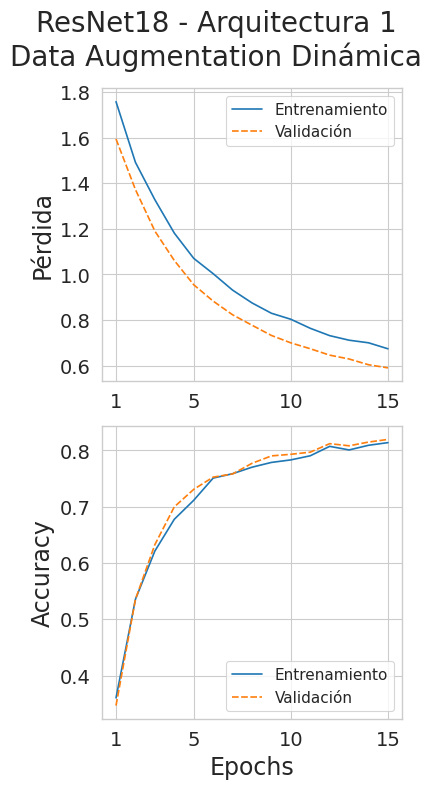

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 1\nData Augmentation Dinámica")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


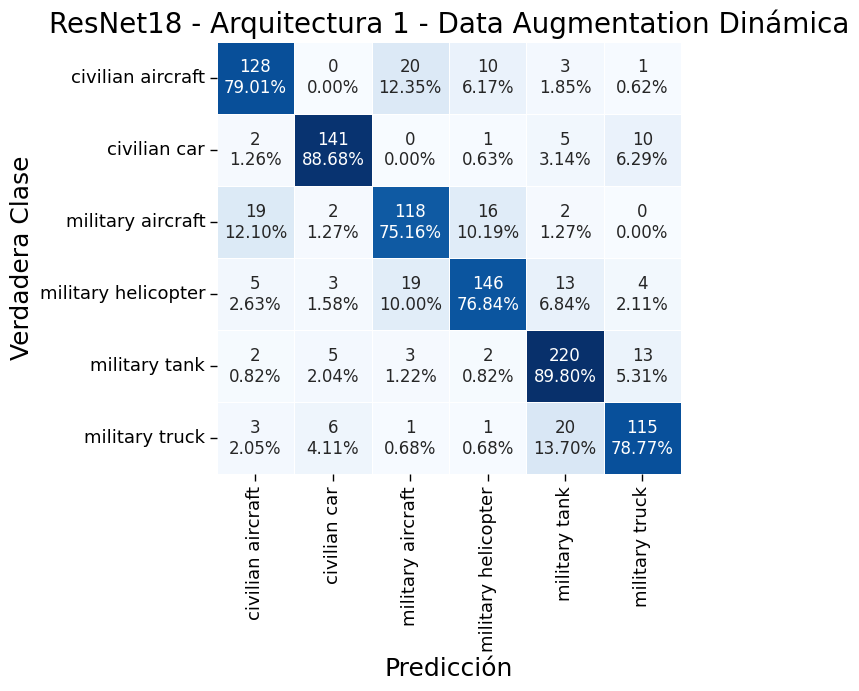

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = None, arch = 1)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 1 - Data Augmentation Dinámica"
)

**Entrenamiento con Data Augmentation Estática**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = None, arch = 1)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 21/04/25 09:10:31


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 1 - Ended: 21/04/25 09:12:40 - Duration: 128.8s

Training Loss: 1.6842566248196273 - Validation Loss: 1.441348952405593
Training Accuracy: 0.40838252656434476 - Validation Accuracy: 0.48725212464589235

Epoch: 2 - Started: 21/04/25 09:12:40


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.16it/s]


Epoch: 2 - Ended: 21/04/25 09:14:51 - Duration: 130.88s

Training Loss: 1.4294298584781475 - Validation Loss: 1.1854438010384054
Training Accuracy: 0.5629279811097992 - Validation Accuracy: 0.6694995278564684

Epoch: 3 - Started: 21/04/25 09:14:51


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 3 - Ended: 21/04/25 09:17:03 - Duration: 131.69s

Training Loss: 1.2544163287575565 - Validation Loss: 1.0097642540931702
Training Accuracy: 0.6344746162927981 - Validation Accuracy: 0.7440982058545798

Epoch: 4 - Started: 21/04/25 09:17:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 4 - Ended: 21/04/25 09:19:16 - Duration: 132.86s

Training Loss: 1.1332543136468574 - Validation Loss: 0.8852797255796545
Training Accuracy: 0.6747343565525383 - Validation Accuracy: 0.7865911237016053

Epoch: 5 - Started: 21/04/25 09:19:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.15it/s]


Epoch: 5 - Ended: 21/04/25 09:21:28 - Duration: 132.93s

Training Loss: 1.0438371087188152 - Validation Loss: 0.7956275799695183
Training Accuracy: 0.7008264462809918 - Validation Accuracy: 0.7979225684608121

Epoch: 6 - Started: 21/04/25 09:21:28


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 6 - Ended: 21/04/25 09:23:43 - Duration: 134.4s

Training Loss: 0.9741791308815799 - Validation Loss: 0.7274874448776245
Training Accuracy: 0.714521841794569 - Validation Accuracy: 0.8196411709159585

Epoch: 7 - Started: 21/04/25 09:23:43


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]


Epoch: 7 - Ended: 21/04/25 09:25:52 - Duration: 129.04s

Training Loss: 0.920678220578094 - Validation Loss: 0.6795353153172661
Training Accuracy: 0.7285714285714285 - Validation Accuracy: 0.8319169027384324

Epoch: 8 - Started: 21/04/25 09:25:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]


Epoch: 8 - Ended: 21/04/25 09:28:00 - Duration: 128.49s

Training Loss: 0.8809799089360593 - Validation Loss: 0.6399146633989671
Training Accuracy: 0.7399055489964581 - Validation Accuracy: 0.8347497639282342

Epoch: 9 - Started: 21/04/25 09:28:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.22it/s]


Epoch: 9 - Ended: 21/04/25 09:30:09 - Duration: 128.48s

Training Loss: 0.847343370985629 - Validation Loss: 0.6120931961957146
Training Accuracy: 0.7440377804014168 - Validation Accuracy: 0.8413597733711048

Epoch: 10 - Started: 21/04/25 09:30:09


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.16it/s]


Epoch: 10 - Ended: 21/04/25 09:32:23 - Duration: 133.79s

Training Loss: 0.824326062380378 - Validation Loss: 0.5812990402474123
Training Accuracy: 0.7505312868949232 - Validation Accuracy: 0.8413597733711048

Epoch: 11 - Started: 21/04/25 09:32:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 11 - Ended: 21/04/25 09:34:34 - Duration: 131.84s

Training Loss: 0.7953597298308984 - Validation Loss: 0.560961795203826
Training Accuracy: 0.7539551357733176 - Validation Accuracy: 0.846081208687441

Epoch: 12 - Started: 21/04/25 09:34:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 12 - Ended: 21/04/25 09:36:44 - Duration: 129.05s

Training Loss: 0.7827518520070545 - Validation Loss: 0.543737365919001
Training Accuracy: 0.7571428571428571 - Validation Accuracy: 0.8526912181303116

Epoch: 13 - Started: 21/04/25 09:36:44


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 13 - Ended: 21/04/25 09:38:52 - Duration: 128.8s

Training Loss: 0.7620700144056064 - Validation Loss: 0.5273713609751534
Training Accuracy: 0.7623376623376623 - Validation Accuracy: 0.8583569405099151

Epoch: 14 - Started: 21/04/25 09:38:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 14 - Ended: 21/04/25 09:41:01 - Duration: 129.05s

Training Loss: 0.7456553836367024 - Validation Loss: 0.5126725557972404
Training Accuracy: 0.7650531286894924 - Validation Accuracy: 0.8574126534466477

Epoch: 15 - Started: 21/04/25 09:41:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]

Epoch: 15 - Ended: 21/04/25 09:43:10 - Duration: 128.55s

Training Loss: 0.7384779880295939 - Validation Loss: 0.5006258014370414
Training Accuracy: 0.7658795749704841 - Validation Accuracy: 0.8611898016997167



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_1_aug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_1_aug.pth", weights_only=False)

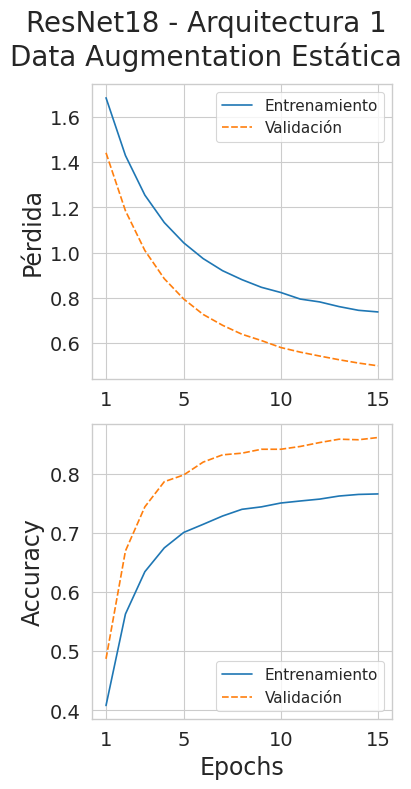

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 1\nData Augmentation Estática")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


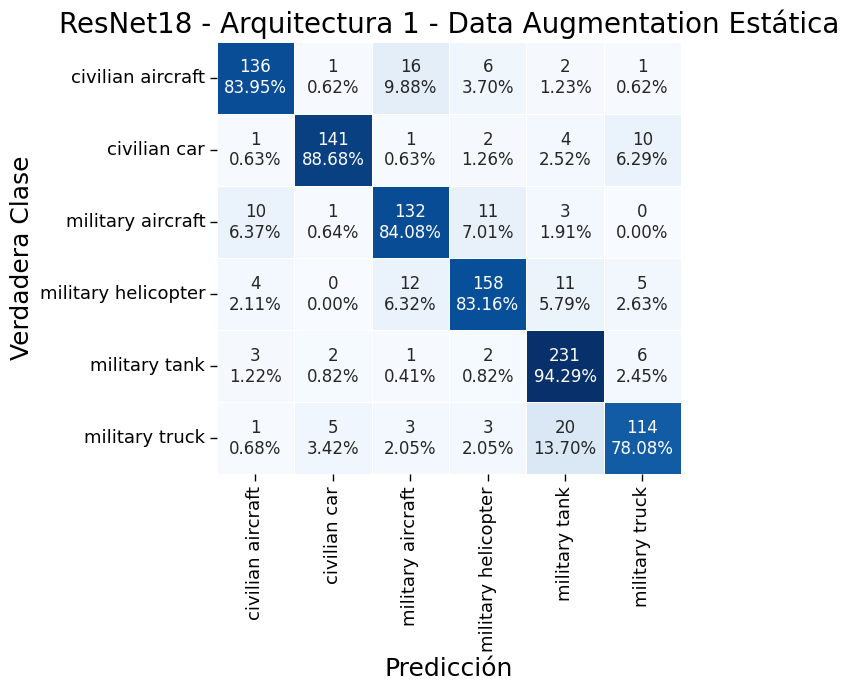

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = None, arch = 1)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 1 - Data Augmentation Estática"
)

##### Arquitectura 2

###### Con ReLU

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation=nn.ReLU(), arch=2)
summary(model_resnet18, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]   

Vemos que, de los 11,246,502 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 69,990. Entrenamos el modelo:

**Entrenamiento con Data Augmentation Dinámica**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.ReLU(), arch = 2)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_daug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 18/04/25 14:09:44


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.22it/s]


Epoch: 1 - Ended: 18/04/25 14:11:38 - Duration: 114.16s

Training Loss: 1.7489621941723041 - Validation Loss: 1.6606557158862842
Training Accuracy: 0.2623376623376623 - Validation Accuracy: 0.2738432483474976

Epoch: 2 - Started: 18/04/25 14:11:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 2 - Ended: 18/04/25 14:13:32 - Duration: 114.14s

Training Loss: 1.63167742472976 - Validation Loss: 1.4518391314674826
Training Accuracy: 0.5272727272727272 - Validation Accuracy: 0.5854579792256847

Epoch: 3 - Started: 18/04/25 14:13:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 3 - Ended: 18/04/25 14:15:25 - Duration: 113.04s

Training Loss: 1.4638210232578106 - Validation Loss: 1.2124205126481897
Training Accuracy: 0.7154663518299882 - Validation Accuracy: 0.7620396600566572

Epoch: 4 - Started: 18/04/25 14:15:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.22it/s]


Epoch: 4 - Ended: 18/04/25 14:17:18 - Duration: 113.16s

Training Loss: 1.2843630100364116 - Validation Loss: 1.0082710981369019
Training Accuracy: 0.7482880755608028 - Validation Accuracy: 0.7847025495750708

Epoch: 5 - Started: 18/04/25 14:17:18


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch: 5 - Ended: 18/04/25 14:19:12 - Duration: 113.55s

Training Loss: 1.1555064578554524 - Validation Loss: 0.8575744278290692
Training Accuracy: 0.7768595041322314 - Validation Accuracy: 0.8035882908404155

Epoch: 6 - Started: 18/04/25 14:19:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]


Epoch: 6 - Ended: 18/04/25 14:21:05 - Duration: 113.26s

Training Loss: 1.0569189155279701 - Validation Loss: 0.7686023466727313
Training Accuracy: 0.7929161747343566 - Validation Accuracy: 0.8196411709159585

Epoch: 7 - Started: 18/04/25 14:21:05


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 7 - Ended: 18/04/25 14:22:59 - Duration: 113.22s

Training Loss: 0.9779735243142541 - Validation Loss: 0.704589983996223
Training Accuracy: 0.7799291617473436 - Validation Accuracy: 0.8083097261567517

Epoch: 8 - Started: 18/04/25 14:22:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch: 8 - Ended: 18/04/25 14:24:52 - Duration: 113.59s

Training Loss: 0.9260548548911934 - Validation Loss: 0.6504903312991647
Training Accuracy: 0.7926800472255018 - Validation Accuracy: 0.826251180358829

Epoch: 9 - Started: 18/04/25 14:24:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]


Epoch: 9 - Ended: 18/04/25 14:26:45 - Duration: 113.02s

Training Loss: 0.9045298161791332 - Validation Loss: 0.6159373504274032
Training Accuracy: 0.8153482880755608 - Validation Accuracy: 0.8366383380547686

Epoch: 10 - Started: 18/04/25 14:26:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 10 - Ended: 18/04/25 14:28:39 - Duration: 113.69s

Training Loss: 0.8412996939758757 - Validation Loss: 0.5831974832450643
Training Accuracy: 0.8181818181818182 - Validation Accuracy: 0.842304060434372

Epoch: 11 - Started: 18/04/25 14:28:39


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch: 11 - Ended: 18/04/25 14:30:32 - Duration: 113.21s

Training Loss: 0.8167306078014089 - Validation Loss: 0.5611583730753731
Training Accuracy: 0.8195985832349468 - Validation Accuracy: 0.8441926345609065

Epoch: 12 - Started: 18/04/25 14:30:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 12 - Ended: 18/04/25 14:32:26 - Duration: 114.08s

Training Loss: 0.784640043529112 - Validation Loss: 0.5363997063216042
Training Accuracy: 0.8323494687131051 - Validation Accuracy: 0.8526912181303116

Epoch: 13 - Started: 18/04/25 14:32:26


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]


Epoch: 13 - Ended: 18/04/25 14:34:19 - Duration: 113.09s

Training Loss: 0.7548108545701895 - Validation Loss: 0.5189037778798271
Training Accuracy: 0.8297520661157025 - Validation Accuracy: 0.8470254957507082

Epoch: 14 - Started: 18/04/25 14:34:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 14 - Ended: 18/04/25 14:36:13 - Duration: 113.77s

Training Loss: 0.7500518724989536 - Validation Loss: 0.511169475667617
Training Accuracy: 0.8193624557260921 - Validation Accuracy: 0.8574126534466477

Epoch: 15 - Started: 18/04/25 14:36:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]

Epoch: 15 - Ended: 18/04/25 14:38:07 - Duration: 114.24s

Training Loss: 0.734140938787318 - Validation Loss: 0.50060114439796
Training Accuracy: 0.8347107438016529 - Validation Accuracy: 0.8517469310670444



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_2relu_daug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_2relu_daug.pth", weights_only=False)

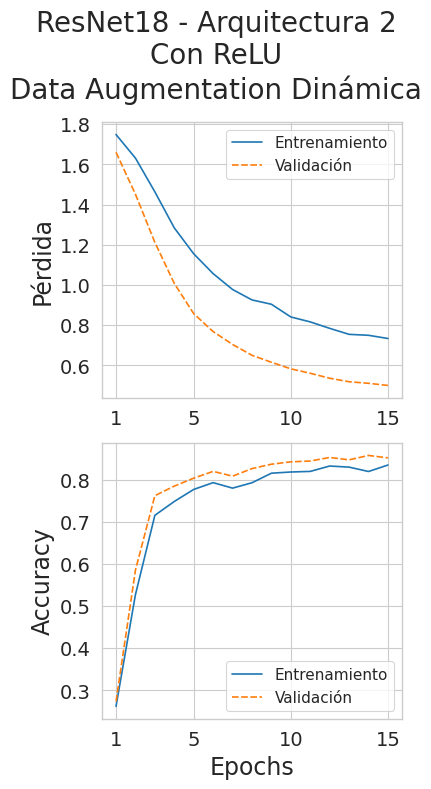

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 2\nCon ReLU\nData Augmentation Dinámica")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


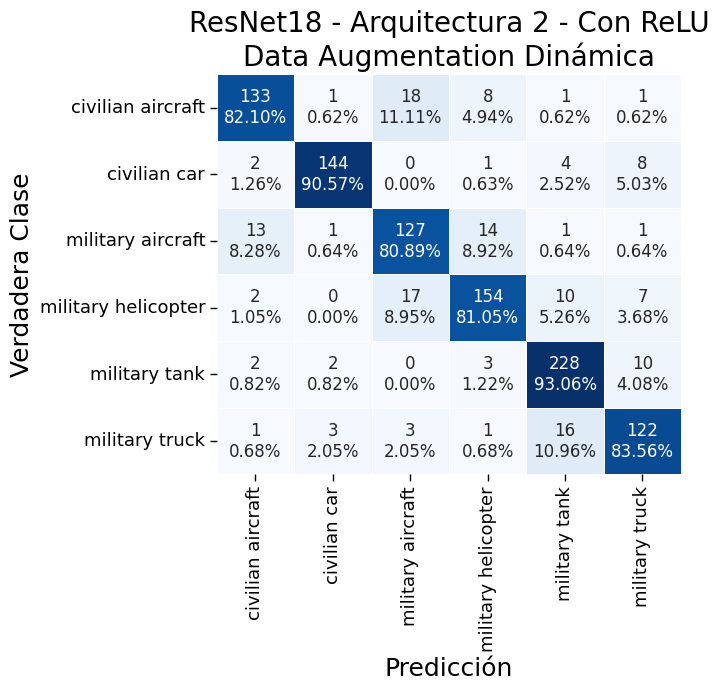

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.ReLU(), arch = 2)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 2 - Con ReLU\nData Augmentation Dinámica"
)

**Entrenamiento con Data Augmentation Estática**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.ReLU(), arch = 2)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 21/04/25 09:43:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 1 - Ended: 21/04/25 09:45:25 - Duration: 126.18s

Training Loss: 1.755427751968156 - Validation Loss: 1.6120609886506025
Training Accuracy: 0.43175914994096815 - Validation Accuracy: 0.5051935788479698

Epoch: 2 - Started: 21/04/25 09:45:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 2 - Ended: 21/04/25 09:47:31 - Duration: 126.23s

Training Loss: 1.600988366710606 - Validation Loss: 1.3154609834446627
Training Accuracy: 0.5860684769775679 - Validation Accuracy: 0.660056657223796

Epoch: 3 - Started: 21/04/25 09:47:31


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 3 - Ended: 21/04/25 09:49:37 - Duration: 126.48s

Training Loss: 1.418097597449573 - Validation Loss: 1.0444196813246782
Training Accuracy: 0.6584415584415585 - Validation Accuracy: 0.7365439093484419

Epoch: 4 - Started: 21/04/25 09:49:37


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 4 - Ended: 21/04/25 09:51:44 - Duration: 126.61s

Training Loss: 1.2453124701087155 - Validation Loss: 0.8556451937731575
Training Accuracy: 0.6998819362455726 - Validation Accuracy: 0.7686496694995278

Epoch: 5 - Started: 21/04/25 09:51:44


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 5 - Ended: 21/04/25 09:53:50 - Duration: 126.17s

Training Loss: 1.128828578030885 - Validation Loss: 0.7430312247837291
Training Accuracy: 0.7198347107438017 - Validation Accuracy: 0.8101983002832861

Epoch: 6 - Started: 21/04/25 09:53:50


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 6 - Ended: 21/04/25 09:55:57 - Duration: 126.46s

Training Loss: 1.0495418345750267 - Validation Loss: 0.6556360581341911
Training Accuracy: 0.7371900826446282 - Validation Accuracy: 0.8224740321057602

Epoch: 7 - Started: 21/04/25 09:55:57


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 7 - Ended: 21/04/25 09:58:03 - Duration: 126.29s

Training Loss: 0.9884141123116906 - Validation Loss: 0.5915357242612278
Training Accuracy: 0.7553719008264462 - Validation Accuracy: 0.8441926345609065

Epoch: 8 - Started: 21/04/25 09:58:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 8 - Ended: 21/04/25 10:00:09 - Duration: 126.18s

Training Loss: 0.9332632822776908 - Validation Loss: 0.5511788357706631
Training Accuracy: 0.7591499409681228 - Validation Accuracy: 0.8470254957507082

Epoch: 9 - Started: 21/04/25 10:00:09


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 9 - Ended: 21/04/25 10:02:16 - Duration: 126.38s

Training Loss: 0.8951950936175105 - Validation Loss: 0.5228423318442177
Training Accuracy: 0.766469893742621 - Validation Accuracy: 0.8555240793201133

Epoch: 10 - Started: 21/04/25 10:02:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 10 - Ended: 21/04/25 10:04:22 - Duration: 126.58s

Training Loss: 0.8649170852419156 - Validation Loss: 0.4933464509599349
Training Accuracy: 0.7743801652892562 - Validation Accuracy: 0.8593012275731823

Epoch: 11 - Started: 21/04/25 10:04:22


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 11 - Ended: 21/04/25 10:06:28 - Duration: 126.24s

Training Loss: 0.8342848197737737 - Validation Loss: 0.4700410190750571
Training Accuracy: 0.7781582054309327 - Validation Accuracy: 0.8640226628895185

Epoch: 12 - Started: 21/04/25 10:06:28


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 12 - Ended: 21/04/25 10:08:35 - Duration: 126.61s

Training Loss: 0.8175731158968228 - Validation Loss: 0.4544733359533198
Training Accuracy: 0.7791027154663518 - Validation Accuracy: 0.8696883852691218

Epoch: 13 - Started: 21/04/25 10:08:35


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 13 - Ended: 21/04/25 10:10:42 - Duration: 126.64s

Training Loss: 0.8017310482352528 - Validation Loss: 0.4534751843003666
Training Accuracy: 0.7805194805194805 - Validation Accuracy: 0.8696883852691218

Epoch: 14 - Started: 21/04/25 10:10:42


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 14 - Ended: 21/04/25 10:12:48 - Duration: 126.52s

Training Loss: 0.7839051538438939 - Validation Loss: 0.43676017575404225
Training Accuracy: 0.7852420306965762 - Validation Accuracy: 0.8715769593956563

Epoch: 15 - Started: 21/04/25 10:12:48


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]

Epoch: 15 - Ended: 21/04/25 10:14:55 - Duration: 126.94s

Training Loss: 0.7768257989812253 - Validation Loss: 0.4283318239099839
Training Accuracy: 0.7878394332939788 - Validation Accuracy: 0.8734655335221907



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_2relu_aug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_2relu_aug.pth", weights_only=False)

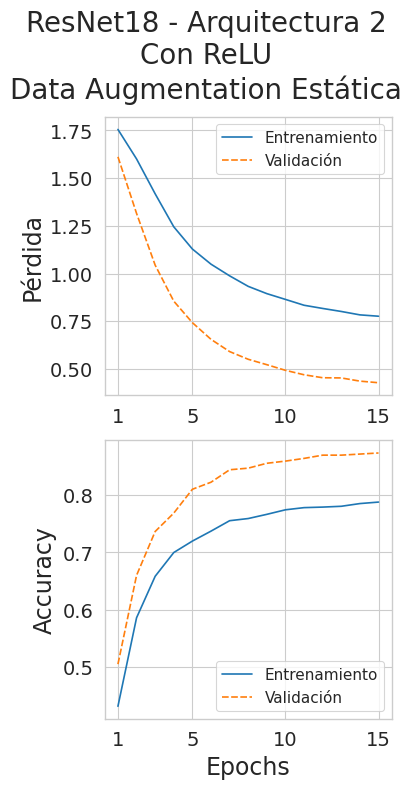

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 2\nCon ReLU\nData Augmentation Estática")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


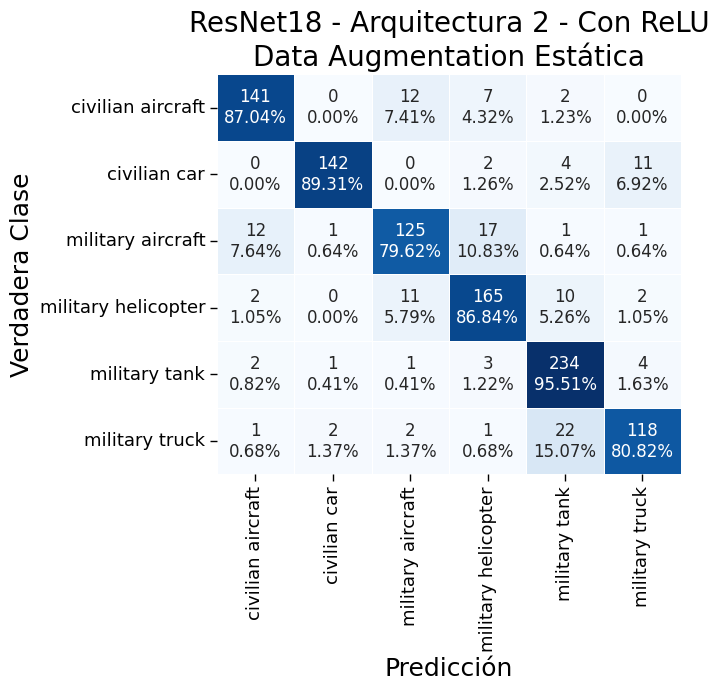

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.ReLU(), arch = 2)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 2 - Con ReLU\nData Augmentation Estática"
)

###### Con tanh

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 2)
summary(model_resnet18, input_size=(1,3, 224, 224))

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]   

Vemos que, de los 11,242,950 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 66,438. Entrenamos el modelo:

**Entrenamiento con Data Augmentation Dinámica**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 2)

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_daug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 18/04/25 22:06:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 1 - Ended: 18/04/25 22:08:35 - Duration: 109.37s

Training Loss: 1.6750064020726219 - Validation Loss: 1.4814429563634537
Training Accuracy: 0.6186540731995277 - Validation Accuracy: 0.6553352219074599

Epoch: 2 - Started: 18/04/25 22:08:35


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 2 - Ended: 18/04/25 22:10:25 - Duration: 109.56s

Training Loss: 1.4307070881573123 - Validation Loss: 1.2304968974169563
Training Accuracy: 0.7572609208972846 - Validation Accuracy: 0.7828139754485364

Epoch: 3 - Started: 18/04/25 22:10:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 3 - Ended: 18/04/25 22:12:15 - Duration: 110.05s

Training Loss: 1.2359520463801141 - Validation Loss: 1.0376002262620365
Training Accuracy: 0.7619834710743801 - Validation Accuracy: 0.785646836638338

Epoch: 4 - Started: 18/04/25 22:12:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 4 - Ended: 18/04/25 22:14:05 - Duration: 109.9s

Training Loss: 1.0966232854928544 - Validation Loss: 0.9063328504562378
Training Accuracy: 0.7811097992916175 - Validation Accuracy: 0.8092540132200189

Epoch: 5 - Started: 18/04/25 22:14:05


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 5 - Ended: 18/04/25 22:15:54 - Duration: 109.52s

Training Loss: 0.9862858048125879 - Validation Loss: 0.8107245950137868
Training Accuracy: 0.7917355371900826 - Validation Accuracy: 0.8111425873465533

Epoch: 6 - Started: 18/04/25 22:15:54


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 6 - Ended: 18/04/25 22:17:44 - Duration: 109.74s

Training Loss: 0.9018107279023128 - Validation Loss: 0.7395547312848708
Training Accuracy: 0.798819362455726 - Validation Accuracy: 0.8196411709159585

Epoch: 7 - Started: 18/04/25 22:17:44


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 7 - Ended: 18/04/25 22:19:34 - Duration: 110.05s

Training Loss: 0.8495157254275991 - Validation Loss: 0.6817897382904502
Training Accuracy: 0.820543093270366 - Validation Accuracy: 0.8328611898016998

Epoch: 8 - Started: 18/04/25 22:19:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 8 - Ended: 18/04/25 22:21:24 - Duration: 109.93s

Training Loss: 0.792419829475346 - Validation Loss: 0.6462825606851017
Training Accuracy: 0.8188902007083825 - Validation Accuracy: 0.830028328611898

Epoch: 9 - Started: 18/04/25 22:21:24


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 9 - Ended: 18/04/25 22:23:13 - Duration: 109.55s

Training Loss: 0.7580130242589694 - Validation Loss: 0.6034544636221493
Training Accuracy: 0.8203069657615112 - Validation Accuracy: 0.842304060434372

Epoch: 10 - Started: 18/04/25 22:23:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 10 - Ended: 18/04/25 22:25:03 - Duration: 109.49s

Training Loss: 0.7183633838126908 - Validation Loss: 0.5785871253294104
Training Accuracy: 0.8325855962219598 - Validation Accuracy: 0.8413597733711048

Epoch: 11 - Started: 18/04/25 22:25:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 11 - Ended: 18/04/25 22:26:53 - Duration: 109.85s

Training Loss: 0.6995628769718 - Validation Loss: 0.554188600357841
Training Accuracy: 0.8212514757969304 - Validation Accuracy: 0.846081208687441

Epoch: 12 - Started: 18/04/25 22:26:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 12 - Ended: 18/04/25 22:28:42 - Duration: 109.65s

Training Loss: 0.6763388710235482 - Validation Loss: 0.5400349164710325
Training Accuracy: 0.8356552538370721 - Validation Accuracy: 0.8489140698772427

Epoch: 13 - Started: 18/04/25 22:28:42


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 13 - Ended: 18/04/25 22:30:32 - Duration: 109.69s

Training Loss: 0.6457658418968543 - Validation Loss: 0.5150831762482139
Training Accuracy: 0.8321133412042503 - Validation Accuracy: 0.8489140698772427

Epoch: 14 - Started: 18/04/25 22:30:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 14 - Ended: 18/04/25 22:32:22 - Duration: 109.82s

Training Loss: 0.6335789031946837 - Validation Loss: 0.5075865265201119
Training Accuracy: 0.8429752066115702 - Validation Accuracy: 0.8470254957507082

Epoch: 15 - Started: 18/04/25 22:32:22


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]

Epoch: 15 - Ended: 18/04/25 22:34:12 - Duration: 110.07s

Training Loss: 0.6286571199324593 - Validation Loss: 0.4917435505810906
Training Accuracy: 0.8467532467532467 - Validation Accuracy: 0.8526912181303116



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_2tanh_daug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_2tanh_daug.pth", weights_only=False)

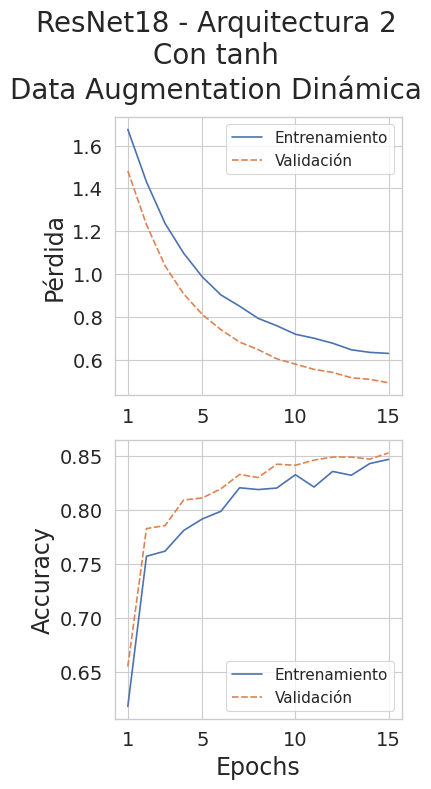

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 2\nCon tanh\nData Augmentation Dinámica")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


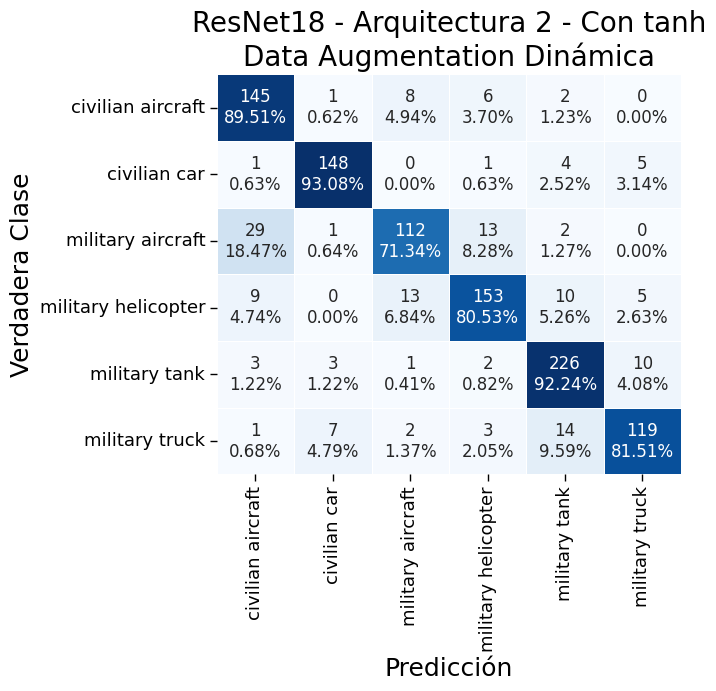

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.Tanh(), arch = 2)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 2 - Con tanh\nData Augmentation Dinámica"
)

**Entrenamiento con Data Augmentation Estática**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 2)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 225MB/s]


In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 13:44:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 1 - Ended: 19/04/25 13:46:31 - Duration: 128.62s

Training Loss: 1.659736144008921 - Validation Loss: 1.4028458034290987
Training Accuracy: 0.5971664698937427 - Validation Accuracy: 0.6931067044381491

Epoch: 2 - Started: 19/04/25 13:46:31


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 2 - Ended: 19/04/25 13:48:36 - Duration: 124.81s

Training Loss: 1.390343383177003 - Validation Loss: 1.102305012590745
Training Accuracy: 0.6937426210153483 - Validation Accuracy: 0.7922568460812087

Epoch: 3 - Started: 19/04/25 13:48:36


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 3 - Ended: 19/04/25 13:50:42 - Duration: 125.22s

Training Loss: 1.196772924110071 - Validation Loss: 0.919641375541687
Training Accuracy: 0.7227863046044865 - Validation Accuracy: 0.8168083097261567

Epoch: 4 - Started: 19/04/25 13:50:42


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 4 - Ended: 19/04/25 13:52:47 - Duration: 125.94s

Training Loss: 1.0727531367273473 - Validation Loss: 0.8002201458987068
Training Accuracy: 0.7386068476977568 - Validation Accuracy: 0.8281397544853636

Epoch: 5 - Started: 19/04/25 13:52:47


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 5 - Ended: 19/04/25 13:54:53 - Duration: 125.15s

Training Loss: 0.9858750674261976 - Validation Loss: 0.718932428780724
Training Accuracy: 0.7439197166469894 - Validation Accuracy: 0.830028328611898

Epoch: 6 - Started: 19/04/25 13:54:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 6 - Ended: 19/04/25 13:56:59 - Duration: 126.0s

Training Loss: 0.9231018504100059 - Validation Loss: 0.6622730984407312
Training Accuracy: 0.7537190082644628 - Validation Accuracy: 0.8451369216241738

Epoch: 7 - Started: 19/04/25 13:56:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 7 - Ended: 19/04/25 13:59:03 - Duration: 124.18s

Training Loss: 0.8759073232536885 - Validation Loss: 0.6159511506557465
Training Accuracy: 0.7639905548996458 - Validation Accuracy: 0.8508026440037771

Epoch: 8 - Started: 19/04/25 13:59:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 8 - Ended: 19/04/25 14:01:07 - Duration: 124.31s

Training Loss: 0.8414868187548509 - Validation Loss: 0.5817337509463815
Training Accuracy: 0.772491145218418 - Validation Accuracy: 0.8555240793201133

Epoch: 9 - Started: 19/04/25 14:01:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 9 - Ended: 19/04/25 14:03:13 - Duration: 125.69s

Training Loss: 0.8107393410668444 - Validation Loss: 0.5521494062507853
Training Accuracy: 0.771310507674144 - Validation Accuracy: 0.8555240793201133

Epoch: 10 - Started: 19/04/25 14:03:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 10 - Ended: 19/04/25 14:05:17 - Duration: 124.39s

Training Loss: 0.786793079838824 - Validation Loss: 0.529831109678044
Training Accuracy: 0.7802833530106258 - Validation Accuracy: 0.8630783758262511

Epoch: 11 - Started: 19/04/25 14:05:17


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 11 - Ended: 19/04/25 14:07:21 - Duration: 124.3s

Training Loss: 0.7614252131376693 - Validation Loss: 0.508969263118856
Training Accuracy: 0.7795749704840614 - Validation Accuracy: 0.8564683663833805

Epoch: 12 - Started: 19/04/25 14:07:21


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 12 - Ended: 19/04/25 14:09:28 - Duration: 126.06s

Training Loss: 0.7438179859474524 - Validation Loss: 0.4898511995287502
Training Accuracy: 0.7867768595041322 - Validation Accuracy: 0.8621340887629839

Epoch: 13 - Started: 19/04/25 14:09:28


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 13 - Ended: 19/04/25 14:11:33 - Duration: 125.22s

Training Loss: 0.7309001114831042 - Validation Loss: 0.475498262573691
Training Accuracy: 0.7929161747343566 - Validation Accuracy: 0.8640226628895185

Epoch: 14 - Started: 19/04/25 14:11:33


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 14 - Ended: 19/04/25 14:13:38 - Duration: 125.48s

Training Loss: 0.7122874233260084 - Validation Loss: 0.4673091225764331
Training Accuracy: 0.7938606847697757 - Validation Accuracy: 0.8687440982058546

Epoch: 15 - Started: 19/04/25 14:13:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]

Epoch: 15 - Ended: 19/04/25 14:15:43 - Duration: 125.19s

Training Loss: 0.7027087193816456 - Validation Loss: 0.454157078090836
Training Accuracy: 0.7958677685950413 - Validation Accuracy: 0.8687440982058546



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_2tanh_aug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_2tanh_aug.pth", weights_only=False)

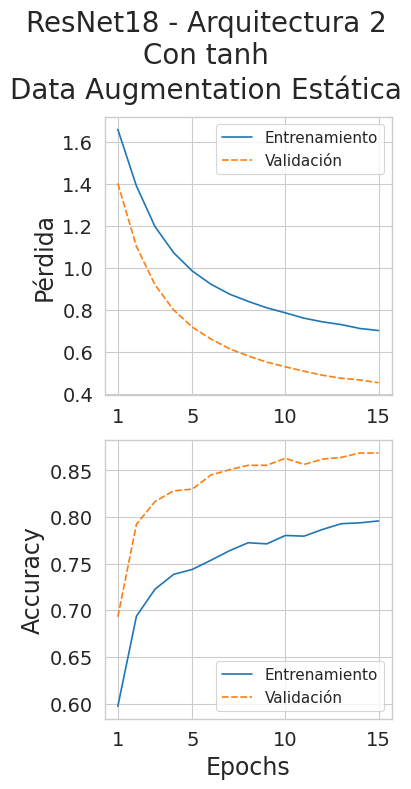

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 2\nCon tanh\nData Augmentation Estática")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


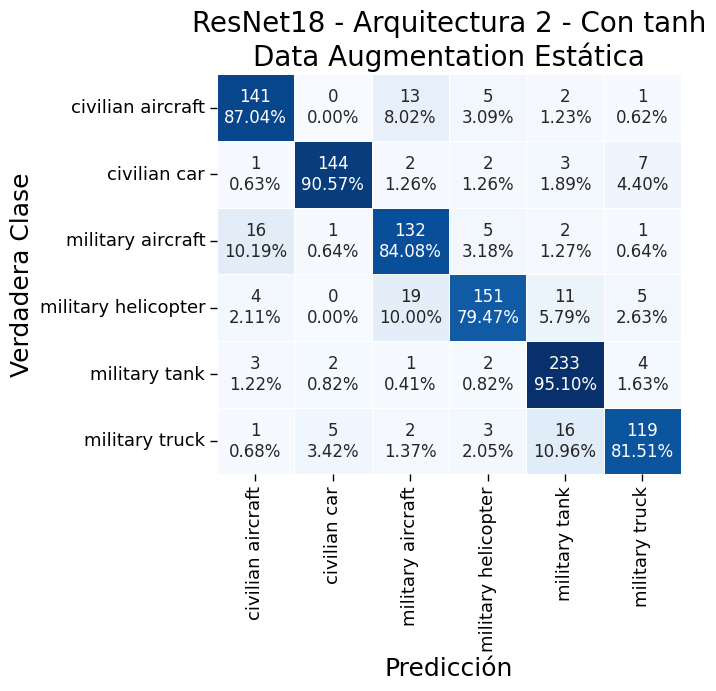

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.Tanh(), arch = 2)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 2 - Con tanh\nData Augmentation Estática"
)

##### Arquitectura 3

###### Con ReLU

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.ReLU(), arch = 3)
summary(model_resnet18, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]   

Vemos que, de los 16,490,918 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 5,314,406. Entrenamos el modelo:

**Entrenamiento con Data Augmentation Dinámica**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.ReLU(), arch = 3)

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_daug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 21/04/25 02:07:04


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.16it/s]


Epoch: 1 - Ended: 21/04/25 02:08:59 - Duration: 115.17s

Training Loss: 1.7301497370449466 - Validation Loss: 1.463369741159327
Training Accuracy: 0.5655253837072018 - Validation Accuracy: 0.6336166194523135

Epoch: 2 - Started: 21/04/25 02:08:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.22it/s]


Epoch: 2 - Ended: 21/04/25 02:10:54 - Duration: 114.6s

Training Loss: 1.365516059434236 - Validation Loss: 0.805373843978433
Training Accuracy: 0.7563164108618654 - Validation Accuracy: 0.7658168083097262

Epoch: 3 - Started: 21/04/25 02:10:54


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch: 3 - Ended: 21/04/25 02:12:49 - Duration: 114.64s

Training Loss: 1.0343940551601238 - Validation Loss: 0.5720406875890844
Training Accuracy: 0.8212514757969304 - Validation Accuracy: 0.8479697828139755

Epoch: 4 - Started: 21/04/25 02:12:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch: 4 - Ended: 21/04/25 02:14:43 - Duration: 114.53s

Training Loss: 0.851487014720689 - Validation Loss: 0.46157200459171743
Training Accuracy: 0.8356552538370721 - Validation Accuracy: 0.8574126534466477

Epoch: 5 - Started: 21/04/25 02:14:43


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 5 - Ended: 21/04/25 02:16:38 - Duration: 114.37s

Training Loss: 0.7693236514703551 - Validation Loss: 0.4306042667697458
Training Accuracy: 0.8460448642266825 - Validation Accuracy: 0.8668555240793201

Epoch: 6 - Started: 21/04/25 02:16:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Epoch: 6 - Ended: 21/04/25 02:18:32 - Duration: 114.27s

Training Loss: 0.6823938186488935 - Validation Loss: 0.4064664568971185
Training Accuracy: 0.8661157024793389 - Validation Accuracy: 0.8762983947119924

Epoch: 7 - Started: 21/04/25 02:18:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 7 - Ended: 21/04/25 02:20:26 - Duration: 114.29s

Training Loss: 0.6497106609949425 - Validation Loss: 0.394873126903001
Training Accuracy: 0.8656434474616292 - Validation Accuracy: 0.8800755429650614

Epoch: 8 - Started: 21/04/25 02:20:26


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 8 - Ended: 21/04/25 02:22:19 - Duration: 112.87s

Training Loss: 0.648832931447385 - Validation Loss: 0.3980635807794683
Training Accuracy: 0.8668240850059031 - Validation Accuracy: 0.8715769593956563

Epoch: 9 - Started: 21/04/25 02:22:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.22it/s]


Epoch: 9 - Ended: 21/04/25 02:24:11 - Duration: 112.52s

Training Loss: 0.5899260293191938 - Validation Loss: 0.4003393137279679
Training Accuracy: 0.8684769775678867 - Validation Accuracy: 0.8659112370160529

Epoch: 10 - Started: 21/04/25 02:24:11


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 10 - Ended: 21/04/25 02:26:04 - Duration: 112.61s

Training Loss: 0.5854078135383662 - Validation Loss: 0.3793453407638213
Training Accuracy: 0.8743801652892562 - Validation Accuracy: 0.8895184135977338

Epoch: 11 - Started: 21/04/25 02:26:04


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 11 - Ended: 21/04/25 02:27:56 - Duration: 112.26s

Training Loss: 0.5456261270081819 - Validation Loss: 0.37615275032380047
Training Accuracy: 0.8791027154663519 - Validation Accuracy: 0.882908404154863

Epoch: 12 - Started: 21/04/25 02:27:56


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 12 - Ended: 21/04/25 02:29:49 - Duration: 112.23s

Training Loss: 0.5227301000659146 - Validation Loss: 0.36829786528559294
Training Accuracy: 0.8795749704840614 - Validation Accuracy: 0.8885741265344664

Epoch: 13 - Started: 21/04/25 02:29:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 13 - Ended: 21/04/25 02:31:41 - Duration: 112.57s

Training Loss: 0.5215012404456068 - Validation Loss: 0.38455259931438107
Training Accuracy: 0.8913813459268005 - Validation Accuracy: 0.8847969782813976

Epoch: 14 - Started: 21/04/25 02:31:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.23it/s]


Epoch: 14 - Ended: 21/04/25 02:33:34 - Duration: 112.5s

Training Loss: 0.5061237505122796 - Validation Loss: 0.3727484717965126
Training Accuracy: 0.889728453364817 - Validation Accuracy: 0.8857412653446648

Epoch: 15 - Started: 21/04/25 02:33:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.22it/s]

Epoch: 15 - Ended: 21/04/25 02:35:26 - Duration: 112.35s

Training Loss: 0.4953408259064404 - Validation Loss: 0.37420933518339605
Training Accuracy: 0.8911452184179457 - Validation Accuracy: 0.8923512747875354



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_3relu_daug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3relu_daug.pth", weights_only=False)

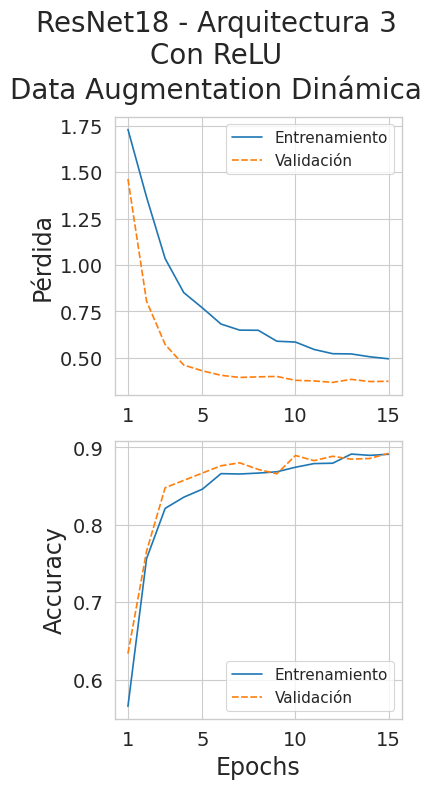

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 3\nCon ReLU\nData Augmentation Dinámica")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


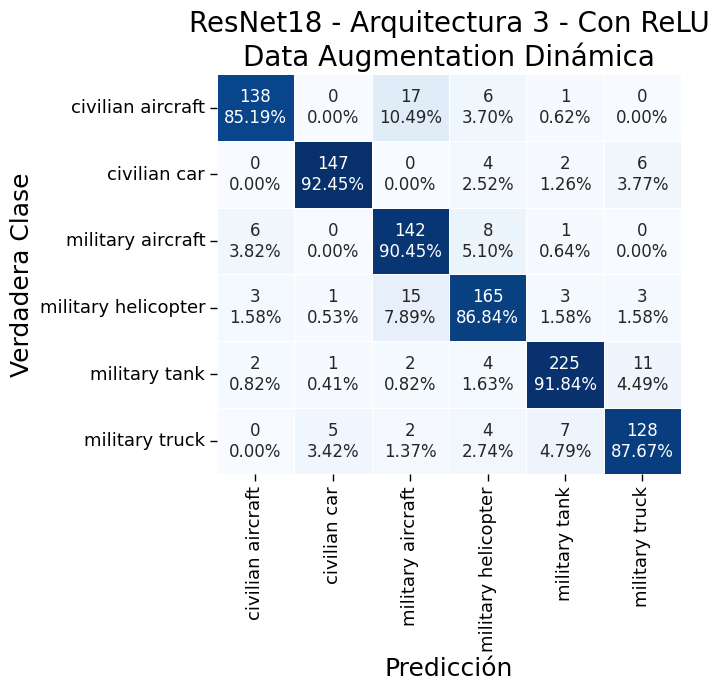

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.ReLU(), arch = 3)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 3 - Con ReLU\nData Augmentation Dinámica"
)

**Entrenamiento con Data Augmentation Estática**


In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.ReLU(), arch = 3)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 21/04/25 11:00:40


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 1 - Ended: 21/04/25 11:02:47 - Duration: 127.33s

Training Loss: 1.6543006149690542 - Validation Loss: 1.1633131363812614
Training Accuracy: 0.5412042502951594 - Validation Accuracy: 0.591123701605288

Epoch: 2 - Started: 21/04/25 11:02:47


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 2 - Ended: 21/04/25 11:04:55 - Duration: 127.54s

Training Loss: 1.1962291829621614 - Validation Loss: 0.5680872377227334
Training Accuracy: 0.7467532467532467 - Validation Accuracy: 0.8375826251180358

Epoch: 3 - Started: 21/04/25 11:04:55


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 3 - Ended: 21/04/25 11:07:02 - Duration: 127.22s

Training Loss: 0.9223727094593333 - Validation Loss: 0.4430560942958383
Training Accuracy: 0.7932703659976387 - Validation Accuracy: 0.8696883852691218

Epoch: 4 - Started: 21/04/25 11:07:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 4 - Ended: 21/04/25 11:09:09 - Duration: 127.31s

Training Loss: 0.8064192017512535 - Validation Loss: 0.3975149445673999
Training Accuracy: 0.8139315230224321 - Validation Accuracy: 0.8781869688385269

Epoch: 5 - Started: 21/04/25 11:09:09


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 5 - Ended: 21/04/25 11:11:16 - Duration: 126.97s

Training Loss: 0.727297983062801 - Validation Loss: 0.3726699978989713
Training Accuracy: 0.8272727272727273 - Validation Accuracy: 0.8819641170915958

Epoch: 6 - Started: 21/04/25 11:11:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 6 - Ended: 21/04/25 11:13:24 - Duration: 127.35s

Training Loss: 0.6798151420123542 - Validation Loss: 0.3706280527745976
Training Accuracy: 0.8370720188902007 - Validation Accuracy: 0.886685552407932

Epoch: 7 - Started: 21/04/25 11:13:24


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]


Epoch: 7 - Ended: 21/04/25 11:15:31 - Duration: 127.21s

Training Loss: 0.6227551013676088 - Validation Loss: 0.349147449083188
Training Accuracy: 0.8558441558441559 - Validation Accuracy: 0.8951841359773371

Epoch: 8 - Started: 21/04/25 11:15:31


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 8 - Ended: 21/04/25 11:17:38 - Duration: 127.07s

Training Loss: 0.5951159334004815 - Validation Loss: 0.36183977433863806
Training Accuracy: 0.8420306965761511 - Validation Accuracy: 0.886685552407932

Epoch: 9 - Started: 21/04/25 11:17:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 9 - Ended: 21/04/25 11:19:46 - Duration: 127.5s

Training Loss: 0.5933390588902715 - Validation Loss: 0.3470933674012913
Training Accuracy: 0.8702479338842976 - Validation Accuracy: 0.9036827195467422

Epoch: 10 - Started: 21/04/25 11:19:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 10 - Ended: 21/04/25 11:21:53 - Duration: 127.5s

Training Loss: 0.5348414053667837 - Validation Loss: 0.35326915321981206
Training Accuracy: 0.8729634002361275 - Validation Accuracy: 0.8895184135977338

Epoch: 11 - Started: 21/04/25 11:21:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 11 - Ended: 21/04/25 11:24:00 - Duration: 126.86s

Training Loss: 0.5143970860474145 - Validation Loss: 0.3346315753810546
Training Accuracy: 0.8867768595041322 - Validation Accuracy: 0.902738432483475

Epoch: 12 - Started: 21/04/25 11:24:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 12 - Ended: 21/04/25 11:26:07 - Duration: 127.25s

Training Loss: 0.47998630155378313 - Validation Loss: 0.3814779406084734
Training Accuracy: 0.8847697756788666 - Validation Accuracy: 0.8942398489140698

Epoch: 13 - Started: 21/04/25 11:26:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 13 - Ended: 21/04/25 11:28:15 - Duration: 127.44s

Training Loss: 0.44888055724884146 - Validation Loss: 0.3534073222647695
Training Accuracy: 0.9063754427390791 - Validation Accuracy: 0.9055712936732767

Epoch: 14 - Started: 21/04/25 11:28:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 14 - Ended: 21/04/25 11:30:22 - Duration: 127.55s

Training Loss: 0.4301860821780874 - Validation Loss: 0.3356119850102593
Training Accuracy: 0.9166469893742621 - Validation Accuracy: 0.9084041548630784

Epoch: 15 - Started: 21/04/25 11:30:22


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]

Epoch: 15 - Ended: 21/04/25 11:32:29 - Duration: 127.35s

Training Loss: 0.4055239002206432 - Validation Loss: 0.35713068702641654
Training Accuracy: 0.9121605667060213 - Validation Accuracy: 0.902738432483475



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_3relu_aug_aux.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3relu_aug_aux.pth", weights_only=False)

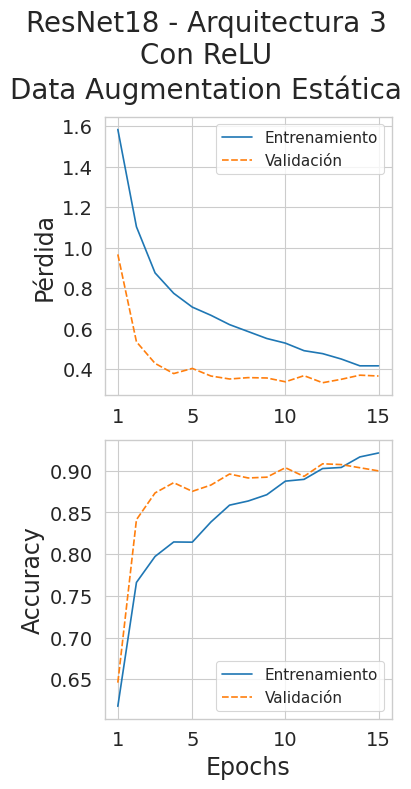

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 3\nCon ReLU\nData Augmentation Estática")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


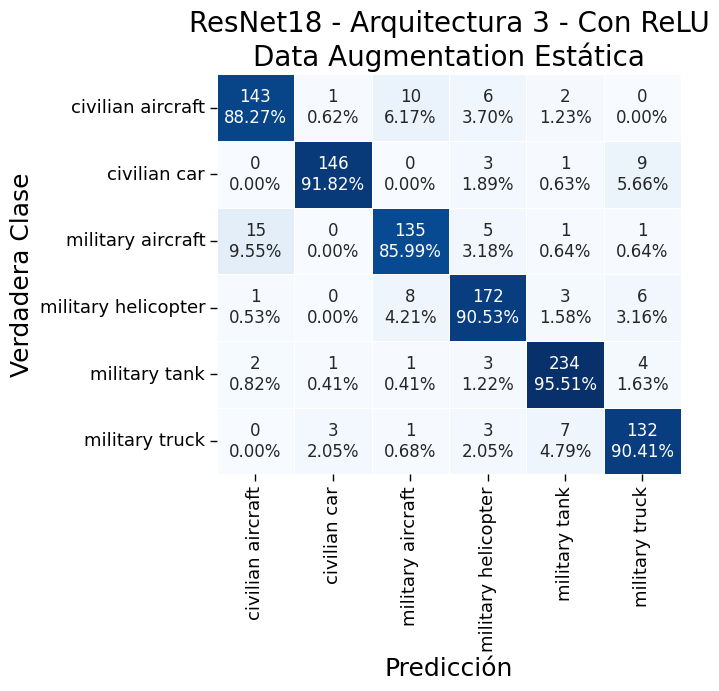

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.ReLU(), arch = 3)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
# model_resnet18_best.load_state_dict(checkpoint["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 3 - Con ReLU\nData Augmentation Estática"
)

###### Con tanh

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 3)
summary(model_resnet18, input_size=(1, 3, 224, 224))

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]   

Vemos que, de los 11,242,950 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 66,438. Entrenamos el modelo:

**Entrenamiento con Data Augmentation Dinámica**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 3)

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_daug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 18/04/25 23:21:42


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 1 - Ended: 18/04/25 23:23:33 - Duration: 110.32s

Training Loss: 1.4739470143816364 - Validation Loss: 1.0593124452759237
Training Accuracy: 0.7468713105076742 - Validation Accuracy: 0.7431539187913125

Epoch: 2 - Started: 18/04/25 23:23:33


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 2 - Ended: 18/04/25 23:25:22 - Duration: 109.38s

Training Loss: 1.0263249367030698 - Validation Loss: 0.7869975111063789
Training Accuracy: 0.8233766233766234 - Validation Accuracy: 0.8441926345609065

Epoch: 3 - Started: 18/04/25 23:25:22


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 3 - Ended: 18/04/25 23:27:12 - Duration: 109.91s

Training Loss: 0.8591711574525975 - Validation Loss: 0.6724880968823153
Training Accuracy: 0.8486422668240851 - Validation Accuracy: 0.8526912181303116

Epoch: 4 - Started: 18/04/25 23:27:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 4 - Ended: 18/04/25 23:29:02 - Duration: 109.84s

Training Loss: 0.7538303715079578 - Validation Loss: 0.599793462192311
Training Accuracy: 0.8599763872491145 - Validation Accuracy: 0.8696883852691218

Epoch: 5 - Started: 18/04/25 23:29:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 5 - Ended: 18/04/25 23:30:51 - Duration: 109.6s

Training Loss: 0.7017810727233318 - Validation Loss: 0.5531072704231038
Training Accuracy: 0.8566706021251476 - Validation Accuracy: 0.8696883852691218

Epoch: 6 - Started: 18/04/25 23:30:51


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 6 - Ended: 18/04/25 23:32:41 - Duration: 109.77s

Training Loss: 0.6496040607566265 - Validation Loss: 0.5171710024861729
Training Accuracy: 0.8696576151121606 - Validation Accuracy: 0.8857412653446648

Epoch: 7 - Started: 18/04/25 23:32:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 7 - Ended: 18/04/25 23:34:31 - Duration: 109.4s

Training Loss: 0.6104095266826117 - Validation Loss: 0.4806266795186436
Training Accuracy: 0.8817001180637545 - Validation Accuracy: 0.8781869688385269

Epoch: 8 - Started: 18/04/25 23:34:31


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 8 - Ended: 18/04/25 23:36:20 - Duration: 109.41s

Training Loss: 0.5831579356940825 - Validation Loss: 0.45080752232495475
Training Accuracy: 0.8857142857142857 - Validation Accuracy: 0.8772426817752597

Epoch: 9 - Started: 18/04/25 23:36:20


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 9 - Ended: 18/04/25 23:38:09 - Duration: 109.49s

Training Loss: 0.5512581725618733 - Validation Loss: 0.4308244664879406
Training Accuracy: 0.8894923258559623 - Validation Accuracy: 0.8781869688385269

Epoch: 10 - Started: 18/04/25 23:38:09


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 10 - Ended: 18/04/25 23:39:59 - Duration: 109.49s

Training Loss: 0.5291382474685783 - Validation Loss: 0.43101509441347685
Training Accuracy: 0.8930342384887839 - Validation Accuracy: 0.8847969782813976

Epoch: 11 - Started: 18/04/25 23:39:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 11 - Ended: 18/04/25 23:41:48 - Duration: 109.53s

Training Loss: 0.49697780475687625 - Validation Loss: 0.4140971977921093
Training Accuracy: 0.8890200708382526 - Validation Accuracy: 0.8914069877242682

Epoch: 12 - Started: 18/04/25 23:41:48


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 12 - Ended: 18/04/25 23:43:38 - Duration: 109.82s

Training Loss: 0.4914676507017506 - Validation Loss: 0.39849889891989093
Training Accuracy: 0.8956316410861865 - Validation Accuracy: 0.8876298394711992

Epoch: 13 - Started: 18/04/25 23:43:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 13 - Ended: 18/04/25 23:45:28 - Duration: 109.78s

Training Loss: 0.48692432802114916 - Validation Loss: 0.3908212123548283
Training Accuracy: 0.89185360094451 - Validation Accuracy: 0.8961284230406044

Epoch: 14 - Started: 18/04/25 23:45:28


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 14 - Ended: 18/04/25 23:47:18 - Duration: 109.57s

Training Loss: 0.4548816778766575 - Validation Loss: 0.41519004807752724
Training Accuracy: 0.8847697756788666 - Validation Accuracy: 0.8810198300283286

Epoch: 15 - Started: 18/04/25 23:47:18


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]

Epoch: 15 - Ended: 18/04/25 23:49:07 - Duration: 109.86s

Training Loss: 0.4693245776553652 - Validation Loss: 0.41085799213717966
Training Accuracy: 0.8833530106257379 - Validation Accuracy: 0.8781869688385269



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_3tanh_daug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3tanh_daug.pth", weights_only=False)

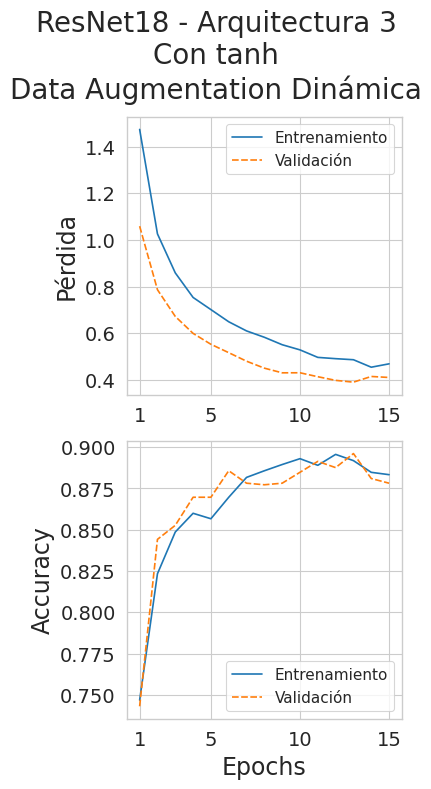

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 3\nCon tanh\nData Augmentation Dinámica")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


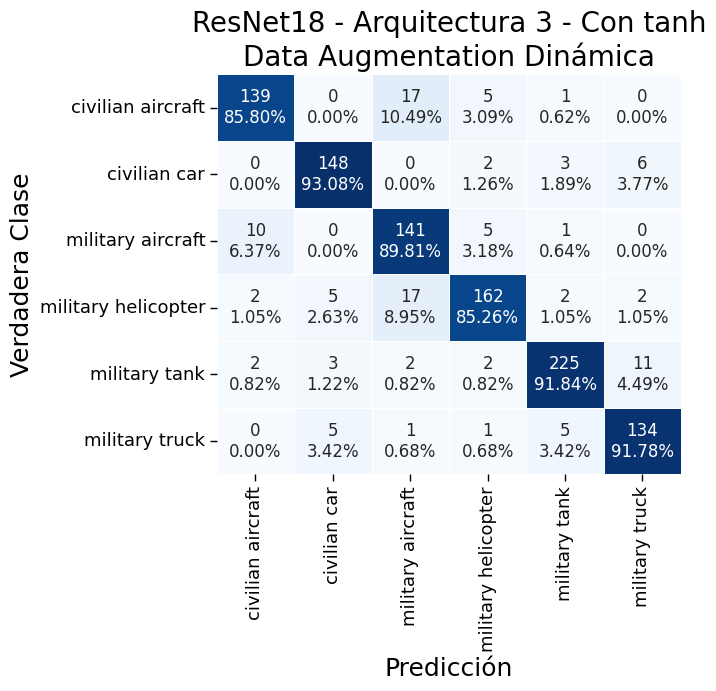

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.Tanh(), arch = 3)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 3 - Con tanh\nData Augmentation Dinámica"
)

**Entrenamiento con Data Augmentation Estática**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 3)

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 21/04/25 11:33:08


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 1 - Ended: 21/04/25 11:35:15 - Duration: 127.51s

Training Loss: 1.4514391351102003 - Validation Loss: 0.9784461890949923
Training Accuracy: 0.7321133412042503 - Validation Accuracy: 0.8158640226628895

Epoch: 2 - Started: 21/04/25 11:35:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 2 - Ended: 21/04/25 11:37:23 - Duration: 127.98s

Training Loss: 1.0464900367295564 - Validation Loss: 0.714893547927632
Training Accuracy: 0.7968122786304604 - Validation Accuracy: 0.8555240793201133

Epoch: 3 - Started: 21/04/25 11:37:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 3 - Ended: 21/04/25 11:39:31 - Duration: 127.81s

Training Loss: 0.8656359483946615 - Validation Loss: 0.5833468752748826
Training Accuracy: 0.8301062573789847 - Validation Accuracy: 0.8800755429650614

Epoch: 4 - Started: 21/04/25 11:39:31


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 4 - Ended: 21/04/25 11:41:38 - Duration: 127.49s

Training Loss: 0.7486118425184222 - Validation Loss: 0.5091247295632082
Training Accuracy: 0.8590318772136954 - Validation Accuracy: 0.8847969782813976

Epoch: 5 - Started: 21/04/25 11:41:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 5 - Ended: 21/04/25 11:43:46 - Duration: 127.63s

Training Loss: 0.6814729589134899 - Validation Loss: 0.46521371077088747
Training Accuracy: 0.8706021251475797 - Validation Accuracy: 0.8961284230406044

Epoch: 6 - Started: 21/04/25 11:43:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 6 - Ended: 21/04/25 11:45:52 - Duration: 126.41s

Training Loss: 0.6091657183063564 - Validation Loss: 0.42195066984962015
Training Accuracy: 0.8927981109799291 - Validation Accuracy: 0.8980169971671388

Epoch: 7 - Started: 21/04/25 11:45:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 7 - Ended: 21/04/25 11:48:00 - Duration: 127.86s

Training Loss: 0.5500931366166072 - Validation Loss: 0.4144119453780791
Training Accuracy: 0.9005903187721369 - Validation Accuracy: 0.898961284230406

Epoch: 8 - Started: 21/04/25 11:48:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 8 - Ended: 21/04/25 11:50:08 - Duration: 127.26s

Training Loss: 0.5073860305458752 - Validation Loss: 0.39478956250583425
Training Accuracy: 0.9092089728453365 - Validation Accuracy: 0.9008498583569405

Epoch: 9 - Started: 21/04/25 11:50:08


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 9 - Ended: 21/04/25 11:52:15 - Duration: 127.58s

Training Loss: 0.47293629486169386 - Validation Loss: 0.38502486751360054
Training Accuracy: 0.9096812278630461 - Validation Accuracy: 0.8951841359773371

Epoch: 10 - Started: 21/04/25 11:52:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 10 - Ended: 21/04/25 11:54:23 - Duration: 127.48s

Training Loss: 0.43886542008883916 - Validation Loss: 0.3833840086179621
Training Accuracy: 0.925974025974026 - Validation Accuracy: 0.8932955618508026

Epoch: 11 - Started: 21/04/25 11:54:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 11 - Ended: 21/04/25 11:56:30 - Duration: 127.07s

Training Loss: 0.42440619041670613 - Validation Loss: 0.3717011940829894
Training Accuracy: 0.9285714285714286 - Validation Accuracy: 0.8970727101038716

Epoch: 12 - Started: 21/04/25 11:56:30


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 12 - Ended: 21/04/25 11:58:37 - Duration: 127.16s

Training Loss: 0.3977890076921947 - Validation Loss: 0.378920597188613
Training Accuracy: 0.9312868949232586 - Validation Accuracy: 0.886685552407932

Epoch: 13 - Started: 21/04/25 11:58:37


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 13 - Ended: 21/04/25 12:00:44 - Duration: 127.29s

Training Loss: 0.3600720760982428 - Validation Loss: 0.34493761202868295
Training Accuracy: 0.9495867768595041 - Validation Accuracy: 0.9084041548630784

Epoch: 14 - Started: 21/04/25 12:00:44


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 14 - Ended: 21/04/25 12:02:52 - Duration: 127.53s

Training Loss: 0.3359684030066675 - Validation Loss: 0.3505510175052811
Training Accuracy: 0.9547815820543093 - Validation Accuracy: 0.9046270066100094

Epoch: 15 - Started: 21/04/25 12:02:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]

Epoch: 15 - Ended: 21/04/25 12:04:59 - Duration: 126.94s

Training Loss: 0.3235932139318381 - Validation Loss: 0.3632803589982145
Training Accuracy: 0.9563164108618654 - Validation Accuracy: 0.8980169971671388



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_3tanh_aug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3tanh_aug.pth", weights_only=False)

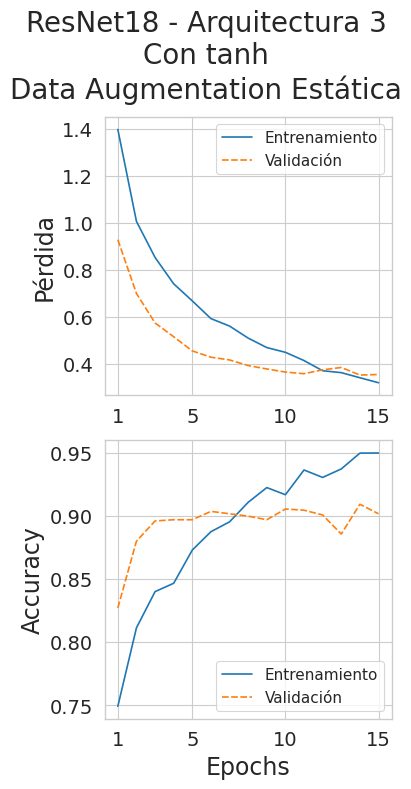

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 3\nCon tanh\nData Augmentation Estática")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

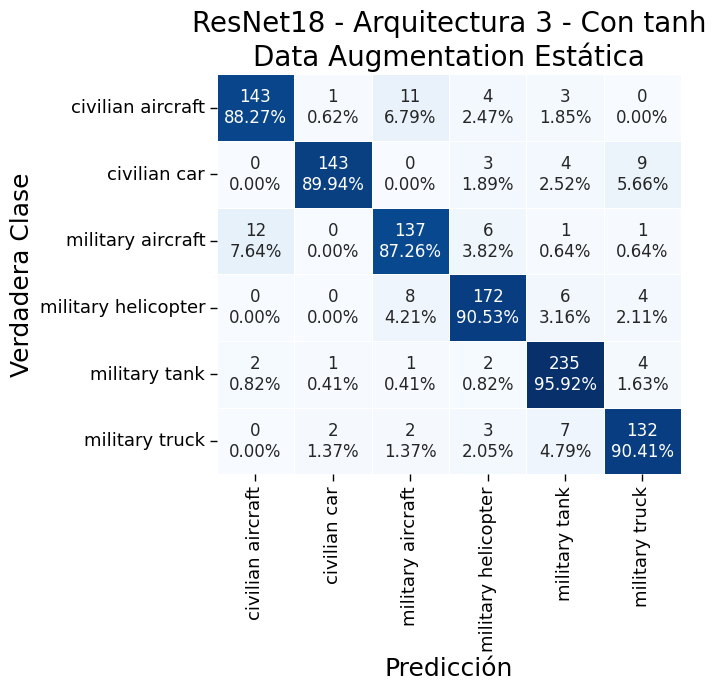

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.Tanh(), arch = 3)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 3 - Con tanh\nData Augmentation Estática"
)

##### Arquitectura 4

###### Con ReLU

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.ReLU(), arch = 4)
summary(model_resnet18, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]   

Vemos que, de los 29,074,854 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 17,898,342. Entrenamos el modelo:

**Entrenamiento con Data Augmentation Dinámica**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.ReLU(), arch = 4)

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_daug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 00:36:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 1 - Ended: 19/04/25 00:37:50 - Duration: 107.99s

Training Loss: 1.648220725913546 - Validation Loss: 1.2429391426198624
Training Accuracy: 0.564344746162928 - Validation Accuracy: 0.5901794145420207

Epoch: 2 - Started: 19/04/25 00:37:50


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 2 - Ended: 19/04/25 00:39:37 - Duration: 107.57s

Training Loss: 1.216457514620539 - Validation Loss: 0.7659004646189073
Training Accuracy: 0.7619834710743801 - Validation Accuracy: 0.7478753541076487

Epoch: 3 - Started: 19/04/25 00:39:37


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 3 - Ended: 19/04/25 00:41:25 - Duration: 107.4s

Training Loss: 0.9442830619527333 - Validation Loss: 0.5757403811987709
Training Accuracy: 0.7948051948051948 - Validation Accuracy: 0.785646836638338

Epoch: 4 - Started: 19/04/25 00:41:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 4 - Ended: 19/04/25 00:43:12 - Duration: 107.96s

Training Loss: 0.787819992250471 - Validation Loss: 0.4789835337330313
Training Accuracy: 0.8406139315230224 - Validation Accuracy: 0.8489140698772427

Epoch: 5 - Started: 19/04/25 00:43:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 5 - Ended: 19/04/25 00:45:01 - Duration: 108.15s

Training Loss: 0.7595680738562969 - Validation Loss: 0.46127362286343293
Training Accuracy: 0.8517119244391972 - Validation Accuracy: 0.8498583569405099

Epoch: 6 - Started: 19/04/25 00:45:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 6 - Ended: 19/04/25 00:46:49 - Duration: 108.02s

Training Loss: 0.692629669584445 - Validation Loss: 0.444204198086963
Training Accuracy: 0.8439197166469894 - Validation Accuracy: 0.8545797922568461

Epoch: 7 - Started: 19/04/25 00:46:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 7 - Ended: 19/04/25 00:48:36 - Duration: 107.85s

Training Loss: 0.6335835732630829 - Validation Loss: 0.40383681041352887
Training Accuracy: 0.8590318772136954 - Validation Accuracy: 0.8706326723323891

Epoch: 8 - Started: 19/04/25 00:48:36


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 8 - Ended: 19/04/25 00:50:25 - Duration: 108.26s

Training Loss: 0.6038235799590154 - Validation Loss: 0.38830312560586366
Training Accuracy: 0.8675324675324675 - Validation Accuracy: 0.8772426817752597

Epoch: 9 - Started: 19/04/25 00:50:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 9 - Ended: 19/04/25 00:52:13 - Duration: 107.99s

Training Loss: 0.5801652238440158 - Validation Loss: 0.40697379410266876
Training Accuracy: 0.8680047225501771 - Validation Accuracy: 0.8715769593956563

Epoch: 10 - Started: 19/04/25 00:52:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 10 - Ended: 19/04/25 00:54:01 - Duration: 108.0s

Training Loss: 0.5433966455174916 - Validation Loss: 0.40611332567299113
Training Accuracy: 0.8774498229043683 - Validation Accuracy: 0.8753541076487252

Epoch: 11 - Started: 19/04/25 00:54:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 11 - Ended: 19/04/25 00:55:49 - Duration: 108.11s

Training Loss: 0.5235990615033391 - Validation Loss: 0.37633294918957877
Training Accuracy: 0.8878394332939787 - Validation Accuracy: 0.886685552407932

Epoch: 12 - Started: 19/04/25 00:55:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 12 - Ended: 19/04/25 00:57:37 - Duration: 108.03s

Training Loss: 0.5257088177239717 - Validation Loss: 0.43756406491293626
Training Accuracy: 0.8632821723730815 - Validation Accuracy: 0.8659112370160529

Epoch: 13 - Started: 19/04/25 00:57:37


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 13 - Ended: 19/04/25 00:59:25 - Duration: 108.14s

Training Loss: 0.5126513945522593 - Validation Loss: 0.3784383241744602
Training Accuracy: 0.8899645808736718 - Validation Accuracy: 0.886685552407932

Epoch: 14 - Started: 19/04/25 00:59:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 14 - Ended: 19/04/25 01:01:13 - Duration: 108.1s

Training Loss: 0.48821458465127804 - Validation Loss: 0.40620100410545573
Training Accuracy: 0.8852420306965761 - Validation Accuracy: 0.8706326723323891

Epoch: 15 - Started: 19/04/25 01:01:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]

Epoch: 15 - Ended: 19/04/25 01:03:01 - Duration: 107.59s

Training Loss: 0.49180277425851393 - Validation Loss: 0.38918725444990043
Training Accuracy: 0.8852420306965761 - Validation Accuracy: 0.8800755429650614



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_4relu_daug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4relu_daug.pth", weights_only=False)

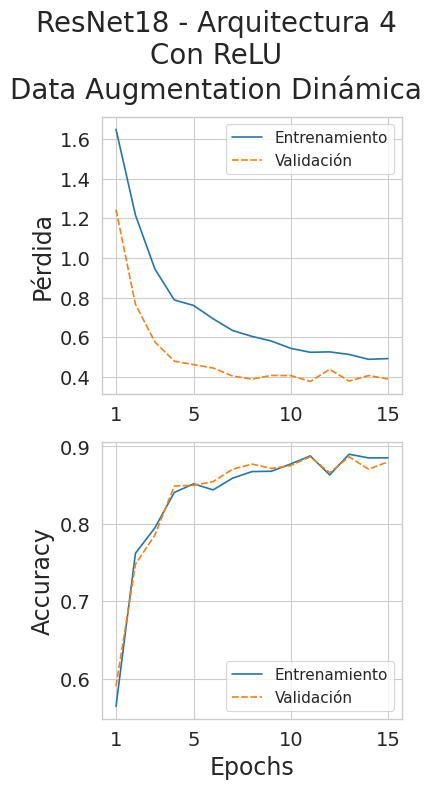

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 4\nCon ReLU\nData Augmentation Dinámica")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


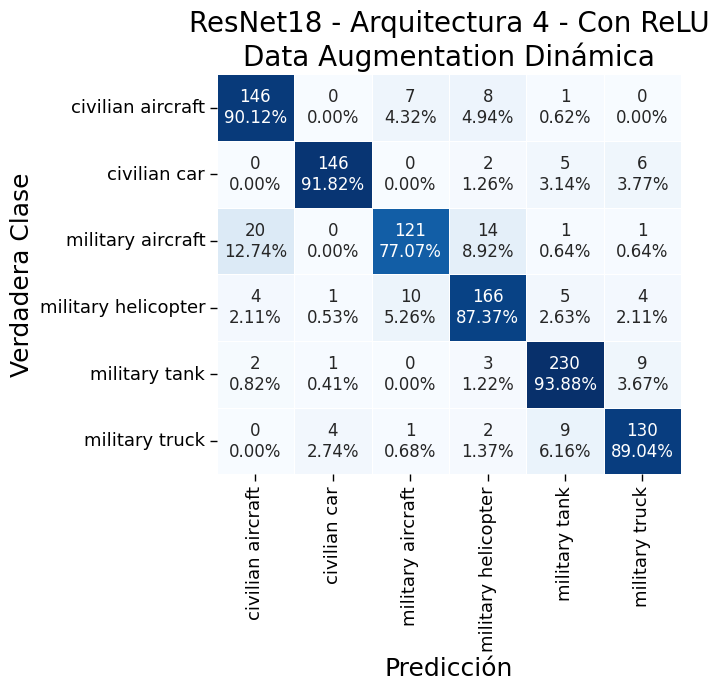

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.ReLU(), arch = 4)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 4 - Con ReLU\nData Augmentation Dinámica"
)

**Entrenamiento con Data Augmentation Estática**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.ReLU(), arch = 4)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 21/04/25 10:15:05


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]


Epoch: 1 - Ended: 21/04/25 10:17:13 - Duration: 127.76s

Training Loss: 1.5008884757312375 - Validation Loss: 0.8592782967230853
Training Accuracy: 0.6399055489964581 - Validation Accuracy: 0.6742209631728046

Epoch: 2 - Started: 21/04/25 10:17:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 2 - Ended: 21/04/25 10:19:20 - Duration: 127.26s

Training Loss: 1.0357974011506608 - Validation Loss: 0.5132018204997567
Training Accuracy: 0.7801652892561983 - Validation Accuracy: 0.8413597733711048

Epoch: 3 - Started: 21/04/25 10:19:20


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 3 - Ended: 21/04/25 10:21:27 - Duration: 127.6s

Training Loss: 0.8492217455337296 - Validation Loss: 0.4359836105038138
Training Accuracy: 0.7906729634002361 - Validation Accuracy: 0.8687440982058546

Epoch: 4 - Started: 21/04/25 10:21:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 4 - Ended: 21/04/25 10:23:35 - Duration: 127.63s

Training Loss: 0.7494434954515145 - Validation Loss: 0.36649571578292284
Training Accuracy: 0.8334120425029516 - Validation Accuracy: 0.8847969782813976

Epoch: 5 - Started: 21/04/25 10:23:35


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 5 - Ended: 21/04/25 10:25:43 - Duration: 127.88s

Training Loss: 0.6565028335621108 - Validation Loss: 0.3612452951424262
Training Accuracy: 0.8402597402597403 - Validation Accuracy: 0.8932955618508026

Epoch: 6 - Started: 21/04/25 10:25:43


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 6 - Ended: 21/04/25 10:27:50 - Duration: 127.22s

Training Loss: 0.608334506180749 - Validation Loss: 0.3960359052700155
Training Accuracy: 0.8420306965761511 - Validation Accuracy: 0.886685552407932

Epoch: 7 - Started: 21/04/25 10:27:50


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 7 - Ended: 21/04/25 10:29:57 - Duration: 127.29s

Training Loss: 0.5541511863025267 - Validation Loss: 0.4103378504514694
Training Accuracy: 0.8621015348288076 - Validation Accuracy: 0.8753541076487252

Epoch: 8 - Started: 21/04/25 10:29:57


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 8 - Ended: 21/04/25 10:32:05 - Duration: 127.22s

Training Loss: 0.5324284461007189 - Validation Loss: 0.3957335098701365
Training Accuracy: 0.8871310507674144 - Validation Accuracy: 0.8885741265344664

Epoch: 9 - Started: 21/04/25 10:32:05


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.28it/s]


Epoch: 9 - Ended: 21/04/25 10:34:12 - Duration: 127.52s

Training Loss: 0.4884800377176769 - Validation Loss: 0.35363833693897023
Training Accuracy: 0.9003541912632822 - Validation Accuracy: 0.898961284230406

Epoch: 10 - Started: 21/04/25 10:34:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.24it/s]


Epoch: 10 - Ended: 21/04/25 10:36:19 - Duration: 127.08s

Training Loss: 0.4509352668007808 - Validation Loss: 0.35218287346994176
Training Accuracy: 0.9072018890200708 - Validation Accuracy: 0.9074598677998111

Epoch: 11 - Started: 21/04/25 10:36:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 11 - Ended: 21/04/25 10:38:27 - Duration: 127.4s

Training Loss: 0.4300163646242512 - Validation Loss: 0.4266640561468461
Training Accuracy: 0.9095631641086187 - Validation Accuracy: 0.8885741265344664

Epoch: 12 - Started: 21/04/25 10:38:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 12 - Ended: 21/04/25 10:40:34 - Duration: 127.21s

Training Loss: 0.4312529924200542 - Validation Loss: 0.4191051747869043
Training Accuracy: 0.9179456906729634 - Validation Accuracy: 0.8942398489140698

Epoch: 13 - Started: 21/04/25 10:40:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 13 - Ended: 21/04/25 10:42:41 - Duration: 127.34s

Training Loss: 0.39823494896070283 - Validation Loss: 0.36536438149564404
Training Accuracy: 0.9219598583234947 - Validation Accuracy: 0.9046270066100094

Epoch: 14 - Started: 21/04/25 10:42:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 14 - Ended: 21/04/25 10:44:49 - Duration: 127.48s

Training Loss: 0.34727620077666954 - Validation Loss: 0.3672383736599894
Training Accuracy: 0.9363636363636364 - Validation Accuracy: 0.9102927289896129

Epoch: 15 - Started: 21/04/25 10:44:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]

Epoch: 15 - Ended: 21/04/25 10:46:56 - Duration: 127.5s

Training Loss: 0.3244782528325693 - Validation Loss: 0.40242692658348994
Training Accuracy: 0.9510035419126328 - Validation Accuracy: 0.9074598677998111



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_4relu_aug_aux.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4relu_aug_aux.pth", weights_only=False)

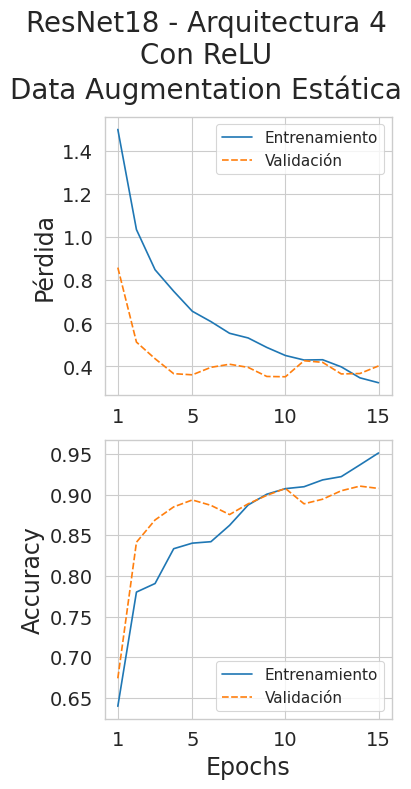

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 4\nCon ReLU\nData Augmentation Estática")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


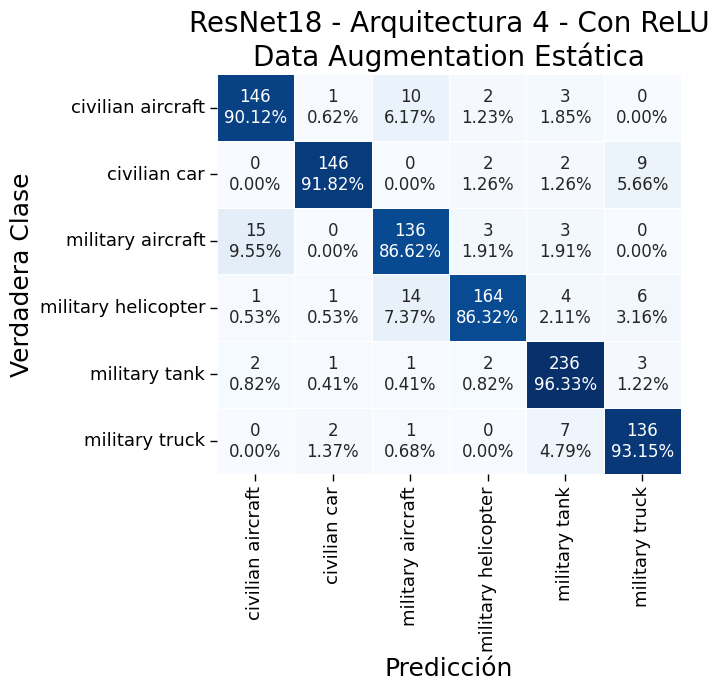

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.ReLU(), arch = 4)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 4 - Con ReLU\nData Augmentation Estática"
)

###### Con tanh

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 4)
summary(model_resnet18, input_size=(1, 3, 224, 224))

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]   

Vemos que, de los 11,242,950 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 66,438.

**Entrenamiento con Data Augmentation Dinámica**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 4)

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_daug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 01:49:30


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 1 - Ended: 19/04/25 01:51:18 - Duration: 107.9s

Training Loss: 1.3930849975614406 - Validation Loss: 0.9683392433559194
Training Accuracy: 0.8068476977567887 - Validation Accuracy: 0.8290840415486308

Epoch: 2 - Started: 19/04/25 01:51:18


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 2 - Ended: 19/04/25 01:53:06 - Duration: 107.61s

Training Loss: 0.969320409333528 - Validation Loss: 0.7502724353004905
Training Accuracy: 0.8382526564344747 - Validation Accuracy: 0.8498583569405099

Epoch: 3 - Started: 19/04/25 01:53:06


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 3 - Ended: 19/04/25 01:54:53 - Duration: 107.1s

Training Loss: 0.8140030796848127 - Validation Loss: 0.6316690234576955
Training Accuracy: 0.8564344746162929 - Validation Accuracy: 0.8668555240793201

Epoch: 4 - Started: 19/04/25 01:54:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 4 - Ended: 19/04/25 01:56:40 - Duration: 107.11s

Training Loss: 0.7266155516923364 - Validation Loss: 0.6095483723808738
Training Accuracy: 0.8476977567886659 - Validation Accuracy: 0.8545797922568461

Epoch: 5 - Started: 19/04/25 01:56:40


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 5 - Ended: 19/04/25 01:58:27 - Duration: 107.08s

Training Loss: 0.6771926755335793 - Validation Loss: 0.5392245036714217
Training Accuracy: 0.8538370720188903 - Validation Accuracy: 0.8725212464589235

Epoch: 6 - Started: 19/04/25 01:58:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 6 - Ended: 19/04/25 02:00:14 - Duration: 107.6s

Training Loss: 0.625557193115576 - Validation Loss: 0.5200409591197968
Training Accuracy: 0.8611570247933884 - Validation Accuracy: 0.8574126534466477

Epoch: 7 - Started: 19/04/25 02:00:14


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 7 - Ended: 19/04/25 02:02:01 - Duration: 106.94s

Training Loss: 0.5861048943071223 - Validation Loss: 0.4904070812113145
Training Accuracy: 0.8689492325855962 - Validation Accuracy: 0.8706326723323891

Epoch: 8 - Started: 19/04/25 02:02:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 8 - Ended: 19/04/25 02:03:48 - Duration: 107.14s

Training Loss: 0.5623672422188432 - Validation Loss: 0.47402625048861785
Training Accuracy: 0.8684769775678867 - Validation Accuracy: 0.8715769593956563

Epoch: 9 - Started: 19/04/25 02:03:48


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 9 - Ended: 19/04/25 02:05:36 - Duration: 107.37s

Training Loss: 0.5382278966369913 - Validation Loss: 0.45205677958095775
Training Accuracy: 0.8824085005903187 - Validation Accuracy: 0.8800755429650614

Epoch: 10 - Started: 19/04/25 02:05:36


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 10 - Ended: 19/04/25 02:07:23 - Duration: 107.39s

Training Loss: 0.5311617740054628 - Validation Loss: 0.4240083194830838
Training Accuracy: 0.8927981109799291 - Validation Accuracy: 0.8857412653446648

Epoch: 11 - Started: 19/04/25 02:07:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 11 - Ended: 19/04/25 02:09:10 - Duration: 107.25s

Training Loss: 0.5152216117773483 - Validation Loss: 0.4196527512634502
Training Accuracy: 0.8805194805194805 - Validation Accuracy: 0.8876298394711992

Epoch: 12 - Started: 19/04/25 02:09:10


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 12 - Ended: 19/04/25 02:10:58 - Duration: 107.57s

Training Loss: 0.49909878889126563 - Validation Loss: 0.4244174790733001
Training Accuracy: 0.8845336481700118 - Validation Accuracy: 0.8781869688385269

Epoch: 13 - Started: 19/04/25 02:10:58


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 13 - Ended: 19/04/25 02:12:45 - Duration: 107.41s

Training Loss: 0.49399610375290487 - Validation Loss: 0.40211854086202736
Training Accuracy: 0.8970484061393152 - Validation Accuracy: 0.8819641170915958

Epoch: 14 - Started: 19/04/25 02:12:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 14 - Ended: 19/04/25 02:14:32 - Duration: 106.84s

Training Loss: 0.45744130593627247 - Validation Loss: 0.3853652643806794
Training Accuracy: 0.9024793388429752 - Validation Accuracy: 0.8932955618508026

Epoch: 15 - Started: 19/04/25 02:14:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]

Epoch: 15 - Ended: 19/04/25 02:16:19 - Duration: 106.76s

Training Loss: 0.47940323624148296 - Validation Loss: 0.37152044299770803
Training Accuracy: 0.9001180637544274 - Validation Accuracy: 0.8951841359773371



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_4tanh_daug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4tanh_daug.pth", weights_only=False)

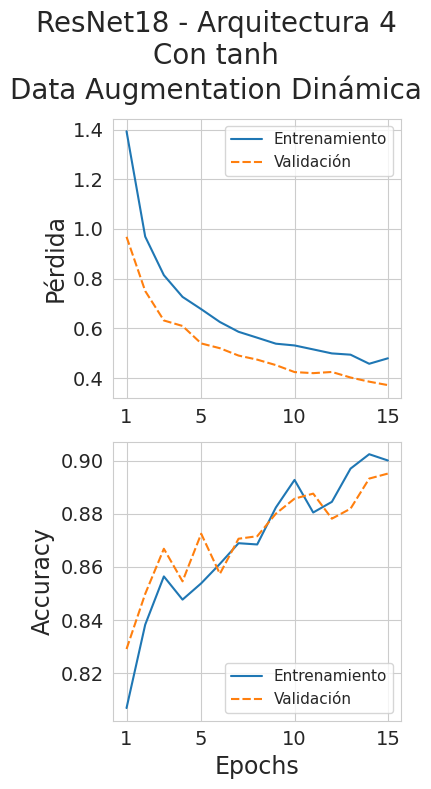

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 4\nCon tanh\nData Augmentation Dinámica")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


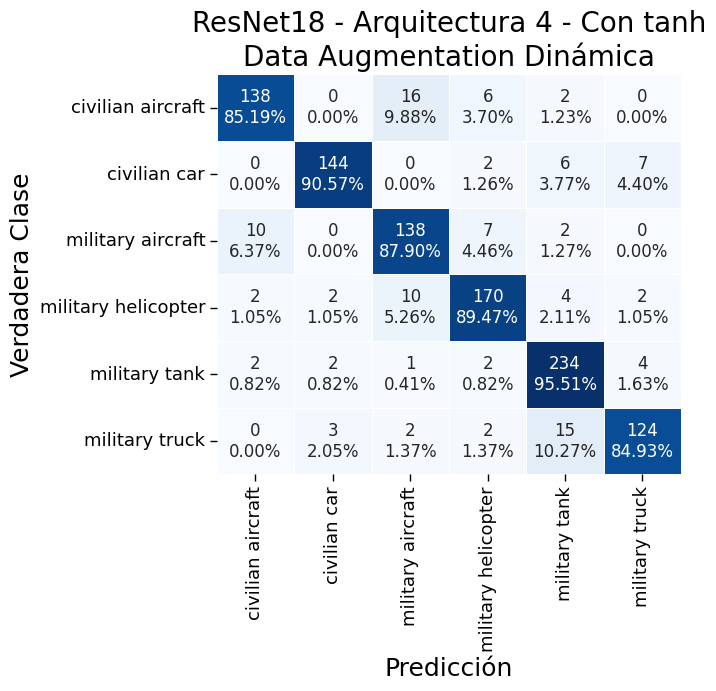

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.Tanh(), arch = 4)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 4 - Con tanh\nData Augmentation Dinámica"
)

**Entrenamiento con Data Augmentation Estática**

In [ ]:
model_resnet18, loss_fn, optimizer = get_model_resnet18(6, activation = nn.Tanh(), arch = 4)

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet18, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 14:47:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 1 - Ended: 19/04/25 14:49:46 - Duration: 125.29s

Training Loss: 1.31842729938564 - Validation Loss: 0.8822421501664555
Training Accuracy: 0.7604486422668241 - Validation Accuracy: 0.8375826251180358

Epoch: 2 - Started: 19/04/25 14:49:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 2 - Ended: 19/04/25 14:51:51 - Duration: 125.45s

Training Loss: 0.9646060653586885 - Validation Loss: 0.6778954057132497
Training Accuracy: 0.7997638724911452 - Validation Accuracy: 0.8441926345609065

Epoch: 3 - Started: 19/04/25 14:51:51


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 3 - Ended: 19/04/25 14:53:57 - Duration: 125.33s

Training Loss: 0.8139778713681805 - Validation Loss: 0.5834584674414467
Training Accuracy: 0.8138134592680047 - Validation Accuracy: 0.8611898016997167

Epoch: 4 - Started: 19/04/25 14:53:57


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]


Epoch: 4 - Ended: 19/04/25 14:56:01 - Duration: 124.21s

Training Loss: 0.7174970018329905 - Validation Loss: 0.4901218238998862
Training Accuracy: 0.8650531286894924 - Validation Accuracy: 0.8895184135977338

Epoch: 5 - Started: 19/04/25 14:56:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 5 - Ended: 19/04/25 14:58:04 - Duration: 122.98s

Training Loss: 0.631485061859017 - Validation Loss: 0.46520546253989725
Training Accuracy: 0.8811097992916175 - Validation Accuracy: 0.8847969782813976

Epoch: 6 - Started: 19/04/25 14:58:04


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 6 - Ended: 19/04/25 15:00:06 - Duration: 122.37s

Training Loss: 0.5814438617941159 - Validation Loss: 0.4108445512897828
Training Accuracy: 0.899409681227863 - Validation Accuracy: 0.8961284230406044

Epoch: 7 - Started: 19/04/25 15:00:06


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.38it/s]


Epoch: 7 - Ended: 19/04/25 15:02:09 - Duration: 122.39s

Training Loss: 0.519012273692373 - Validation Loss: 0.40491221406880545
Training Accuracy: 0.9072018890200708 - Validation Accuracy: 0.8914069877242682

Epoch: 8 - Started: 19/04/25 15:02:09


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 8 - Ended: 19/04/25 15:04:11 - Duration: 122.64s

Training Loss: 0.4784881957431338 - Validation Loss: 0.42219464042607474
Training Accuracy: 0.8932703659976388 - Validation Accuracy: 0.8800755429650614

Epoch: 9 - Started: 19/04/25 15:04:11


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 9 - Ended: 19/04/25 15:06:14 - Duration: 122.79s

Training Loss: 0.4377843884389792 - Validation Loss: 0.36916622168877544
Training Accuracy: 0.9353010625737899 - Validation Accuracy: 0.9008498583569405

Epoch: 10 - Started: 19/04/25 15:06:14


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 10 - Ended: 19/04/25 15:08:19 - Duration: 125.12s

Training Loss: 0.3945017014421634 - Validation Loss: 0.37073585478698506
Training Accuracy: 0.9396694214876034 - Validation Accuracy: 0.8942398489140698

Epoch: 11 - Started: 19/04/25 15:08:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 11 - Ended: 19/04/25 15:10:25 - Duration: 125.65s

Training Loss: 0.3614769989430015 - Validation Loss: 0.34876834644990806
Training Accuracy: 0.9425029515938607 - Validation Accuracy: 0.9055712936732767

Epoch: 12 - Started: 19/04/25 15:10:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 12 - Ended: 19/04/25 15:12:30 - Duration: 125.33s

Training Loss: 0.3674579147082656 - Validation Loss: 0.37559590269537535
Training Accuracy: 0.9408500590318772 - Validation Accuracy: 0.8885741265344664

Epoch: 13 - Started: 19/04/25 15:12:30


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 13 - Ended: 19/04/25 15:14:36 - Duration: 125.67s

Training Loss: 0.33760048026469214 - Validation Loss: 0.3450041702565025
Training Accuracy: 0.9368358913813459 - Validation Accuracy: 0.9046270066100094

Epoch: 14 - Started: 19/04/25 15:14:36


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 14 - Ended: 19/04/25 15:16:41 - Duration: 124.96s

Training Loss: 0.3195179667490632 - Validation Loss: 0.34033586216323514
Training Accuracy: 0.9613931523022432 - Validation Accuracy: 0.9046270066100094

Epoch: 15 - Started: 19/04/25 15:16:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]

Epoch: 15 - Ended: 19/04/25 15:18:46 - Duration: 125.44s

Training Loss: 0.30658607318330167 - Validation Loss: 0.34916909740251656
Training Accuracy: 0.9504132231404959 - Validation Accuracy: 0.9036827195467422



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
    "epoch": 15,
    "model_state_dict": model_resnet18.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "loss": train_losses[-1],
    "train_losses": train_losses,
    "train_accuracies": train_accuracies,
    "val_losses": val_losses,
    "val_accuracies": val_accuracies,
    "best_model": best_model
    }, "/content/drive/MyDrive/tfg/models/resnet18_4tanh_aug.pth"
)

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4tanh_aug.pth", weights_only=False)

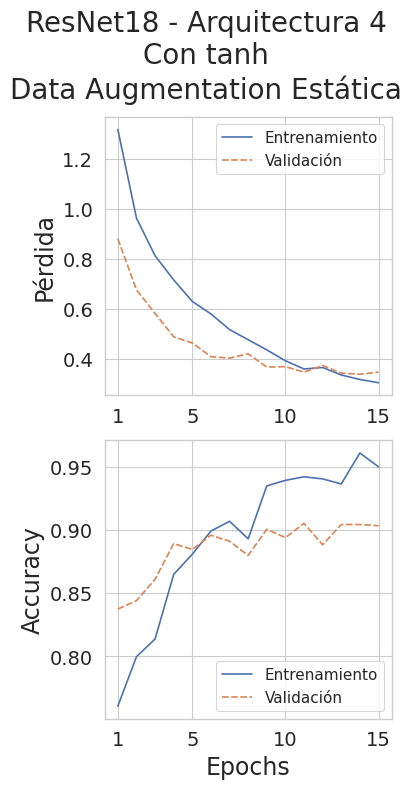

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet18 - Arquitectura 4\nCon tanh\nData Augmentation Estática")

Representamos la matriz de confusión del mejor modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


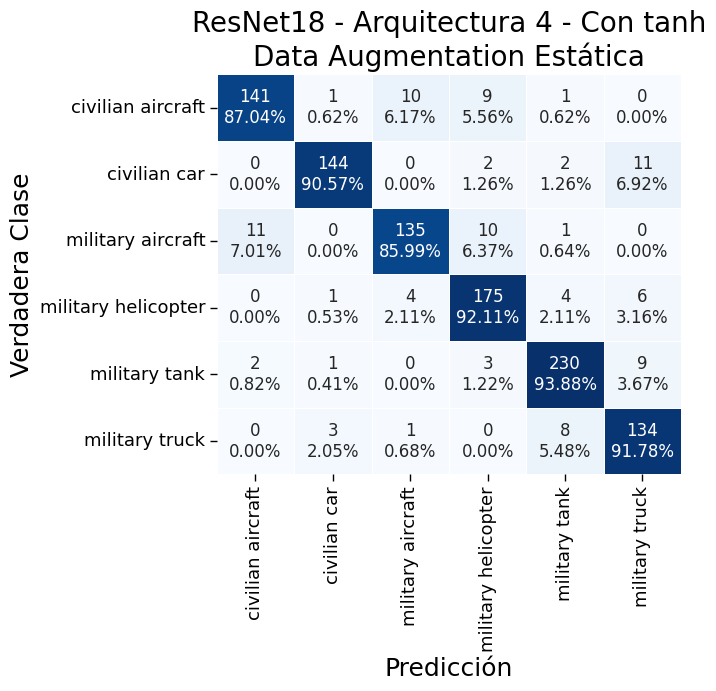

In [ ]:
model_resnet18_best, _, _ = get_model_resnet18(6, activation = nn.Tanh(), arch = 4)
model_resnet18_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet18_best, val_dataloader)
_ = make_cf_matrix(
    predictions,
    val_dataset.y.to_numpy(),
    label_encoder,
    "ResNet18 - Arquitectura 4 - Con tanh\nData Augmentation Estática"
)

#### Comparación de ResNet18

Cargamos todos los modelos en memoria:

In [ ]:
checkpoint_resnet18_1_daug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_1_daug.pth", weights_only=False)
model_resnet18_1_daug, _, _ = get_model_resnet18(6, activation=None, arch=1)
model_resnet18_1_daug.load_state_dict(checkpoint_resnet18_1_daug["best_model"]["model_state_dict"])

checkpoint_resnet18_1_aug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_1_aug.pth", weights_only=False)
model_resnet18_1_aug, _, _ = get_model_resnet18(6, activation=None, arch=1)
model_resnet18_1_aug.load_state_dict(checkpoint_resnet18_1_aug["best_model"]["model_state_dict"])

checkpoint_resnet18_2relu_daug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_2relu_daug.pth", weights_only=False)
model_resnet18_2relu_daug, _, _ = get_model_resnet18(6, activation=nn.ReLU(), arch=2)
model_resnet18_2relu_daug.load_state_dict(checkpoint_resnet18_2relu_daug["best_model"]["model_state_dict"])

checkpoint_resnet18_2relu_aug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_2relu_aug.pth", weights_only=False)
model_resnet18_2relu_aug, _, _ = get_model_resnet18(6, activation=nn.ReLU(), arch=2)
model_resnet18_2relu_aug.load_state_dict(checkpoint_resnet18_2relu_aug["best_model"]["model_state_dict"])

checkpoint_resnet18_3relu_daug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3relu_daug.pth", weights_only=False)
model_resnet18_3relu_daug, _, _ = get_model_resnet18(6, activation=nn.ReLU(), arch=3)
model_resnet18_3relu_daug.load_state_dict(checkpoint_resnet18_3relu_daug["best_model"]["model_state_dict"])

checkpoint_resnet18_3relu_aug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3relu_aug_aux.pth", weights_only=False)
model_resnet18_3relu_aug, _, _ = get_model_resnet18(6, activation=nn.ReLU(), arch=3)
model_resnet18_3relu_aug.load_state_dict(checkpoint_resnet18_3relu_aug["best_model"]["model_state_dict"])

checkpoint_resnet18_4relu_daug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4relu_daug.pth", weights_only=False)
model_resnet18_4relu_daug, _, _ = get_model_resnet18(6, activation=nn.ReLU(), arch=4)
model_resnet18_4relu_daug.load_state_dict(checkpoint_resnet18_4relu_daug["best_model"]["model_state_dict"])

checkpoint_resnet18_4relu_aug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4relu_aug_aux.pth", weights_only=False)
model_resnet18_4relu_aug, _, _ = get_model_resnet18(6, activation=nn.ReLU(), arch=4)
model_resnet18_4relu_aug.load_state_dict(checkpoint_resnet18_4relu_aug["best_model"]["model_state_dict"])

checkpoint_resnet18_2tanh_daug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_2tanh_daug.pth", weights_only=False)
model_resnet18_2tanh_daug, _, _ = get_model_resnet18(6, activation=nn.Tanh(), arch=2)
model_resnet18_2tanh_daug.load_state_dict(checkpoint_resnet18_2tanh_daug["best_model"]["model_state_dict"])

checkpoint_resnet18_2tanh_aug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_2tanh_aug.pth", weights_only=False)
model_resnet18_2tanh_aug, _, _ = get_model_resnet18(6, activation=nn.Tanh(), arch=2)
model_resnet18_2tanh_aug.load_state_dict(checkpoint_resnet18_2tanh_aug["best_model"]["model_state_dict"])

checkpoint_resnet18_3tanh_daug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3tanh_daug.pth", weights_only=False)
model_resnet18_3tanh_daug, _, _ = get_model_resnet18(6, activation=nn.Tanh(), arch=3)
model_resnet18_3tanh_daug.load_state_dict(checkpoint_resnet18_3tanh_daug["best_model"]["model_state_dict"])

checkpoint_resnet18_3tanh_aug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3tanh_aug.pth", weights_only=False)
model_resnet18_3tanh_aug, _, _ = get_model_resnet18(6, activation=nn.Tanh(), arch=3)
model_resnet18_3tanh_aug.load_state_dict(checkpoint_resnet18_3tanh_aug["best_model"]["model_state_dict"])

checkpoint_resnet18_4tanh_daug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4tanh_daug.pth", weights_only=False)
model_resnet18_4tanh_daug, _, _ = get_model_resnet18(6, activation=nn.Tanh(), arch=4)
model_resnet18_4tanh_daug.load_state_dict(checkpoint_resnet18_4tanh_daug["best_model"]["model_state_dict"])

checkpoint_resnet18_4tanh_aug = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4tanh_aug.pth", weights_only=False)
model_resnet18_4tanh_aug, _, _ = get_model_resnet18(6, activation=nn.Tanh(), arch=4)
model_resnet18_4tanh_aug.load_state_dict(checkpoint_resnet18_4tanh_aug["best_model"]["model_state_dict"])

<All keys matched successfully>

Para todas las configuraciones, vamos calculando las puntuaciones F1, F2 y la *accuracy*:

In [ ]:
# Definimos listas con las configuraciones de la data augmentation, las
# arquitecturas usadas y los modelos
xlabs = ["Data Augmentation\nDinámica", "Data Augmentation\nEstática"]
groups = ["Arquitectura 1",
          "Arquietectura 2 - ReLU", "Arquietectura 3 - ReLU", "Arquietectura 4 - ReLU",
          "Arquietectura 2 - tanh", "Arquietectura 3 - tanh", "Arquietectura 4 - tanh"]
models_resnet18 = [model_resnet18_1_daug, model_resnet18_1_aug,
                   model_resnet18_2relu_daug, model_resnet18_2relu_aug,
                   model_resnet18_3relu_daug, model_resnet18_3relu_aug,
                   model_resnet18_4relu_daug, model_resnet18_4relu_aug,
                   model_resnet18_2tanh_daug, model_resnet18_2tanh_aug,
                   model_resnet18_3tanh_daug, model_resnet18_3tanh_aug,
                   model_resnet18_4tanh_daug, model_resnet18_4tanh_aug]

# Inicializamos las matrices a usar
f1_matrix = np.zeros((len(xlabs) * len(groups)))
f2_matrix = np.zeros((len(xlabs) * len(groups)))
accuracy_matrix = np.zeros((len(xlabs) * len(groups)))
y_true_val = val_dataset.y.to_numpy()
n_val = len(y_true_val)

# Para cada modelo, calculamos su accuracy, su metrica F1 y su metrica F2
for i, model in tqdm(enumerate(models_resnet18), total=len(xlabs) * len(groups)):
    y_pred_val = predict(model, val_dataloader)
    f1_matrix[i] = fbeta_score(y_true_val, y_pred_val, beta=1, average="weighted")
    f2_matrix[i] = fbeta_score(y_true_val, y_pred_val, beta=2, average="weighted")
    accuracy_matrix[i] = sum(y_true_val == y_pred_val) / n_val * 100

# Convertimos las matrices a DataFrame y nombramos sus filas y columnas
f1_df = pd.DataFrame(np.round(f1_matrix.reshape((len(xlabs), len(groups)), order="F"), 4))
f1_df.columns = groups
f1_df.index = xlabs

f2_df = pd.DataFrame(np.round(f2_matrix.reshape((len(xlabs), len(groups)), order="F"), 4))
f2_df.columns = groups
f2_df.index = xlabs

accuracy_df = pd.DataFrame(np.round(accuracy_matrix.reshape((len(xlabs), len(groups)), order="F"), 2))
accuracy_df.columns = groups
accuracy_df.index = xlabs

100%|██████████| 14/14 [01:45<00:00,  7.54s/it]


Representamos las métricas:

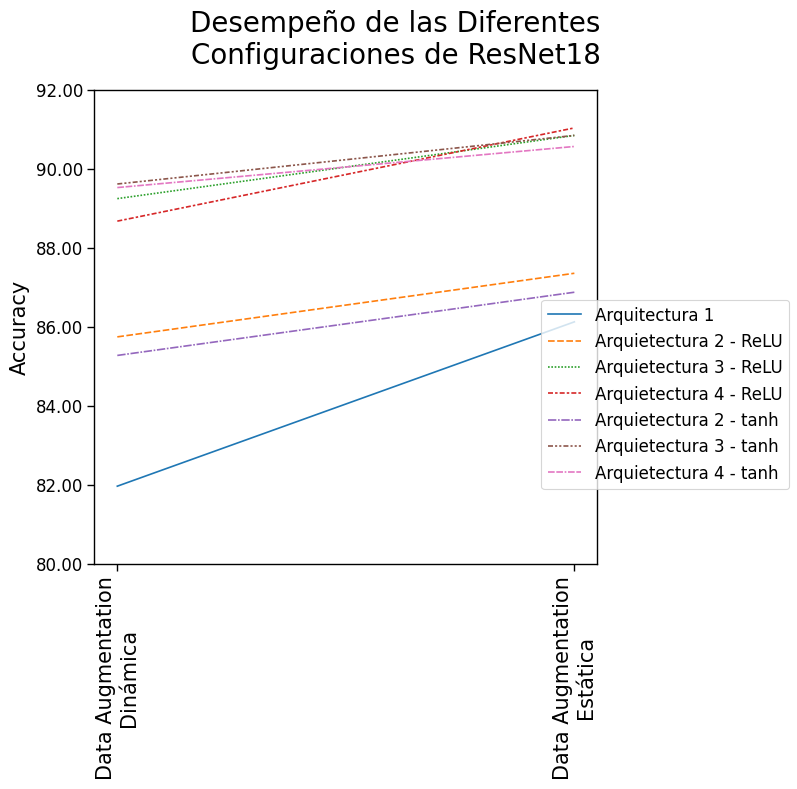

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
accuracy_plot = sns.lineplot(data=accuracy_df, ax=ax)
ax.set_ylabel("Accuracy", fontsize=15)
ticks_x = ax.get_xticks()
ax.set_xticks(ticks_x)
ax.set_xticklabels(xlabs, rotation=90, fontsize=15)
ticks_y = ax.get_yticks()
ax.set_yticks(ticks_y)
ax.set_yticklabels([f"{t:.2f}" for t in ticks_y], fontsize=12)
ax.get_legend().remove()
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc="center right", prop={'size': 12})
fig.suptitle("Desempeño de las Diferentes\nConfiguraciones de ResNet18", fontsize=20)
fig.tight_layout(rect=[0, 0, 0.77, 1])
plt.show()

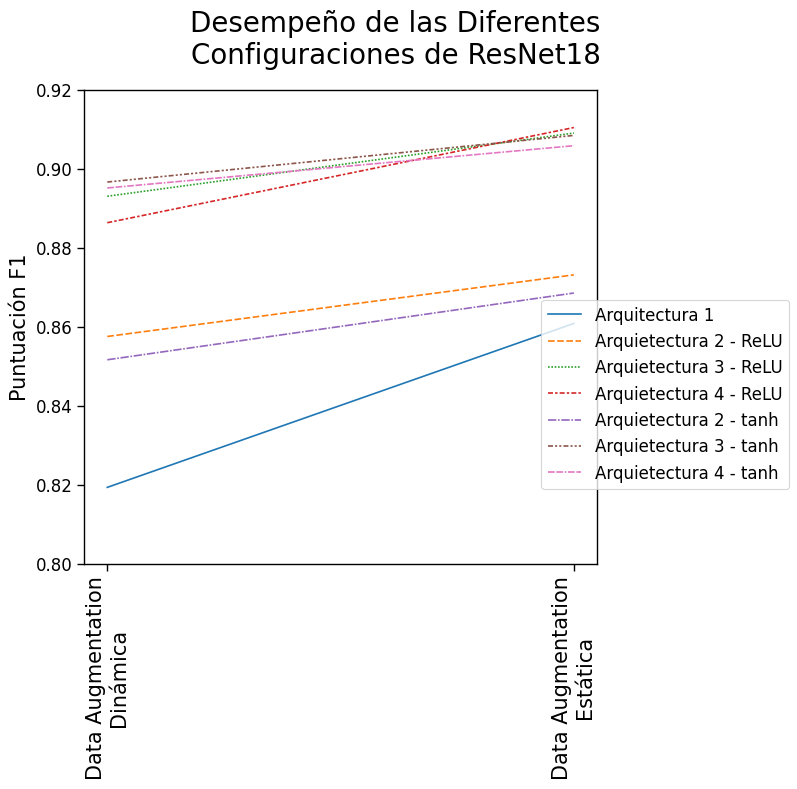

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
f1_plot = sns.lineplot(data=f1_df, ax=ax)
ax.set_ylabel("Puntuación F1", fontsize=15)
ticks_x = ax.get_xticks()
ax.set_xticks(ticks_x)
ax.set_xticklabels(xlabs, rotation=90, fontsize=15)
ticks_y = ax.get_yticks()
ax.set_yticks(ticks_y)
ax.set_yticklabels([f"{t:.2f}" for t in ticks_y], fontsize=12)
ax.get_legend().remove()
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc="center right", prop={'size': 12})
fig.suptitle("Desempeño de las Diferentes\nConfiguraciones de ResNet18", fontsize=20)
fig.tight_layout(rect=[0, 0, 0.77, 1])
plt.show()

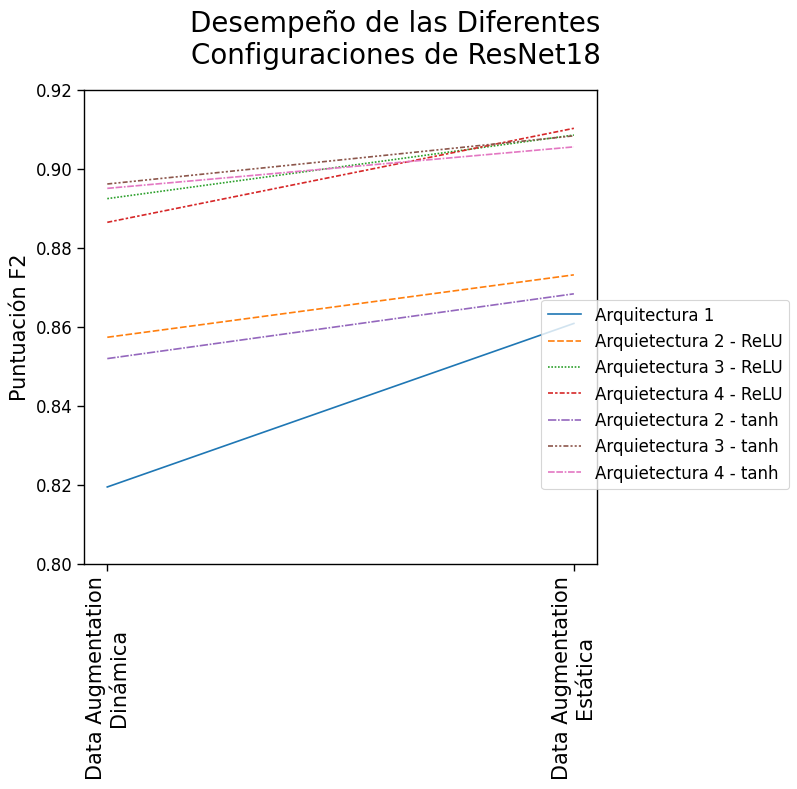

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
f2_plot = sns.lineplot(data=f2_df, ax=ax)
ax.set_ylabel("Puntuación F2", fontsize=15)
ticks_x = ax.get_xticks()
ax.set_xticks(ticks_x)
ax.set_xticklabels(xlabs, rotation=90, fontsize=15)
ticks_y = ax.get_yticks()
ax.set_yticks(ticks_y)
ax.set_yticklabels([f"{t:.2f}" for t in ticks_y], fontsize=12)
ax.get_legend().remove()
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc="center right", prop={'size': 12})
fig.suptitle("Desempeño de las Diferentes\nConfiguraciones de ResNet18", fontsize=20)
fig.tight_layout(rect=[0, 0, 0.77, 1])
plt.show()

### AlexNet

#### Modelo

Vamos a aplicar transfer-learning al modelo AlexNet pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_alexnet = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)
summary(model_alexnet, input_size=(1,3, 224, 224))

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 219MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
AlexNet                                  [1, 1000]                 --
├─Sequential: 1-1                        [1, 256, 6, 6]            --
│    └─Conv2d: 2-1                       [1, 64, 55, 55]           23,296
│    └─ReLU: 2-2                         [1, 64, 55, 55]           --
│    └─MaxPool2d: 2-3                    [1, 64, 27, 27]           --
│    └─Conv2d: 2-4                       [1, 192, 27, 27]          307,392
│    └─ReLU: 2-5                         [1, 192, 27, 27]          --
│    └─MaxPool2d: 2-6                    [1, 192, 13, 13]          --
│    └─Conv2d: 2-7                       [1, 384, 13, 13]          663,936
│    └─ReLU: 2-8                         [1, 384, 13, 13]          --
│    └─Conv2d: 2-9                       [1, 256, 13, 13]          884,992
│    └─ReLU: 2-10                        [1, 256, 13, 13]          --
│    └─Conv2d: 2-11                      [1, 256, 13, 13]         

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos un poco:

In [ ]:
def get_model_alexnet(num_classes, arch=3):
    """
    Nos permite obtener un modelo AlexNet con una determinada configuración
    listo para entrenar, su optimizador (Adam) y la funcion de pérdida de
    entropía cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.features.parameters():
        param.requires_grad = False

    # Si la arquitectura es 3 o 4, congela el clasificador hasta el final, si
    # no, congela solo la primera capa
    if arch == 3 or arch == 4:
        for param in model.classifier.parameters():
            param.requires_grad = False
    elif arch == 5:
        for param in model.classifier[:-3].parameters():
            param.requires_grad = False
    else:
        raise Exception("Invalid architecture")

    # Seleccionamos la configuracion
    if arch == 3:
        model.classifier = nn.Sequential(
                model.classifier[0],
                model.classifier[1],
                model.classifier[2],
                model.classifier[3],
                model.classifier[4],
                model.classifier[5],
                nn.Linear(model.classifier[4].out_features, 1024),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(1024, 512),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(512, 128),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(128, 32),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(32, num_classes)
            )
    elif arch == 4:
        model.classifier = nn.Sequential(
            model.classifier[0],
            model.classifier[1],
            model.classifier[2],
            model.classifier[3],
            model.classifier[4],
            model.classifier[5],
            nn.Linear(model.classifier[4].out_features, 2048),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )
    elif arch == 5:
        model.classifier[6] = nn.Linear(4096, 6)

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_alexnet, loss_fn, optimizer = get_model_alexnet(6, arch=3)
summary(model_alexnet, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
AlexNet                                  [1, 6]                    --
├─Sequential: 1-1                        [1, 256, 6, 6]            --
│    └─Conv2d: 2-1                       [1, 64, 55, 55]           (23,296)
│    └─ReLU: 2-2                         [1, 64, 55, 55]           --
│    └─MaxPool2d: 2-3                    [1, 64, 27, 27]           --
│    └─Conv2d: 2-4                       [1, 192, 27, 27]          (307,392)
│    └─ReLU: 2-5                         [1, 192, 27, 27]          --
│    └─MaxPool2d: 2-6                    [1, 192, 13, 13]          --
│    └─Conv2d: 2-7                       [1, 384, 13, 13]          (663,936)
│    └─ReLU: 2-8                         [1, 384, 13, 13]          --
│    └─Conv2d: 2-9                       [1, 256, 13, 13]          (884,992)
│    └─ReLU: 2-10                        [1, 256, 13, 13]          --
│    └─Conv2d: 2-11                      [1, 256, 13, 13] 

Vemos que, de los 61,793,958 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 4,790,118. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model = train_model(
    model_alexnet, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 00:30:55


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 1 - Ended: 20/04/25 00:32:59 - Duration: 124.13s

Training Loss: 1.5916874319759768 - Validation Loss: 0.9898123495719012
Training Accuracy: 0.6704840613931523 - Validation Accuracy: 0.7431539187913125

Epoch: 2 - Started: 20/04/25 00:32:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:06<00:00,  2.44it/s]


Epoch: 2 - Ended: 20/04/25 00:35:00 - Duration: 121.58s

Training Loss: 1.102281049116334 - Validation Loss: 0.5960288591244641
Training Accuracy: 0.748642266824085 - Validation Accuracy: 0.8130311614730878

Epoch: 3 - Started: 20/04/25 00:35:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:06<00:00,  2.43it/s]


Epoch: 3 - Ended: 20/04/25 00:37:02 - Duration: 121.58s

Training Loss: 0.9214151466070716 - Validation Loss: 0.5314535148003522
Training Accuracy: 0.7730814639905549 - Validation Accuracy: 0.8319169027384324

Epoch: 4 - Started: 20/04/25 00:37:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:06<00:00,  2.43it/s]


Epoch: 4 - Ended: 20/04/25 00:39:04 - Duration: 121.88s

Training Loss: 0.8368215258441755 - Validation Loss: 0.501443937420845
Training Accuracy: 0.8015348288075561 - Validation Accuracy: 0.8413597733711048

Epoch: 5 - Started: 20/04/25 00:39:04


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]


Epoch: 5 - Ended: 20/04/25 00:41:05 - Duration: 121.65s

Training Loss: 0.7858448090837963 - Validation Loss: 0.47800492451471444
Training Accuracy: 0.8139315230224321 - Validation Accuracy: 0.8479697828139755

Epoch: 6 - Started: 20/04/25 00:41:05


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]


Epoch: 6 - Ended: 20/04/25 00:43:07 - Duration: 121.29s

Training Loss: 0.7307958513943117 - Validation Loss: 0.4665802068570081
Training Accuracy: 0.8291617473435655 - Validation Accuracy: 0.8479697828139755

Epoch: 7 - Started: 20/04/25 00:43:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 7 - Ended: 20/04/25 00:45:08 - Duration: 121.52s

Training Loss: 0.7177469098745887 - Validation Loss: 0.45271307931226845
Training Accuracy: 0.8370720188902007 - Validation Accuracy: 0.8564683663833805

Epoch: 8 - Started: 20/04/25 00:45:08


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 8 - Ended: 20/04/25 00:47:10 - Duration: 121.31s

Training Loss: 0.6675524311279183 - Validation Loss: 0.457193523645401
Training Accuracy: 0.8452184179456906 - Validation Accuracy: 0.8602455146364495

Epoch: 9 - Started: 20/04/25 00:47:10


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 9 - Ended: 20/04/25 00:49:11 - Duration: 121.42s

Training Loss: 0.653996973340191 - Validation Loss: 0.4476494692704257
Training Accuracy: 0.8577331759149941 - Validation Accuracy: 0.8602455146364495

Epoch: 10 - Started: 20/04/25 00:49:11


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:06<00:00,  2.44it/s]


Epoch: 10 - Ended: 20/04/25 00:51:12 - Duration: 121.18s

Training Loss: 0.6209865728420998 - Validation Loss: 0.44794708665679484
Training Accuracy: 0.8563164108618654 - Validation Accuracy: 0.8574126534466477

Epoch: 11 - Started: 20/04/25 00:51:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]


Epoch: 11 - Ended: 20/04/25 00:53:13 - Duration: 120.82s

Training Loss: 0.6080708623822055 - Validation Loss: 0.43158474827513976
Training Accuracy: 0.872491145218418 - Validation Accuracy: 0.8659112370160529

Epoch: 12 - Started: 20/04/25 00:53:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:06<00:00,  2.43it/s]


Epoch: 12 - Ended: 20/04/25 00:55:14 - Duration: 121.26s

Training Loss: 0.5789892855864852 - Validation Loss: 0.42577138893744526
Training Accuracy: 0.8752066115702479 - Validation Accuracy: 0.8687440982058546

Epoch: 13 - Started: 20/04/25 00:55:14


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 13 - Ended: 20/04/25 00:57:15 - Duration: 121.09s

Training Loss: 0.5578854875778084 - Validation Loss: 0.4219360614524168
Training Accuracy: 0.8847697756788666 - Validation Accuracy: 0.8772426817752597

Epoch: 14 - Started: 20/04/25 00:57:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]


Epoch: 14 - Ended: 20/04/25 00:59:16 - Duration: 121.02s

Training Loss: 0.5534577436411559 - Validation Loss: 0.4283038000850117
Training Accuracy: 0.8927981109799291 - Validation Accuracy: 0.874409820585458

Epoch: 15 - Started: 20/04/25 00:59:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]

Epoch: 15 - Ended: 20/04/25 01:01:17 - Duration: 121.12s

Training Loss: 0.5263847819904783 - Validation Loss: 0.40617673011387095
Training Accuracy: 0.8971664698937426 - Validation Accuracy: 0.8781869688385269



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_alexnet.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/alexnet_3relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/alexnet_3relu.pth", weights_only=False)

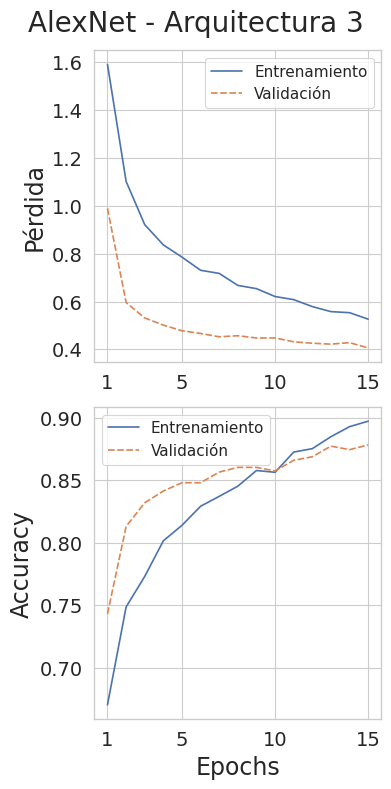

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="AlexNet - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 217MB/s]


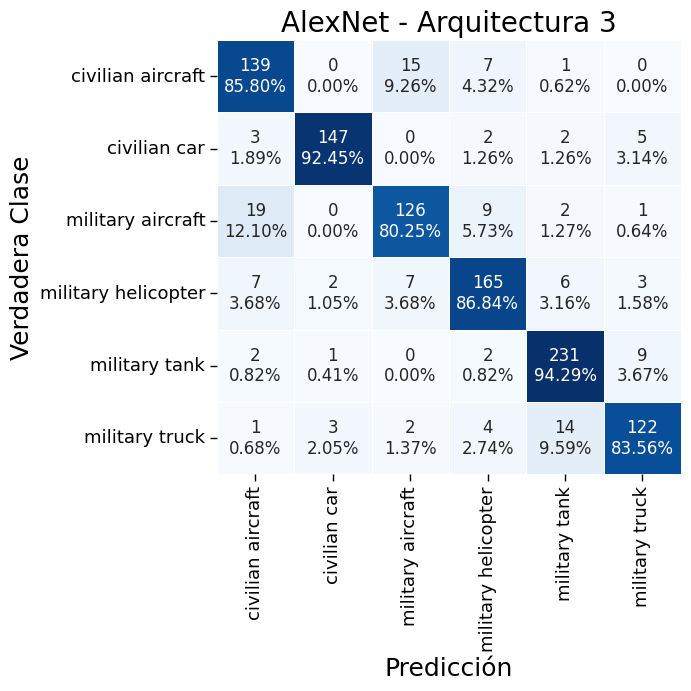

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/alexnet_3relu.pth", weights_only=False)
model_alexnet_best, _, _ = get_model_alexnet(6, arch=3)
model_alexnet_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_alexnet_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "AlexNet - Arquitectura 3")

#### Arquitectura 4

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_alexnet, loss_fn, optimizer = get_model_alexnet(6, arch=4)
summary(model_alexnet, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
AlexNet                                  [1, 6]                    --
├─Sequential: 1-1                        [1, 256, 6, 6]            --
│    └─Conv2d: 2-1                       [1, 64, 55, 55]           (23,296)
│    └─ReLU: 2-2                         [1, 64, 55, 55]           --
│    └─MaxPool2d: 2-3                    [1, 64, 27, 27]           --
│    └─Conv2d: 2-4                       [1, 192, 27, 27]          (307,392)
│    └─ReLU: 2-5                         [1, 192, 27, 27]          --
│    └─MaxPool2d: 2-6                    [1, 192, 13, 13]          --
│    └─Conv2d: 2-7                       [1, 384, 13, 13]          (663,936)
│    └─ReLU: 2-8                         [1, 384, 13, 13]          --
│    └─Conv2d: 2-9                       [1, 256, 13, 13]          (884,992)
│    └─ReLU: 2-10                        [1, 256, 13, 13]          --
│    └─Conv2d: 2-11                      [1, 256, 13, 13] 

Vemos que, de los 66,513,574 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 9,509,734. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model = train_model(
    model_alexnet, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 01:01:20


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 1 - Ended: 20/04/25 01:03:21 - Duration: 121.89s

Training Loss: 1.5363577372992216 - Validation Loss: 0.8573261534466463
Training Accuracy: 0.680047225501771 - Validation Accuracy: 0.7459867799811143

Epoch: 2 - Started: 20/04/25 01:03:21


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 2 - Ended: 20/04/25 01:05:23 - Duration: 121.56s

Training Loss: 1.0628964358301305 - Validation Loss: 0.5886142341529622
Training Accuracy: 0.7409681227863046 - Validation Accuracy: 0.8064211520302171

Epoch: 3 - Started: 20/04/25 01:05:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]


Epoch: 3 - Ended: 20/04/25 01:07:25 - Duration: 122.12s

Training Loss: 0.9124799157256511 - Validation Loss: 0.5166188758962295
Training Accuracy: 0.767060212514758 - Validation Accuracy: 0.8319169027384324

Epoch: 4 - Started: 20/04/25 01:07:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 4 - Ended: 20/04/25 01:09:27 - Duration: 122.26s

Training Loss: 0.8354678073925759 - Validation Loss: 0.4823811071760514
Training Accuracy: 0.7916174734356553 - Validation Accuracy: 0.8451369216241738

Epoch: 5 - Started: 20/04/25 01:09:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 5 - Ended: 20/04/25 01:11:29 - Duration: 121.85s

Training Loss: 0.7802579607536544 - Validation Loss: 0.4651981557116789
Training Accuracy: 0.8158205430932703 - Validation Accuracy: 0.8564683663833805

Epoch: 6 - Started: 20/04/25 01:11:29


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:06<00:00,  2.43it/s]


Epoch: 6 - Ended: 20/04/25 01:13:31 - Duration: 121.55s

Training Loss: 0.7309138881626414 - Validation Loss: 0.4491739483440624
Training Accuracy: 0.8256198347107438 - Validation Accuracy: 0.8611898016997167

Epoch: 7 - Started: 20/04/25 01:13:31


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 7 - Ended: 20/04/25 01:15:32 - Duration: 121.51s

Training Loss: 0.6783790979812394 - Validation Loss: 0.4432327729814193
Training Accuracy: 0.8421487603305785 - Validation Accuracy: 0.8687440982058546

Epoch: 8 - Started: 20/04/25 01:15:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 8 - Ended: 20/04/25 01:17:34 - Duration: 121.35s

Training Loss: 0.6568114437274079 - Validation Loss: 0.4219251029631671
Training Accuracy: 0.849822904368359 - Validation Accuracy: 0.8687440982058546

Epoch: 9 - Started: 20/04/25 01:17:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 9 - Ended: 20/04/25 01:19:36 - Duration: 122.46s

Training Loss: 0.6356508260342613 - Validation Loss: 0.42432602801743674
Training Accuracy: 0.8636363636363636 - Validation Accuracy: 0.8734655335221907

Epoch: 10 - Started: 20/04/25 01:19:36


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.38it/s]


Epoch: 10 - Ended: 20/04/25 01:21:39 - Duration: 122.49s

Training Loss: 0.6014808376333607 - Validation Loss: 0.42488111029652986
Training Accuracy: 0.869185360094451 - Validation Accuracy: 0.8734655335221907

Epoch: 11 - Started: 20/04/25 01:21:39


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 11 - Ended: 20/04/25 01:23:40 - Duration: 121.65s

Training Loss: 0.5815675970333726 - Validation Loss: 0.41010648538084593
Training Accuracy: 0.8785123966942149 - Validation Accuracy: 0.8696883852691218

Epoch: 12 - Started: 20/04/25 01:23:40


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 12 - Ended: 20/04/25 01:25:42 - Duration: 121.95s

Training Loss: 0.5665236996180976 - Validation Loss: 0.411674851880354
Training Accuracy: 0.8859504132231405 - Validation Accuracy: 0.874409820585458

Epoch: 13 - Started: 20/04/25 01:25:42


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 13 - Ended: 20/04/25 01:27:44 - Duration: 121.4s

Training Loss: 0.5487328073871669 - Validation Loss: 0.41385095259722543
Training Accuracy: 0.8878394332939787 - Validation Accuracy: 0.8876298394711992

Epoch: 14 - Started: 20/04/25 01:27:44


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 14 - Ended: 20/04/25 01:29:45 - Duration: 121.68s

Training Loss: 0.5422645736096511 - Validation Loss: 0.40709753860445586
Training Accuracy: 0.8935064935064935 - Validation Accuracy: 0.8781869688385269

Epoch: 15 - Started: 20/04/25 01:29:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.43it/s]

Epoch: 15 - Ended: 20/04/25 01:31:47 - Duration: 121.8s

Training Loss: 0.5165910191500365 - Validation Loss: 0.38663363193764405
Training Accuracy: 0.9036599763872492 - Validation Accuracy: 0.8932955618508026



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_alexnet.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/alexnet_4relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/alexnet_4relu.pth", weights_only=False)

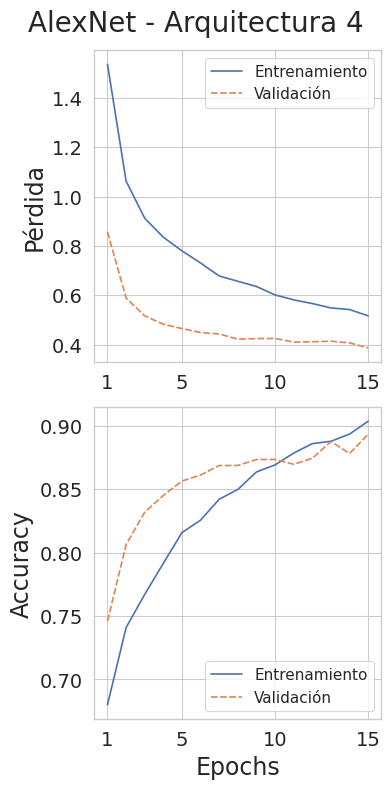

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="AlexNet - Arquitectura 4")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


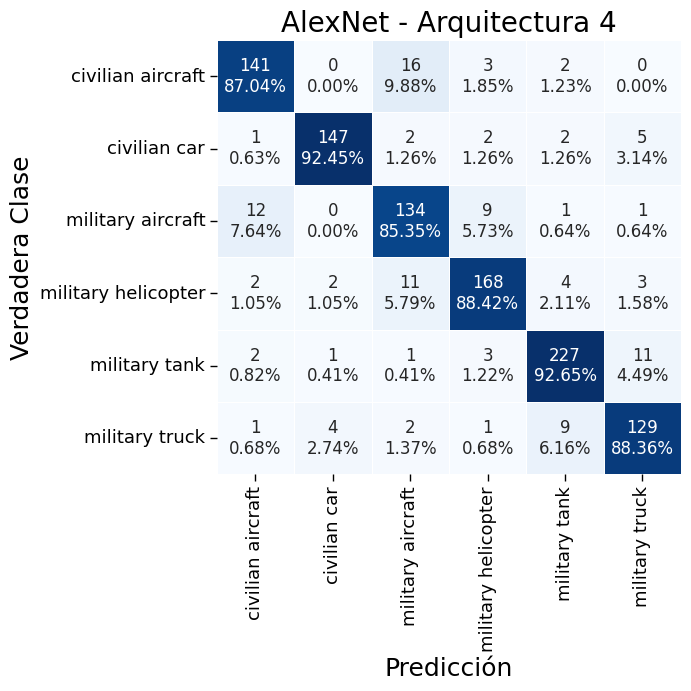

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/alexnet_4relu.pth", weights_only=False)
model_alexnet_best, _, _ = get_model_alexnet(6, arch=4)
model_alexnet_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_alexnet_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "AlexNet - Arquitectura 4")

#### Fine-tuning + Transfer Learning

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_alexnet, loss_fn, optimizer = get_model_alexnet(6, arch=5)
summary(model_alexnet, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
AlexNet                                  [1, 6]                    --
├─Sequential: 1-1                        [1, 256, 6, 6]            --
│    └─Conv2d: 2-1                       [1, 64, 55, 55]           (23,296)
│    └─ReLU: 2-2                         [1, 64, 55, 55]           --
│    └─MaxPool2d: 2-3                    [1, 64, 27, 27]           --
│    └─Conv2d: 2-4                       [1, 192, 27, 27]          (307,392)
│    └─ReLU: 2-5                         [1, 192, 27, 27]          --
│    └─MaxPool2d: 2-6                    [1, 192, 13, 13]          --
│    └─Conv2d: 2-7                       [1, 384, 13, 13]          (663,936)
│    └─ReLU: 2-8                         [1, 384, 13, 13]          --
│    └─Conv2d: 2-9                       [1, 256, 13, 13]          (884,992)
│    └─ReLU: 2-10                        [1, 256, 13, 13]          --
│    └─Conv2d: 2-11                      [1, 256, 13, 13] 

Vemos que, de los 57,028,422 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 16,805,894. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model = train_model(
    model_alexnet, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 21/04/25 12:10:47


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 1 - Ended: 21/04/25 12:12:52 - Duration: 125.02s

Training Loss: 0.8487016229487178 - Validation Loss: 0.47495146446368275
Training Accuracy: 0.8165289256198347 - Validation Accuracy: 0.8441926345609065

Epoch: 2 - Started: 21/04/25 12:12:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 2 - Ended: 21/04/25 12:14:57 - Duration: 124.48s

Training Loss: 0.5761390368440258 - Validation Loss: 0.43071164278423085
Training Accuracy: 0.860448642266824 - Validation Accuracy: 0.8706326723323891

Epoch: 3 - Started: 21/04/25 12:14:57


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 3 - Ended: 21/04/25 12:17:01 - Duration: 124.46s

Training Loss: 0.49830548665416774 - Validation Loss: 0.39949284099480686
Training Accuracy: 0.8818181818181818 - Validation Accuracy: 0.882908404154863

Epoch: 4 - Started: 21/04/25 12:17:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 4 - Ended: 21/04/25 12:19:06 - Duration: 124.5s

Training Loss: 0.4349568348322342 - Validation Loss: 0.3972074757604038
Training Accuracy: 0.9101534828807556 - Validation Accuracy: 0.886685552407932

Epoch: 5 - Started: 21/04/25 12:19:06


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 5 - Ended: 21/04/25 12:21:10 - Duration: 124.36s

Training Loss: 0.3960318803342421 - Validation Loss: 0.3904281118336846
Training Accuracy: 0.9207792207792208 - Validation Accuracy: 0.8980169971671388

Epoch: 6 - Started: 21/04/25 12:21:10


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 6 - Ended: 21/04/25 12:23:15 - Duration: 124.45s

Training Loss: 0.363962961889025 - Validation Loss: 0.4067259737673928
Training Accuracy: 0.9270365997638725 - Validation Accuracy: 0.8876298394711992

Epoch: 7 - Started: 21/04/25 12:23:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 7 - Ended: 21/04/25 12:25:19 - Duration: 124.68s

Training Loss: 0.3446937448053218 - Validation Loss: 0.39985834675676685
Training Accuracy: 0.9394332939787485 - Validation Accuracy: 0.8895184135977338

Epoch: 8 - Started: 21/04/25 12:25:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 8 - Ended: 21/04/25 12:27:23 - Duration: 124.03s

Training Loss: 0.31124898613388857 - Validation Loss: 0.4099178752478431
Training Accuracy: 0.9409681227863046 - Validation Accuracy: 0.8942398489140698

Epoch: 9 - Started: 21/04/25 12:27:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 9 - Ended: 21/04/25 12:29:28 - Duration: 124.62s

Training Loss: 0.296748844545279 - Validation Loss: 0.42634862047784466
Training Accuracy: 0.9495867768595041 - Validation Accuracy: 0.8914069877242682

Epoch: 10 - Started: 21/04/25 12:29:28


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 10 - Ended: 21/04/25 12:31:32 - Duration: 124.57s

Training Loss: 0.2657055734698452 - Validation Loss: 0.4189473206506056
Training Accuracy: 0.9520661157024793 - Validation Accuracy: 0.8895184135977338

Epoch: 11 - Started: 21/04/25 12:31:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 11 - Ended: 21/04/25 12:33:37 - Duration: 124.25s

Training Loss: 0.2661542645586071 - Validation Loss: 0.4225265927174512
Training Accuracy: 0.9593860684769776 - Validation Accuracy: 0.8970727101038716

Epoch: 12 - Started: 21/04/25 12:33:37


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 12 - Ended: 21/04/25 12:35:41 - Duration: 124.29s

Training Loss: 0.24699098138666864 - Validation Loss: 0.4518236377659966
Training Accuracy: 0.9604486422668241 - Validation Accuracy: 0.8838526912181303

Epoch: 13 - Started: 21/04/25 12:35:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 13 - Ended: 21/04/25 12:37:46 - Duration: 125.03s

Training Loss: 0.23837309141657245 - Validation Loss: 0.44605524837970734
Training Accuracy: 0.9641086186540732 - Validation Accuracy: 0.8914069877242682

Epoch: 14 - Started: 21/04/25 12:37:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 14 - Ended: 21/04/25 12:39:50 - Duration: 124.47s

Training Loss: 0.22419455736430724 - Validation Loss: 0.4605668520226198
Training Accuracy: 0.9654073199527745 - Validation Accuracy: 0.890462700661001

Epoch: 15 - Started: 21/04/25 12:39:50


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]

Epoch: 15 - Ended: 21/04/25 12:41:55 - Duration: 124.23s

Training Loss: 0.22308562228928752 - Validation Loss: 0.46810238501604867
Training Accuracy: 0.9682408500590319 - Validation Accuracy: 0.8876298394711992



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_alexnet.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/alexnet_finetuned.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/alexnet_finetuned.pth", weights_only=False)

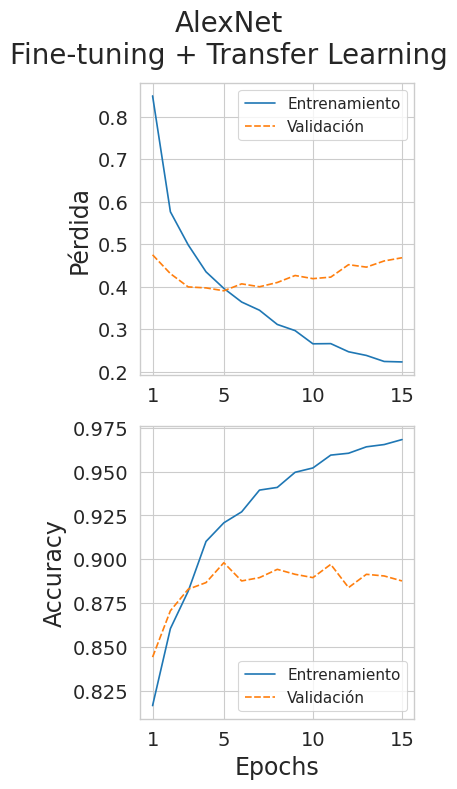

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="AlexNet\nFine-tuning + Transfer Learning")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


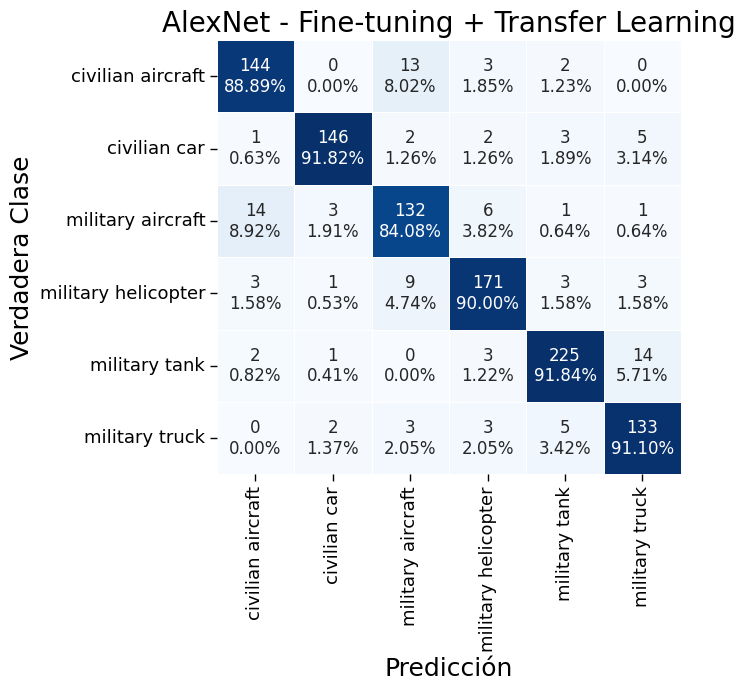

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/alexnet_finetuned.pth", weights_only=False)
model_alexnet_best, _, _ = get_model_alexnet(6, arch=5)
model_alexnet_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_alexnet_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "AlexNet - Fine-tuning + Transfer Learning")

### VGG16

#### Modelo

Vamos a aplicar transfer-learning al modelo VGG16 pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_vgg16 = models.vgg16(weights=models.VGG16_Weights.DEFAULT)
summary(model_vgg16, input_size=(1,3, 224, 224))

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 195MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 1000]                 --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos un poco:

In [ ]:
def get_model_vgg16(num_classes, arch=3):
    """
    Nos permite obtener un modelo VGG16 con una determinada configuración listo
    para entrenar, su optimizador (Adam) y la funcion de pérdida de entropía
    cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.vgg16(weights=models.VGG16_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.features.parameters():
        param.requires_grad = False

    # Si la arquitectura es 3 o 4, congela el clasificador hasta el final, si
    # no, congela solo la primera capa
    if arch == 3 or arch == 4:
        for param in model.classifier[:-1].parameters():
            param.requires_grad = False
    elif arch == 5:
        for param in model.classifier[:-4].parameters():
            param.requires_grad = False
    else:
        raise Exception("Invalid architecture")

    # Seleccionamos la configuracion
    if arch == 3:
        model.classifier = nn.Sequential(
                model.classifier[0],
                model.classifier[1],
                model.classifier[2],
                model.classifier[3],
                model.classifier[4],
                model.classifier[5],
                nn.Linear(model.classifier[3].out_features, 1024),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(1024, 512),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(512, 128),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(128, 32),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(32, num_classes)
            )
    elif arch == 4:
        model.classifier = nn.Sequential(
            model.classifier[0],
            model.classifier[1],
            model.classifier[2],
            model.classifier[3],
            model.classifier[4],
            model.classifier[5],
            nn.Linear(model.classifier[3].out_features, 2048),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )
    elif arch == 5:
        model.classifier[6] = nn.Linear(4096, 6)

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_vgg16, loss_fn, optimizer = get_model_vgg16(6, arch=3)
summary(model_vgg16, input_size=(1, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 6]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         (1,792)
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         (36,928)
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        (73,856)
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        (147,584)
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]    

Vemos que, de los 139,050,662 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 4,790,118. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_vgg16, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 22:08:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.08it/s]


Epoch: 1 - Ended: 19/04/25 22:10:40 - Duration: 132.92s

Training Loss: 1.5913669475868566 - Validation Loss: 0.9310869539485258
Training Accuracy: 0.6644628099173554 - Validation Accuracy: 0.7384324834749764

Epoch: 2 - Started: 19/04/25 22:10:40


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 2 - Ended: 19/04/25 22:12:52 - Duration: 131.96s

Training Loss: 1.0363669938115931 - Validation Loss: 0.5168606744093054
Training Accuracy: 0.7662337662337663 - Validation Accuracy: 0.8508026440037771

Epoch: 3 - Started: 19/04/25 22:12:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 3 - Ended: 19/04/25 22:15:02 - Duration: 130.95s

Training Loss: 0.8521930201729732 - Validation Loss: 0.43610986015375924
Training Accuracy: 0.7910271546635183 - Validation Accuracy: 0.8640226628895185

Epoch: 4 - Started: 19/04/25 22:15:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.08it/s]


Epoch: 4 - Ended: 19/04/25 22:17:14 - Duration: 131.75s

Training Loss: 0.7719165673896448 - Validation Loss: 0.3995470474748051
Training Accuracy: 0.8050767414403778 - Validation Accuracy: 0.8810198300283286

Epoch: 5 - Started: 19/04/25 22:17:14


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 5 - Ended: 19/04/25 22:19:26 - Duration: 131.54s

Training Loss: 0.7361363279285715 - Validation Loss: 0.3878518316675635
Training Accuracy: 0.8165289256198347 - Validation Accuracy: 0.8857412653446648

Epoch: 6 - Started: 19/04/25 22:19:26


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.08it/s]


Epoch: 6 - Ended: 19/04/25 22:21:37 - Duration: 131.54s

Training Loss: 0.6942397516165206 - Validation Loss: 0.3884297442786834
Training Accuracy: 0.8234946871310508 - Validation Accuracy: 0.8885741265344664

Epoch: 7 - Started: 19/04/25 22:21:37


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.11it/s]


Epoch: 7 - Ended: 19/04/25 22:23:49 - Duration: 131.54s

Training Loss: 0.6722418047598938 - Validation Loss: 0.38392788872999306
Training Accuracy: 0.8289256198347107 - Validation Accuracy: 0.8876298394711992

Epoch: 8 - Started: 19/04/25 22:23:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]


Epoch: 8 - Ended: 19/04/25 22:26:01 - Duration: 131.8s

Training Loss: 0.6617882523074079 - Validation Loss: 0.37922705622280345
Training Accuracy: 0.8310507674144038 - Validation Accuracy: 0.8914069877242682

Epoch: 9 - Started: 19/04/25 22:26:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.09it/s]


Epoch: 9 - Ended: 19/04/25 22:28:12 - Duration: 131.32s

Training Loss: 0.6534414469306149 - Validation Loss: 0.3682517391793868
Training Accuracy: 0.8371900826446281 - Validation Accuracy: 0.8895184135977338

Epoch: 10 - Started: 19/04/25 22:28:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.09it/s]


Epoch: 10 - Ended: 19/04/25 22:30:23 - Duration: 131.0s

Training Loss: 0.6430903459662822 - Validation Loss: 0.36489325060563926
Training Accuracy: 0.8428571428571429 - Validation Accuracy: 0.8895184135977338

Epoch: 11 - Started: 19/04/25 22:30:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.09it/s]


Epoch: 11 - Ended: 19/04/25 22:32:34 - Duration: 130.98s

Training Loss: 0.6317990297701821 - Validation Loss: 0.3682148815954433
Training Accuracy: 0.8461629279811098 - Validation Accuracy: 0.8876298394711992

Epoch: 12 - Started: 19/04/25 22:32:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.08it/s]


Epoch: 12 - Ended: 19/04/25 22:34:45 - Duration: 131.04s

Training Loss: 0.6136816668866286 - Validation Loss: 0.3629269179175882
Training Accuracy: 0.8515938606847697 - Validation Accuracy: 0.8942398489140698

Epoch: 13 - Started: 19/04/25 22:34:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]


Epoch: 13 - Ended: 19/04/25 22:36:56 - Duration: 130.87s

Training Loss: 0.6088604299879786 - Validation Loss: 0.360029952491031
Training Accuracy: 0.8544273907910271 - Validation Accuracy: 0.8970727101038716

Epoch: 14 - Started: 19/04/25 22:36:56


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]


Epoch: 14 - Ended: 19/04/25 22:39:07 - Duration: 131.35s

Training Loss: 0.5904374883246066 - Validation Loss: 0.36672523354782777
Training Accuracy: 0.8570247933884297 - Validation Accuracy: 0.8857412653446648

Epoch: 15 - Started: 19/04/25 22:39:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]

Epoch: 15 - Ended: 19/04/25 22:41:18 - Duration: 131.23s

Training Loss: 0.5855721448784443 - Validation Loss: 0.3651981003144208
Training Accuracy: 0.8596221959858323 - Validation Accuracy: 0.8876298394711992



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_vgg16.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/vgg16_3relu.pth")

In [ ]:
model_vgg16, _, _ = get_model_vgg16(6, arch=3)
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg16_3relu.pth", weights_only=False)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 228MB/s]


Representamos la evolución de la *accuracy* y la pérdida:

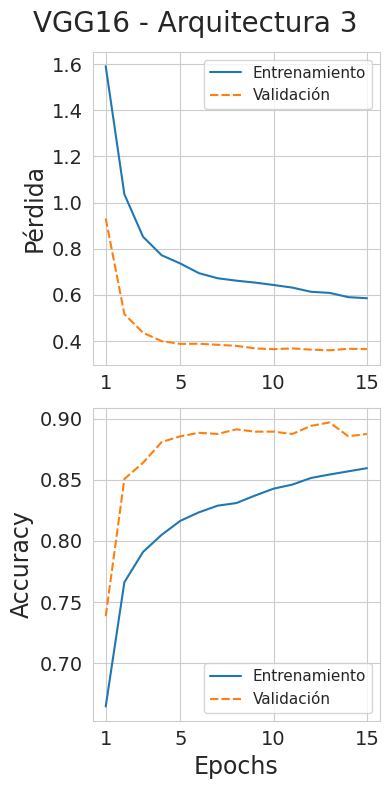

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="VGG16 - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

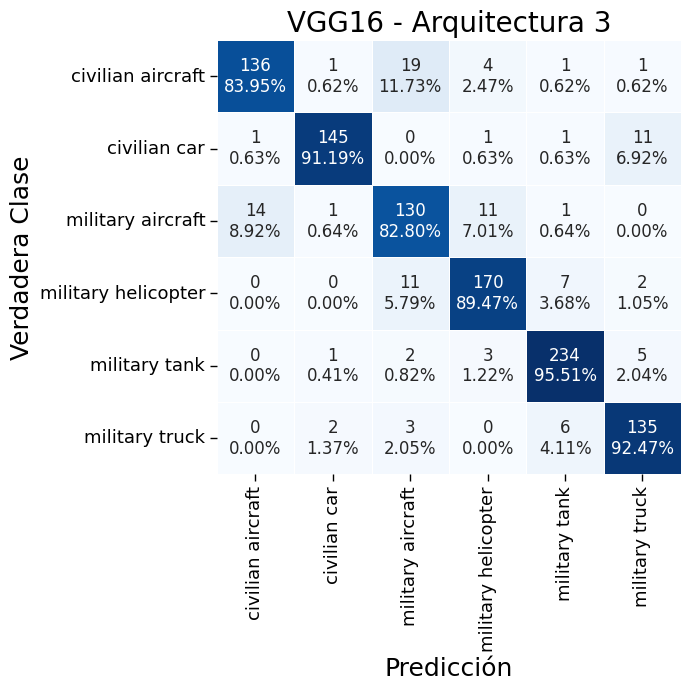

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg16_3relu.pth", weights_only=False)
model_vgg16_best, _, _ = get_model_vgg16(6, arch=3)
model_vgg16_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_vgg16_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "VGG16 - Arquitectura 3")

#### Arquitectura 4

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_vgg16, loss_fn, optimizer = get_model_vgg16(6, arch=4)
summary(model_vgg16, input_size=(1, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 6]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         (1,792)
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         (36,928)
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        (73,856)
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        (147,584)
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]    

Vemos que, de los 143,770,278 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 9,509,734. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_vgg16, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 22:41:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.08it/s]


Epoch: 1 - Ended: 19/04/25 22:43:34 - Duration: 131.52s

Training Loss: 1.605829048512587 - Validation Loss: 0.8809522250119377
Training Accuracy: 0.6368358913813459 - Validation Accuracy: 0.6817752596789424

Epoch: 2 - Started: 19/04/25 22:43:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.11it/s]


Epoch: 2 - Ended: 19/04/25 22:45:45 - Duration: 130.84s

Training Loss: 1.0064701624770662 - Validation Loss: 0.4736282317077412
Training Accuracy: 0.7700118063754428 - Validation Accuracy: 0.8479697828139755

Epoch: 3 - Started: 19/04/25 22:45:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.11it/s]


Epoch: 3 - Ended: 19/04/25 22:47:56 - Duration: 131.03s

Training Loss: 0.8290934607164183 - Validation Loss: 0.41693980553570914
Training Accuracy: 0.8014167650531286 - Validation Accuracy: 0.8715769593956563

Epoch: 4 - Started: 19/04/25 22:47:56


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]


Epoch: 4 - Ended: 19/04/25 22:50:07 - Duration: 131.21s

Training Loss: 0.7595656202800238 - Validation Loss: 0.39253614579930024
Training Accuracy: 0.8127508854781582 - Validation Accuracy: 0.8819641170915958

Epoch: 5 - Started: 19/04/25 22:50:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 5 - Ended: 19/04/25 22:52:19 - Duration: 131.73s

Training Loss: 0.7301099238111012 - Validation Loss: 0.3797317524166668
Training Accuracy: 0.8227863046044864 - Validation Accuracy: 0.8857412653446648

Epoch: 6 - Started: 19/04/25 22:52:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.09it/s]


Epoch: 6 - Ended: 19/04/25 22:54:30 - Duration: 130.65s

Training Loss: 0.6968075277200386 - Validation Loss: 0.37723246216773987
Training Accuracy: 0.8306965761511216 - Validation Accuracy: 0.8895184135977338

Epoch: 7 - Started: 19/04/25 22:54:30


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.10it/s]


Epoch: 7 - Ended: 19/04/25 22:56:41 - Duration: 131.06s

Training Loss: 0.6654348489063889 - Validation Loss: 0.373460491790491
Training Accuracy: 0.8350649350649351 - Validation Accuracy: 0.8923512747875354

Epoch: 8 - Started: 19/04/25 22:56:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.11it/s]


Epoch: 8 - Ended: 19/04/25 22:58:52 - Duration: 131.05s

Training Loss: 0.6461958266905884 - Validation Loss: 0.3813977574600893
Training Accuracy: 0.8371900826446281 - Validation Accuracy: 0.8838526912181303

Epoch: 9 - Started: 19/04/25 22:58:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.09it/s]


Epoch: 9 - Ended: 19/04/25 23:01:03 - Duration: 131.34s

Training Loss: 0.6356151762293346 - Validation Loss: 0.3634478344636805
Training Accuracy: 0.8472255017709563 - Validation Accuracy: 0.8942398489140698

Epoch: 10 - Started: 19/04/25 23:01:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 10 - Ended: 19/04/25 23:03:15 - Duration: 132.0s

Training Loss: 0.625435245126041 - Validation Loss: 0.36417363759349375
Training Accuracy: 0.8497048406139315 - Validation Accuracy: 0.8914069877242682

Epoch: 11 - Started: 19/04/25 23:03:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.08it/s]


Epoch: 11 - Ended: 19/04/25 23:05:27 - Duration: 132.15s

Training Loss: 0.6137373238357146 - Validation Loss: 0.36822692173368793
Training Accuracy: 0.8525383707201889 - Validation Accuracy: 0.8914069877242682

Epoch: 12 - Started: 19/04/25 23:05:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 12 - Ended: 19/04/25 23:07:39 - Duration: 131.65s

Training Loss: 0.6191012143199124 - Validation Loss: 0.36096350936328664
Training Accuracy: 0.8582054309327036 - Validation Accuracy: 0.8932955618508026

Epoch: 13 - Started: 19/04/25 23:07:39


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 13 - Ended: 19/04/25 23:09:51 - Duration: 131.55s

Training Loss: 0.5897296458037932 - Validation Loss: 0.35656316140118766
Training Accuracy: 0.8650531286894924 - Validation Accuracy: 0.9008498583569405

Epoch: 14 - Started: 19/04/25 23:09:51


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 14 - Ended: 19/04/25 23:12:02 - Duration: 131.89s

Training Loss: 0.5887863778356296 - Validation Loss: 0.361379672499264
Training Accuracy: 0.8631641086186541 - Validation Accuracy: 0.8951841359773371

Epoch: 15 - Started: 19/04/25 23:12:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]

Epoch: 15 - Ended: 19/04/25 23:14:15 - Duration: 132.22s

Training Loss: 0.589040197098433 - Validation Loss: 0.35135987663970275
Training Accuracy: 0.8652892561983471 - Validation Accuracy: 0.8923512747875354



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_vgg16.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/vgg16_4relu.pth")

In [ ]:
model_vgg16, _, _ = get_model_vgg16(6, arch=4)
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg16_4relu.pth", weights_only=False)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Representamos la evolución de la *accuracy* y la pérdida:

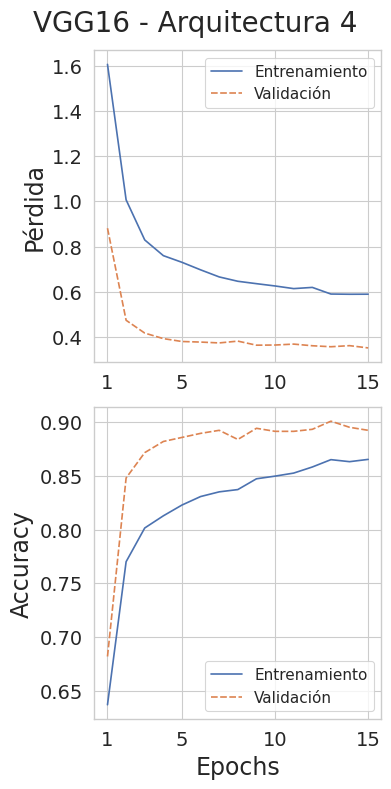

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="VGG16 - Arquitectura 4")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


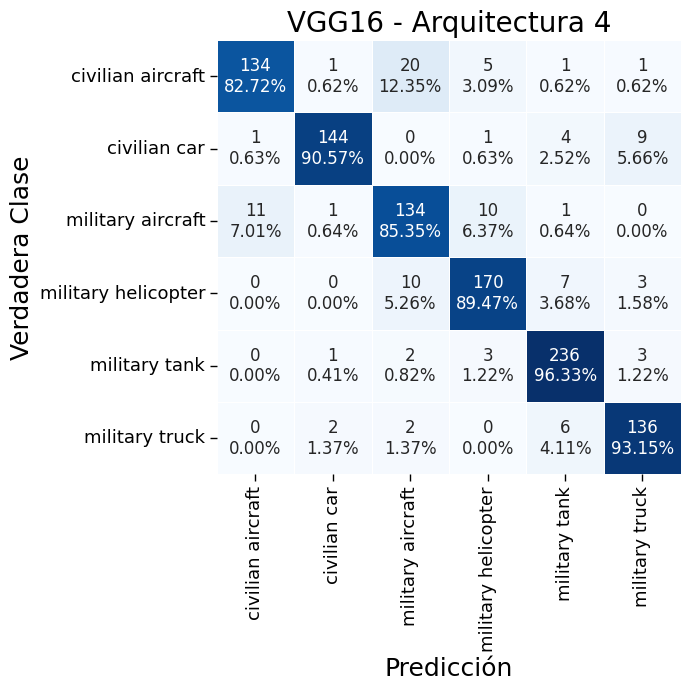

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg16_4relu.pth", weights_only=False)
model_vgg16_best, _, _ = get_model_vgg16(6, arch=4)
model_vgg16_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_vgg16_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "VGG16 - Arquitectura 4")

#### Fine-tuning + Transfer Learning

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_vgg16, loss_fn, optimizer = get_model_vgg16(6, arch=5)
summary(model_vgg16, input_size=(1, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 6]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         (1,792)
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         (36,928)
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        (73,856)
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        (147,584)
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]    

Vemos que, de los 134,285,126 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 16,805,894. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_vgg16, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 16:14:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 1 - Ended: 19/04/25 16:16:38 - Duration: 133.09s

Training Loss: 0.7778043657986086 - Validation Loss: 0.38771237783572254
Training Accuracy: 0.8165289256198347 - Validation Accuracy: 0.8706326723323891

Epoch: 2 - Started: 19/04/25 16:16:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 2 - Ended: 19/04/25 16:18:53 - Duration: 134.07s

Training Loss: 0.5438533167340862 - Validation Loss: 0.3486294369487202
Training Accuracy: 0.8621015348288076 - Validation Accuracy: 0.8980169971671388

Epoch: 3 - Started: 19/04/25 16:18:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 3 - Ended: 19/04/25 16:21:06 - Duration: 133.53s

Training Loss: 0.4669485414650903 - Validation Loss: 0.32657499699031606
Training Accuracy: 0.8857142857142857 - Validation Accuracy: 0.9046270066100094

Epoch: 4 - Started: 19/04/25 16:21:06


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.02it/s]


Epoch: 4 - Ended: 19/04/25 16:23:20 - Duration: 133.58s

Training Loss: 0.42133531463679985 - Validation Loss: 0.3193480043726809
Training Accuracy: 0.9046044864226682 - Validation Accuracy: 0.9102927289896129

Epoch: 5 - Started: 19/04/25 16:23:20


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 5 - Ended: 19/04/25 16:25:34 - Duration: 134.24s

Training Loss: 0.3911492646630131 - Validation Loss: 0.31128225256414976
Training Accuracy: 0.9192443919716647 - Validation Accuracy: 0.9140698772426817

Epoch: 6 - Started: 19/04/25 16:25:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 6 - Ended: 19/04/25 16:27:47 - Duration: 133.55s

Training Loss: 0.3567599253867989 - Validation Loss: 0.3121684531078619
Training Accuracy: 0.9295159386068477 - Validation Accuracy: 0.9140698772426817

Epoch: 7 - Started: 19/04/25 16:27:47


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.04it/s]


Epoch: 7 - Ended: 19/04/25 16:30:00 - Duration: 132.95s

Training Loss: 0.3361784181932905 - Validation Loss: 0.3104686197989127
Training Accuracy: 0.9369539551357733 - Validation Accuracy: 0.9150141643059491

Epoch: 8 - Started: 19/04/25 16:30:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 8 - Ended: 19/04/25 16:32:15 - Duration: 134.61s

Training Loss: 0.3147701420890751 - Validation Loss: 0.31525493062594356
Training Accuracy: 0.9355371900826446 - Validation Accuracy: 0.9150141643059491

Epoch: 9 - Started: 19/04/25 16:32:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.08it/s]


Epoch: 9 - Ended: 19/04/25 16:34:29 - Duration: 133.51s

Training Loss: 0.29638660109754816 - Validation Loss: 0.32259969194145766
Training Accuracy: 0.9427390791027155 - Validation Accuracy: 0.9197355996222851

Epoch: 10 - Started: 19/04/25 16:34:29


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 10 - Ended: 19/04/25 16:36:42 - Duration: 133.65s

Training Loss: 0.2765648467327232 - Validation Loss: 0.3232124011744471
Training Accuracy: 0.947107438016529 - Validation Accuracy: 0.9159584513692163

Epoch: 11 - Started: 19/04/25 16:36:42


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 11 - Ended: 19/04/25 16:38:56 - Duration: 133.64s

Training Loss: 0.2510102882758895 - Validation Loss: 0.31859685677815885
Training Accuracy: 0.9558441558441558 - Validation Accuracy: 0.9102927289896129

Epoch: 12 - Started: 19/04/25 16:38:56


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.02it/s]


Epoch: 12 - Ended: 19/04/25 16:41:10 - Duration: 134.35s

Training Loss: 0.24977887455207198 - Validation Loss: 0.32832128423101764
Training Accuracy: 0.959504132231405 - Validation Accuracy: 0.9093484419263456

Epoch: 13 - Started: 19/04/25 16:41:10


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 13 - Ended: 19/04/25 16:43:24 - Duration: 134.02s

Training Loss: 0.2356938517360545 - Validation Loss: 0.3326927287613644
Training Accuracy: 0.9669421487603306 - Validation Accuracy: 0.9140698772426817

Epoch: 14 - Started: 19/04/25 16:43:24


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.02it/s]


Epoch: 14 - Ended: 19/04/25 16:45:38 - Duration: 134.03s

Training Loss: 0.21913500152417084 - Validation Loss: 0.3382704187841976
Training Accuracy: 0.9632821723730814 - Validation Accuracy: 0.9197355996222851

Epoch: 15 - Started: 19/04/25 16:45:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.04it/s]

Epoch: 15 - Ended: 19/04/25 16:47:52 - Duration: 133.36s

Training Loss: 0.21053455970180568 - Validation Loss: 0.34143205293837714
Training Accuracy: 0.9722550177095631 - Validation Accuracy: 0.9131255901794145



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_vgg16.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/vgg16_finetuned.pth")

In [ ]:
model_vgg16, _, _ = get_model_vgg16(6, arch=5)
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg16_finetuned.pth", weights_only=False)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Representamos la evolución de la *accuracy* y la pérdida:

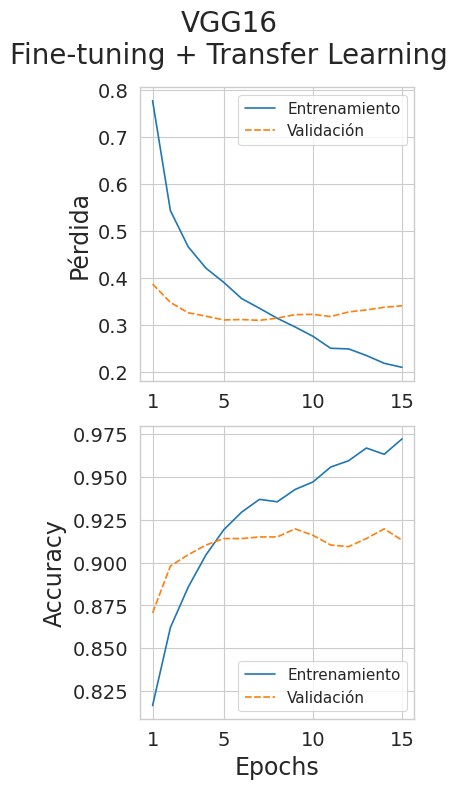

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="VGG16\nFine-tuning + Transfer Learning")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


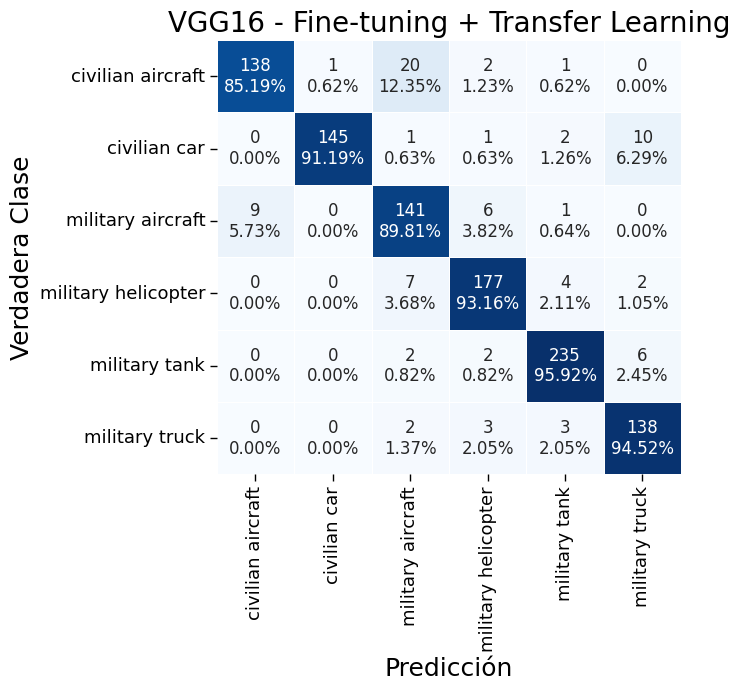

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg16_finetuned.pth", weights_only=False)
model_vgg16_best, _, _ = get_model_vgg16(6, arch=5)
model_vgg16_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_vgg16_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "VGG16 - Fine-tuning + Transfer Learning")

### VGG19

#### Modelo

Vamos a aplicar transfer-learning al modelo VGG16 pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_vgg19 = models.vgg19(weights=models.VGG19_Weights.DEFAULT)
summary(model_vgg19, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 1000]                 --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos un poco:

In [ ]:
def get_model_vgg19(num_classes, arch=3):
    """
    Nos permite obtener un modelo VGG19 con una determinada configuración listo
    para entrenar, su optimizador (Adam) y la funcion de pérdida de entropía
    cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.vgg19(weights=models.VGG19_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.features.parameters():
        param.requires_grad = False

    # Si la arquitectura es 3 o 4, congela el clasificador hasta el final, si
    # no, congela solo la primera capa
    if arch == 3 or arch == 4:
        for param in model.classifier[:-1].parameters():
            param.requires_grad = False
    elif arch == 5:
        for param in model.classifier[:-4].parameters():
            param.requires_grad = False
    else:
        raise Exception("Invalid architecture")

    # Seleccionamos la configuracion
    if arch == 3:
        model.classifier = nn.Sequential(
                model.classifier[0],
                model.classifier[1],
                model.classifier[2],
                model.classifier[3],
                model.classifier[4],
                model.classifier[5],
                nn.Linear(model.classifier[3].out_features, 1024),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(1024, 512),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(512, 128),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(128, 32),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(32, num_classes)
            )
    elif arch == 4:
        model.classifier = nn.Sequential(
            model.classifier[0],
            model.classifier[1],
            model.classifier[2],
            model.classifier[3],
            model.classifier[4],
            model.classifier[5],
            nn.Linear(model.classifier[3].out_features, 2048),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )
    elif arch == 5:
        model.classifier[6] = nn.Linear(4096, 6)

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)
    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_vgg19, loss_fn, optimizer = get_model_vgg19(6, arch=3)
summary(model_vgg19, input_size=(1, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 6]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         (1,792)
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         (36,928)
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        (73,856)
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        (147,584)
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]    

Vemos que, de los 144,360,358 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 4,790,118. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_vgg19, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 23:14:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 1 - Ended: 19/04/25 23:16:33 - Duration: 133.86s

Training Loss: 1.6108567198710655 - Validation Loss: 0.9830485231736127
Training Accuracy: 0.5853600944510036 - Validation Accuracy: 0.6496694995278565

Epoch: 2 - Started: 19/04/25 23:16:33


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 2 - Ended: 19/04/25 23:18:46 - Duration: 132.99s

Training Loss: 1.0612210346691644 - Validation Loss: 0.5172512969549965
Training Accuracy: 0.7642266824085006 - Validation Accuracy: 0.8489140698772427

Epoch: 3 - Started: 19/04/25 23:18:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 3 - Ended: 19/04/25 23:21:00 - Duration: 133.69s

Training Loss: 0.8674041539875429 - Validation Loss: 0.435872602112153
Training Accuracy: 0.7831168831168831 - Validation Accuracy: 0.8668555240793201

Epoch: 4 - Started: 19/04/25 23:21:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.04it/s]


Epoch: 4 - Ended: 19/04/25 23:23:13 - Duration: 133.37s

Training Loss: 0.7990614291447312 - Validation Loss: 0.406960047343198
Training Accuracy: 0.8005903187721369 - Validation Accuracy: 0.8753541076487252

Epoch: 5 - Started: 19/04/25 23:23:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 5 - Ended: 19/04/25 23:25:27 - Duration: 133.6s

Training Loss: 0.7565573160328082 - Validation Loss: 0.3888526094310424
Training Accuracy: 0.8126328217237309 - Validation Accuracy: 0.8810198300283286

Epoch: 6 - Started: 19/04/25 23:25:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 6 - Ended: 19/04/25 23:27:41 - Duration: 133.97s

Training Loss: 0.7201870902260737 - Validation Loss: 0.37723710519426007
Training Accuracy: 0.8204250295159387 - Validation Accuracy: 0.8791312559017942

Epoch: 7 - Started: 19/04/25 23:27:41


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.04it/s]


Epoch: 7 - Ended: 19/04/25 23:29:54 - Duration: 133.27s

Training Loss: 0.7090978862634346 - Validation Loss: 0.3660150187857011
Training Accuracy: 0.828099173553719 - Validation Accuracy: 0.8914069877242682

Epoch: 8 - Started: 19/04/25 23:29:54


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 8 - Ended: 19/04/25 23:32:08 - Duration: 133.96s

Training Loss: 0.6748118720837494 - Validation Loss: 0.36572011691682477
Training Accuracy: 0.8381345926800472 - Validation Accuracy: 0.8895184135977338

Epoch: 9 - Started: 19/04/25 23:32:08


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 9 - Ended: 19/04/25 23:34:21 - Duration: 133.47s

Training Loss: 0.6553958609922609 - Validation Loss: 0.3625098633415559
Training Accuracy: 0.8420306965761511 - Validation Accuracy: 0.8970727101038716

Epoch: 10 - Started: 19/04/25 23:34:21


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 10 - Ended: 19/04/25 23:36:35 - Duration: 133.77s

Training Loss: 0.6431163727347531 - Validation Loss: 0.360412218114909
Training Accuracy: 0.8420306965761511 - Validation Accuracy: 0.8914069877242682

Epoch: 11 - Started: 19/04/25 23:36:35


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 11 - Ended: 19/04/25 23:38:49 - Duration: 133.34s

Training Loss: 0.6241731870530257 - Validation Loss: 0.3678570179378285
Training Accuracy: 0.8487603305785124 - Validation Accuracy: 0.8914069877242682

Epoch: 12 - Started: 19/04/25 23:38:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.04it/s]


Epoch: 12 - Ended: 19/04/25 23:41:02 - Duration: 133.27s

Training Loss: 0.6150811590365509 - Validation Loss: 0.36122819781303406
Training Accuracy: 0.8523022432113341 - Validation Accuracy: 0.8999055712936733

Epoch: 13 - Started: 19/04/25 23:41:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 13 - Ended: 19/04/25 23:43:15 - Duration: 133.05s

Training Loss: 0.6033276613078901 - Validation Loss: 0.35422735091517954
Training Accuracy: 0.8565525383707202 - Validation Accuracy: 0.8961284230406044

Epoch: 14 - Started: 19/04/25 23:43:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 14 - Ended: 19/04/25 23:45:28 - Duration: 133.54s

Training Loss: 0.5979116839259419 - Validation Loss: 0.35863947079462166
Training Accuracy: 0.8537190082644628 - Validation Accuracy: 0.8980169971671388

Epoch: 15 - Started: 19/04/25 23:45:28


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]

Epoch: 15 - Ended: 19/04/25 23:47:42 - Duration: 133.06s

Training Loss: 0.5812383142869864 - Validation Loss: 0.34215347731814666
Training Accuracy: 0.8606847697756789 - Validation Accuracy: 0.8961284230406044



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_vgg19.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/vgg19_3relu.pth")

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg19_3relu.pth", weights_only=False)

Representamos la evolución de la *accuracy* y la pérdida:

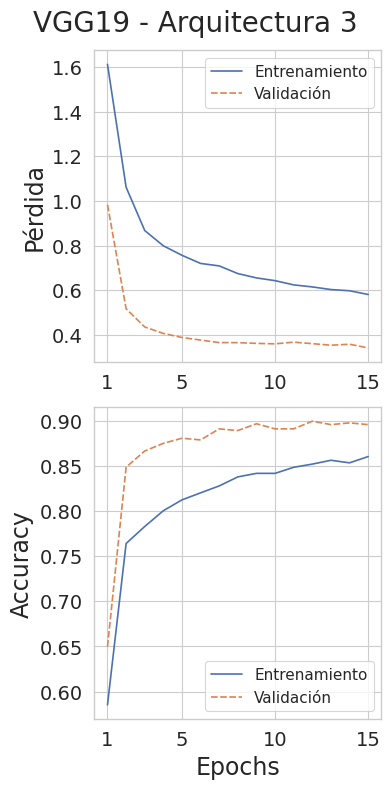

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="VGG19 - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


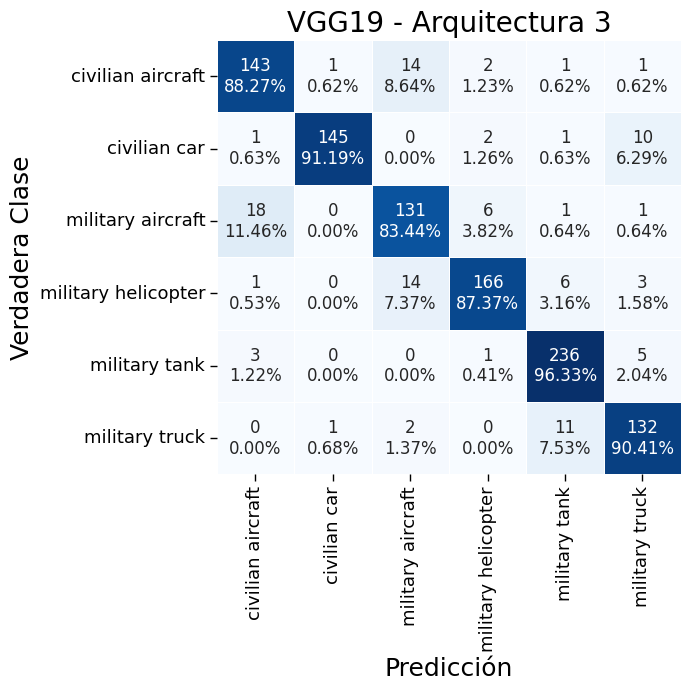

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg19_3relu.pth", weights_only=False)
model_vgg19_best, _, _ = get_model_vgg19(6, arch=3)
model_vgg19_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_vgg19_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "VGG19 - Arquitectura 3")

#### Arquitectura 4

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_vgg19, loss_fn, optimizer = get_model_vgg19(6, arch=4)
summary(model_vgg19, input_size=(1, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 6]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         (1,792)
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         (36,928)
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        (73,856)
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        (147,584)
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]    

Vemos que, de los 149,079,974 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 9,509,734. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_vgg19, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 19/04/25 23:47:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 1 - Ended: 19/04/25 23:50:00 - Duration: 133.85s

Training Loss: 1.5079312733749846 - Validation Loss: 0.8159649161731496
Training Accuracy: 0.6621015348288075 - Validation Accuracy: 0.7365439093484419

Epoch: 2 - Started: 19/04/25 23:50:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 2 - Ended: 19/04/25 23:52:13 - Duration: 132.88s

Training Loss: 0.9897416696619632 - Validation Loss: 0.45582564262782826
Training Accuracy: 0.7804014167650531 - Validation Accuracy: 0.8649669499527857

Epoch: 3 - Started: 19/04/25 23:52:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 3 - Ended: 19/04/25 23:54:26 - Duration: 133.54s

Training Loss: 0.7974174280664814 - Validation Loss: 0.3887876482570873
Training Accuracy: 0.8007083825265644 - Validation Accuracy: 0.8800755429650614

Epoch: 4 - Started: 19/04/25 23:54:26


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 4 - Ended: 19/04/25 23:56:39 - Duration: 132.7s

Training Loss: 0.7326362435497454 - Validation Loss: 0.38987507977906394
Training Accuracy: 0.8096812278630461 - Validation Accuracy: 0.882908404154863

Epoch: 5 - Started: 19/04/25 23:56:39


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 5 - Ended: 19/04/25 23:58:52 - Duration: 132.99s

Training Loss: 0.7092944952979017 - Validation Loss: 0.3711191407021354
Training Accuracy: 0.8243211334120425 - Validation Accuracy: 0.8914069877242682

Epoch: 6 - Started: 19/04/25 23:58:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 6 - Ended: 20/04/25 00:01:06 - Duration: 133.67s

Training Loss: 0.6775668165576991 - Validation Loss: 0.36675698616925406
Training Accuracy: 0.833530106257379 - Validation Accuracy: 0.886685552407932

Epoch: 7 - Started: 20/04/25 00:01:06


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 7 - Ended: 20/04/25 00:03:19 - Duration: 133.15s

Training Loss: 0.6581587279910472 - Validation Loss: 0.35732707381248474
Training Accuracy: 0.8348288075560802 - Validation Accuracy: 0.8932955618508026

Epoch: 8 - Started: 20/04/25 00:03:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 8 - Ended: 20/04/25 00:05:32 - Duration: 133.09s

Training Loss: 0.6343868130178594 - Validation Loss: 0.35512656499357786
Training Accuracy: 0.8427390791027155 - Validation Accuracy: 0.8932955618508026

Epoch: 9 - Started: 20/04/25 00:05:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 9 - Ended: 20/04/25 00:07:45 - Duration: 133.17s

Training Loss: 0.6218651582056017 - Validation Loss: 0.35061798200887795
Training Accuracy: 0.8469893742621015 - Validation Accuracy: 0.8961284230406044

Epoch: 10 - Started: 20/04/25 00:07:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.08it/s]


Epoch: 10 - Ended: 20/04/25 00:09:59 - Duration: 133.45s

Training Loss: 0.6184894696100435 - Validation Loss: 0.34859592774335074
Training Accuracy: 0.8537190082644628 - Validation Accuracy: 0.898961284230406

Epoch: 11 - Started: 20/04/25 00:09:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 11 - Ended: 20/04/25 00:12:12 - Duration: 133.41s

Training Loss: 0.5997281919664411 - Validation Loss: 0.35113102986532096
Training Accuracy: 0.8563164108618654 - Validation Accuracy: 0.8999055712936733

Epoch: 12 - Started: 20/04/25 00:12:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 12 - Ended: 20/04/25 00:14:25 - Duration: 133.01s

Training Loss: 0.5796479778503304 - Validation Loss: 0.35124919169089375
Training Accuracy: 0.8613931523022432 - Validation Accuracy: 0.902738432483475

Epoch: 13 - Started: 20/04/25 00:14:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.07it/s]


Epoch: 13 - Ended: 20/04/25 00:16:38 - Duration: 133.43s

Training Loss: 0.5758451214477197 - Validation Loss: 0.3442661692114437
Training Accuracy: 0.8613931523022432 - Validation Accuracy: 0.8980169971671388

Epoch: 14 - Started: 20/04/25 00:16:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


Epoch: 14 - Ended: 20/04/25 00:18:52 - Duration: 133.85s

Training Loss: 0.5721213110347292 - Validation Loss: 0.3435118364937165
Training Accuracy: 0.8706021251475797 - Validation Accuracy: 0.902738432483475

Epoch: 15 - Started: 20/04/25 00:18:52


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]

Epoch: 15 - Ended: 20/04/25 00:21:05 - Duration: 133.25s

Training Loss: 0.5638947411259608 - Validation Loss: 0.35136482996099133
Training Accuracy: 0.8713105076741441 - Validation Accuracy: 0.9017941454202077



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_vgg19.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/vgg19_4relu.pth")

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg19_4relu.pth", weights_only=False)

Representamos la evolución de la *accuracy* y la pérdida:

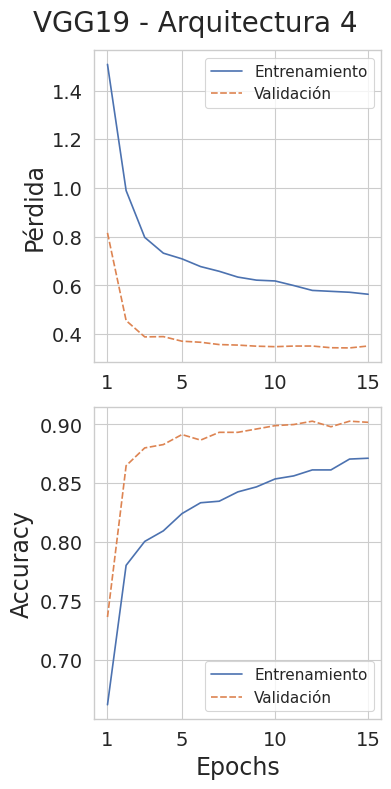

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="VGG19 - Arquitectura 4")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


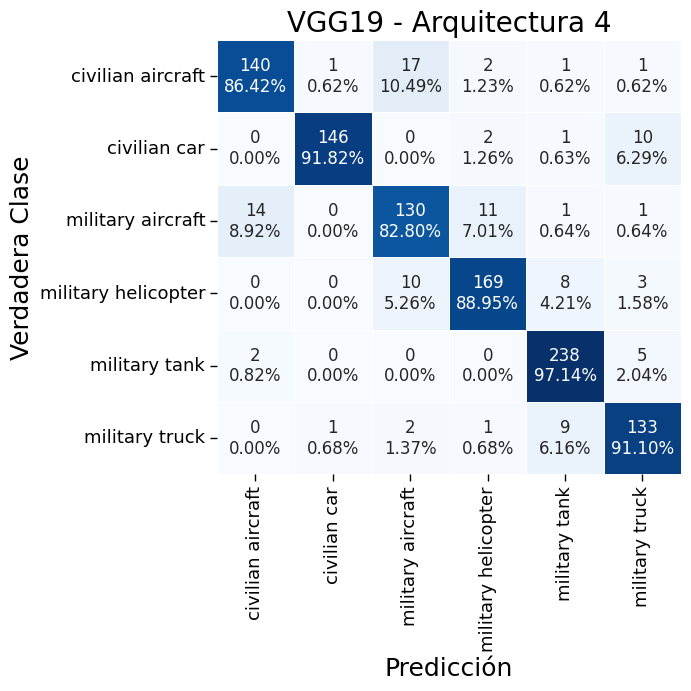

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg19_4relu.pth", weights_only=False)
model_vgg19_best, _, _ = get_model_vgg19(6, arch=4)
model_vgg19_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_vgg19_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "VGG19 - Arquitectura 4")

#### Fine-tuning + Transfer Learning

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_vgg19, loss_fn, optimizer = get_model_vgg19(6, arch=5)
summary(model_vgg19, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 6]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         (1,792)
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         (36,928)
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        (73,856)
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        (147,584)
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]    

Vemos que, de los 139,594,822 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 16,805,894. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_vgg19, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 09:25:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 1 - Ended: 20/04/25 09:28:04 - Duration: 135.02s

Training Loss: 0.7777015059741575 - Validation Loss: 0.35302812211653767
Training Accuracy: 0.825974025974026 - Validation Accuracy: 0.9017941454202077

Epoch: 2 - Started: 20/04/25 09:28:04


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 2 - Ended: 20/04/25 09:30:19 - Duration: 134.76s

Training Loss: 0.5364955040945936 - Validation Loss: 0.34542566187241497
Training Accuracy: 0.8629279811097993 - Validation Accuracy: 0.9017941454202077

Epoch: 3 - Started: 20/04/25 09:30:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.04it/s]


Epoch: 3 - Ended: 20/04/25 09:32:33 - Duration: 134.79s

Training Loss: 0.4693558353986313 - Validation Loss: 0.3187569046721739
Training Accuracy: 0.8786304604486422 - Validation Accuracy: 0.9036827195467422

Epoch: 4 - Started: 20/04/25 09:32:33


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 4 - Ended: 20/04/25 09:34:48 - Duration: 134.66s

Training Loss: 0.42061678464732954 - Validation Loss: 0.32598470589693856
Training Accuracy: 0.8939787485242031 - Validation Accuracy: 0.9074598677998111

Epoch: 5 - Started: 20/04/25 09:34:48


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 5 - Ended: 20/04/25 09:37:03 - Duration: 134.79s

Training Loss: 0.3962215754523206 - Validation Loss: 0.3256726405199836
Training Accuracy: 0.9110979929161748 - Validation Accuracy: 0.9112370160528801

Epoch: 6 - Started: 20/04/25 09:37:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.02it/s]


Epoch: 6 - Ended: 20/04/25 09:39:17 - Duration: 134.5s

Training Loss: 0.360269960627627 - Validation Loss: 0.3104160419281791
Training Accuracy: 0.9219598583234947 - Validation Accuracy: 0.9093484419263456

Epoch: 7 - Started: 20/04/25 09:39:17


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 7 - Ended: 20/04/25 09:41:32 - Duration: 134.68s

Training Loss: 0.34040705036761154 - Validation Loss: 0.3229082112803179
Training Accuracy: 0.925974025974026 - Validation Accuracy: 0.9169027384324835

Epoch: 8 - Started: 20/04/25 09:41:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 8 - Ended: 20/04/25 09:43:47 - Duration: 134.8s

Training Loss: 0.3126330860515139 - Validation Loss: 0.31982146992402916
Training Accuracy: 0.935064935064935 - Validation Accuracy: 0.9206798866855525

Epoch: 9 - Started: 20/04/25 09:43:47


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.02it/s]


Epoch: 9 - Ended: 20/04/25 09:46:01 - Duration: 134.6s

Training Loss: 0.29119451900026694 - Validation Loss: 0.3266001549713752
Training Accuracy: 0.9367178276269186 - Validation Accuracy: 0.9159584513692163

Epoch: 10 - Started: 20/04/25 09:46:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]


Epoch: 10 - Ended: 20/04/25 09:48:16 - Duration: 134.35s

Training Loss: 0.2742508480797953 - Validation Loss: 0.33845524183090997
Training Accuracy: 0.948642266824085 - Validation Accuracy: 0.9140698772426817

Epoch: 11 - Started: 20/04/25 09:48:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.02it/s]


Epoch: 11 - Ended: 20/04/25 09:50:31 - Duration: 135.19s

Training Loss: 0.2709272248086645 - Validation Loss: 0.32976269480936665
Training Accuracy: 0.9547815820543093 - Validation Accuracy: 0.9140698772426817

Epoch: 12 - Started: 20/04/25 09:50:31


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.04it/s]


Epoch: 12 - Ended: 20/04/25 09:52:46 - Duration: 134.76s

Training Loss: 0.25244497252044396 - Validation Loss: 0.34014083050629673
Training Accuracy: 0.9592680047225501 - Validation Accuracy: 0.9140698772426817

Epoch: 13 - Started: 20/04/25 09:52:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.04it/s]


Epoch: 13 - Ended: 20/04/25 09:55:01 - Duration: 134.77s

Training Loss: 0.24010624591983967 - Validation Loss: 0.3447863720357418
Training Accuracy: 0.9605667060212515 - Validation Accuracy: 0.9121813031161473

Epoch: 14 - Started: 20/04/25 09:55:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.05it/s]


Epoch: 14 - Ended: 20/04/25 09:57:15 - Duration: 134.77s

Training Loss: 0.2220988380375193 - Validation Loss: 0.35534114346784706
Training Accuracy: 0.9623376623376624 - Validation Accuracy: 0.9131255901794145

Epoch: 15 - Started: 20/04/25 09:57:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.03it/s]

Epoch: 15 - Ended: 20/04/25 09:59:30 - Duration: 134.62s

Training Loss: 0.21174427322042522 - Validation Loss: 0.3407038638696951
Training Accuracy: 0.9688311688311688 - Validation Accuracy: 0.9169027384324835



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_vgg19.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/vgg19_finetuned.pth")

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg19_finetuned.pth", weights_only=False)

Representamos la evolución de la *accuracy* y la pérdida:

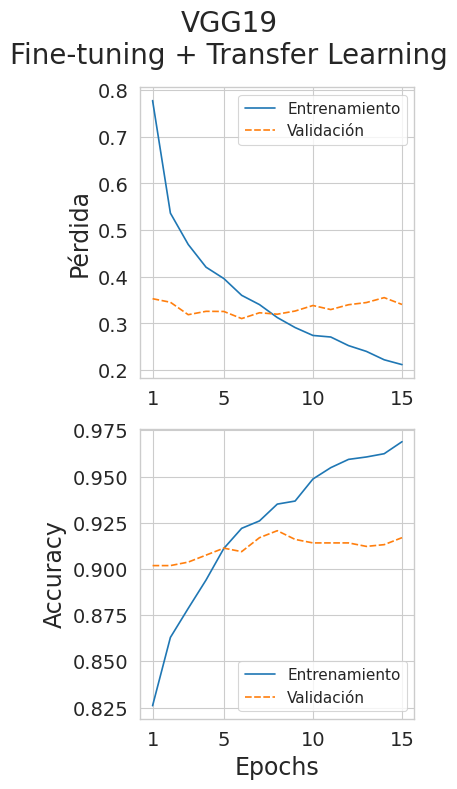

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="VGG19\nFine-tuning + Transfer Learning")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


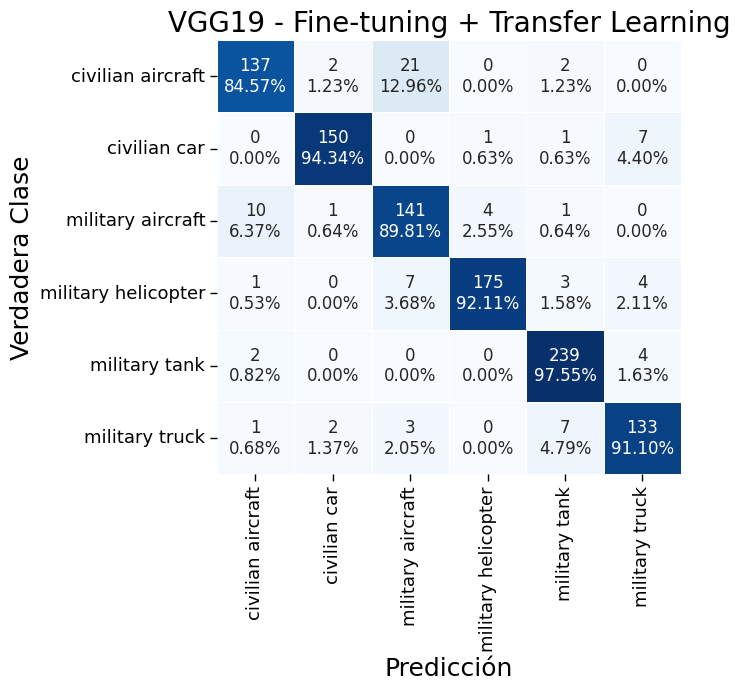

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg19_finetuned.pth", weights_only=False)
model_vgg19_best, _, _ = get_model_vgg19(6, arch=5)
model_vgg19_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_vgg19_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "VGG19 - Fine-tuning + Transfer Learning")

In [ ]:
predictions

array([5., 5., 2., ..., 3., 4., 4.], dtype=float32)

In [ ]:
val_dataset.y.to_numpy()

array([1, 5, 2, ..., 3, 4, 4])

### GoogLeNet

#### Modelo

Vamos a aplicar transfer-learning al modelo GoogLeNet pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_googlenet = models.googlenet(weights=models.GoogLeNet_Weights.DEFAULT)
summary(model_googlenet, input_size=(1,3, 224, 224))

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 162MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
GoogLeNet                                [1, 1000]                 --
├─BasicConv2d: 1-1                       [1, 64, 112, 112]         --
│    └─Conv2d: 2-1                       [1, 64, 112, 112]         9,408
│    └─BatchNorm2d: 2-2                  [1, 64, 112, 112]         128
├─MaxPool2d: 1-2                         [1, 64, 56, 56]           --
├─BasicConv2d: 1-3                       [1, 64, 56, 56]           --
│    └─Conv2d: 2-3                       [1, 64, 56, 56]           4,096
│    └─BatchNorm2d: 2-4                  [1, 64, 56, 56]           128
├─BasicConv2d: 1-4                       [1, 192, 56, 56]          --
│    └─Conv2d: 2-5                       [1, 192, 56, 56]          110,592
│    └─BatchNorm2d: 2-6                  [1, 192, 56, 56]          384
├─MaxPool2d: 1-5                         [1, 192, 28, 28]          --
├─Inception: 1-6                         [1, 256, 28, 28]          --
│

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos un poco:

In [ ]:
def get_model_googlenet(num_classes, arch=3):
    """
    Nos permite obtener un modelo GoogLeNet con una determinada configuración
    listo para entrenar, su optimizador (Adam) y la funcion de pérdida de
    entropía cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.googlenet(weights=models.GoogLeNet_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.parameters():
        param.requires_grad = False

    # Seleccionamos la configuracion
    if arch == 3:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(2, 2))
        model.fc = nn.Sequential(
                nn.Linear(4096, 1024),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(1024, 512),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(512, 128),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(128, 32),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(32, num_classes)
            )
    elif arch == 4:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(3, 3))
        model.fc = nn.Sequential(
            nn.Linear(9216, 2048),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_googlenet, loss_fn, optimizer = get_model_googlenet(6, arch=3)
summary(model_googlenet, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
GoogLeNet                                [1, 6]                    --
├─BasicConv2d: 1-1                       [1, 64, 112, 112]         --
│    └─Conv2d: 2-1                       [1, 64, 112, 112]         (9,408)
│    └─BatchNorm2d: 2-2                  [1, 64, 112, 112]         (128)
├─MaxPool2d: 1-2                         [1, 64, 56, 56]           --
├─BasicConv2d: 1-3                       [1, 64, 56, 56]           --
│    └─Conv2d: 2-3                       [1, 64, 56, 56]           (4,096)
│    └─BatchNorm2d: 2-4                  [1, 64, 56, 56]           (128)
├─BasicConv2d: 1-4                       [1, 192, 56, 56]          --
│    └─Conv2d: 2-5                       [1, 192, 56, 56]          (110,592)
│    └─BatchNorm2d: 2-6                  [1, 192, 56, 56]          (384)
├─MaxPool2d: 1-5                         [1, 192, 28, 28]          --
├─Inception: 1-6                         [1, 256, 28, 28]  

Vemos que, de los 10,390,022 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 4,790,118. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_googlenet, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 03:10:33


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 1 - Ended: 20/04/25 03:12:39 - Duration: 125.61s

Training Loss: 1.719906851426879 - Validation Loss: 1.3790614324457504
Training Accuracy: 0.5301062573789846 - Validation Accuracy: 0.591123701605288

Epoch: 2 - Started: 20/04/25 03:12:39


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 2 - Ended: 20/04/25 03:14:43 - Duration: 124.48s

Training Loss: 1.317480667313533 - Validation Loss: 0.7748047814649694
Training Accuracy: 0.6485242030696576 - Validation Accuracy: 0.6997167138810199

Epoch: 3 - Started: 20/04/25 03:14:43


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 3 - Ended: 20/04/25 03:16:48 - Duration: 125.01s

Training Loss: 1.0168972887209993 - Validation Loss: 0.5219016671180725
Training Accuracy: 0.7710743801652893 - Validation Accuracy: 0.8347497639282342

Epoch: 4 - Started: 20/04/25 03:16:48


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 4 - Ended: 20/04/25 03:18:53 - Duration: 124.92s

Training Loss: 0.8805766852933969 - Validation Loss: 0.4451604599461836
Training Accuracy: 0.7904368358913814 - Validation Accuracy: 0.8555240793201133

Epoch: 5 - Started: 20/04/25 03:18:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 5 - Ended: 20/04/25 03:20:58 - Duration: 124.82s

Training Loss: 0.7832290930534477 - Validation Loss: 0.4101267535896862
Training Accuracy: 0.80271546635183 - Validation Accuracy: 0.8659112370160529

Epoch: 6 - Started: 20/04/25 03:20:58


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 6 - Ended: 20/04/25 03:23:03 - Duration: 125.13s

Training Loss: 0.7421477090066938 - Validation Loss: 0.38512713155325723
Training Accuracy: 0.8229043683589138 - Validation Accuracy: 0.8753541076487252

Epoch: 7 - Started: 20/04/25 03:23:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 7 - Ended: 20/04/25 03:25:08 - Duration: 125.0s

Training Loss: 0.6956253345332929 - Validation Loss: 0.3829108314479099
Training Accuracy: 0.8354191263282172 - Validation Accuracy: 0.8781869688385269

Epoch: 8 - Started: 20/04/25 03:25:08


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 8 - Ended: 20/04/25 03:27:13 - Duration: 125.53s

Training Loss: 0.6563740163596709 - Validation Loss: 0.37502555943587246
Training Accuracy: 0.8375442739079103 - Validation Accuracy: 0.8781869688385269

Epoch: 9 - Started: 20/04/25 03:27:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 9 - Ended: 20/04/25 03:29:19 - Duration: 125.87s

Training Loss: 0.6306153224475348 - Validation Loss: 0.3742792168084313
Training Accuracy: 0.8495867768595041 - Validation Accuracy: 0.8762983947119924

Epoch: 10 - Started: 20/04/25 03:29:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Epoch: 10 - Ended: 20/04/25 03:31:25 - Duration: 125.37s

Training Loss: 0.6115732108479115 - Validation Loss: 0.36256177876802054
Training Accuracy: 0.8569067296340024 - Validation Accuracy: 0.8819641170915958

Epoch: 11 - Started: 20/04/25 03:31:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 11 - Ended: 20/04/25 03:33:30 - Duration: 125.03s

Training Loss: 0.5845082700252533 - Validation Loss: 0.3674091034952332
Training Accuracy: 0.8618654073199528 - Validation Accuracy: 0.882908404154863

Epoch: 12 - Started: 20/04/25 03:33:30


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 12 - Ended: 20/04/25 03:35:34 - Duration: 124.68s

Training Loss: 0.5683110658802203 - Validation Loss: 0.3757497795364436
Training Accuracy: 0.8672963400236128 - Validation Accuracy: 0.8857412653446648

Epoch: 13 - Started: 20/04/25 03:35:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 13 - Ended: 20/04/25 03:37:39 - Duration: 125.07s

Training Loss: 0.55387797773774 - Validation Loss: 0.3640593640944537
Training Accuracy: 0.8763872491145218 - Validation Accuracy: 0.886685552407932

Epoch: 14 - Started: 20/04/25 03:37:39


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.26it/s]


Epoch: 14 - Ended: 20/04/25 03:39:45 - Duration: 125.68s

Training Loss: 0.522306195835569 - Validation Loss: 0.3677991576054517
Training Accuracy: 0.8838252656434474 - Validation Accuracy: 0.8819641170915958

Epoch: 15 - Started: 20/04/25 03:39:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]

Epoch: 15 - Ended: 20/04/25 03:41:50 - Duration: 125.3s

Training Loss: 0.515550134786919 - Validation Loss: 0.37572157163830366
Training Accuracy: 0.8853600944510035 - Validation Accuracy: 0.8819641170915958



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_googlenet.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/googlenet_3relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/googlenet_3relu.pth", weights_only=False)

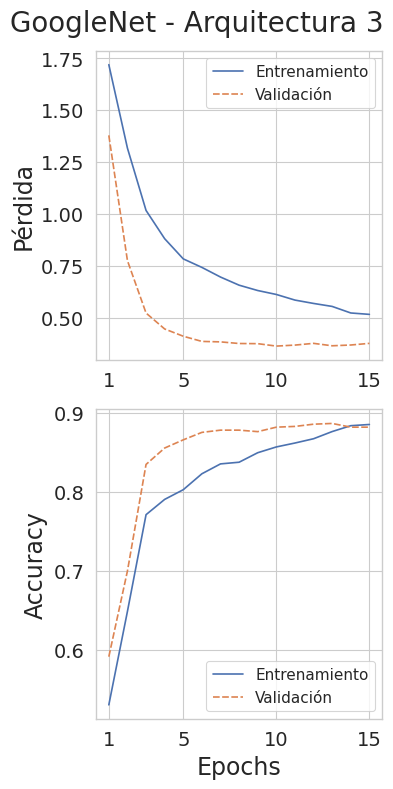

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="GoogleNet - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

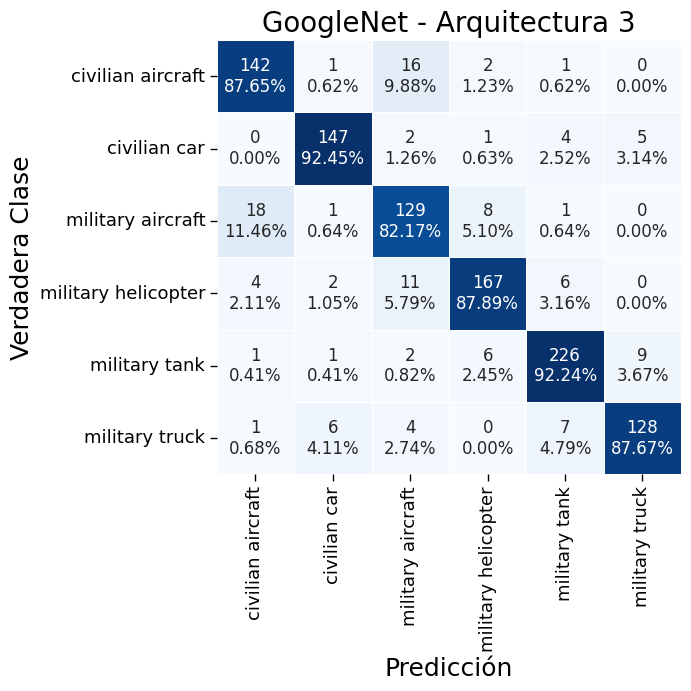

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/googlenet_3relu.pth", weights_only=False)
model_googlenet_best, _, _ = get_model_googlenet(6, arch=3)
model_googlenet_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_googlenet_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "GoogleNet - Arquitectura 3")

#### Arquitectura 4

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_googlenet, loss_fn, optimizer = get_model_googlenet(6, arch=4)
summary(model_googlenet, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
GoogLeNet                                [1, 6]                    --
├─BasicConv2d: 1-1                       [1, 64, 112, 112]         --
│    └─Conv2d: 2-1                       [1, 64, 112, 112]         (9,408)
│    └─BatchNorm2d: 2-2                  [1, 64, 112, 112]         (128)
├─MaxPool2d: 1-2                         [1, 64, 56, 56]           --
├─BasicConv2d: 1-3                       [1, 64, 56, 56]           --
│    └─Conv2d: 2-3                       [1, 64, 56, 56]           (4,096)
│    └─BatchNorm2d: 2-4                  [1, 64, 56, 56]           (128)
├─BasicConv2d: 1-4                       [1, 192, 56, 56]          --
│    └─Conv2d: 2-5                       [1, 192, 56, 56]          (110,592)
│    └─BatchNorm2d: 2-6                  [1, 192, 56, 56]          (384)
├─MaxPool2d: 1-5                         [1, 192, 28, 28]          --
├─Inception: 1-6                         [1, 256, 28, 28]  

Vemos que, de los 25,595,398 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 19,995,494. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_googlenet, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 21/04/25 13:00:11


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 1 - Ended: 21/04/25 13:02:16 - Duration: 124.2s

Training Loss: 1.5754496108240157 - Validation Loss: 0.9427422635695514
Training Accuracy: 0.6768595041322314 - Validation Accuracy: 0.7677053824362606

Epoch: 2 - Started: 21/04/25 13:02:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 2 - Ended: 21/04/25 13:04:19 - Duration: 123.92s

Training Loss: 1.0929819389955322 - Validation Loss: 0.5747112193528343
Training Accuracy: 0.7384887839433294 - Validation Accuracy: 0.8092540132200189

Epoch: 3 - Started: 21/04/25 13:04:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Epoch: 3 - Ended: 21/04/25 13:06:24 - Duration: 124.13s

Training Loss: 0.8913608317944541 - Validation Loss: 0.49673986084320965
Training Accuracy: 0.7760330578512397 - Validation Accuracy: 0.8375826251180358

Epoch: 4 - Started: 21/04/25 13:06:24


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 4 - Ended: 21/04/25 13:08:27 - Duration: 123.91s

Training Loss: 0.8049392691299097 - Validation Loss: 0.40762122501345244
Training Accuracy: 0.8203069657615112 - Validation Accuracy: 0.8725212464589235

Epoch: 5 - Started: 21/04/25 13:08:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 5 - Ended: 21/04/25 13:10:32 - Duration: 124.11s

Training Loss: 0.703192643265226 - Validation Loss: 0.3947625510832843
Training Accuracy: 0.8299881936245572 - Validation Accuracy: 0.8725212464589235

Epoch: 6 - Started: 21/04/25 13:10:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 6 - Ended: 21/04/25 13:12:35 - Duration: 123.9s

Training Loss: 0.652669343485761 - Validation Loss: 0.36904897891423283
Training Accuracy: 0.8558441558441559 - Validation Accuracy: 0.8857412653446648

Epoch: 7 - Started: 21/04/25 13:12:35


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 7 - Ended: 21/04/25 13:14:39 - Duration: 123.83s

Training Loss: 0.6174335123887703 - Validation Loss: 0.3770158689688234
Training Accuracy: 0.869185360094451 - Validation Accuracy: 0.8857412653446648

Epoch: 8 - Started: 21/04/25 13:14:39


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 8 - Ended: 21/04/25 13:16:43 - Duration: 123.97s

Training Loss: 0.5655917013759044 - Validation Loss: 0.3569139656336868
Training Accuracy: 0.874025974025974 - Validation Accuracy: 0.8942398489140698

Epoch: 9 - Started: 21/04/25 13:16:43


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 9 - Ended: 21/04/25 13:18:47 - Duration: 123.47s

Training Loss: 0.5450968511068999 - Validation Loss: 0.36930613658007455
Training Accuracy: 0.8780401416765053 - Validation Accuracy: 0.8895184135977338

Epoch: 10 - Started: 21/04/25 13:18:47


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 10 - Ended: 21/04/25 13:20:51 - Duration: 124.29s

Training Loss: 0.5136290432801888 - Validation Loss: 0.3436603445340605
Training Accuracy: 0.8991735537190083 - Validation Accuracy: 0.898961284230406

Epoch: 11 - Started: 21/04/25 13:20:51


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 11 - Ended: 21/04/25 13:22:55 - Duration: 124.22s

Training Loss: 0.48849605624355485 - Validation Loss: 0.34852758356753516
Training Accuracy: 0.9 - Validation Accuracy: 0.8999055712936733

Epoch: 12 - Started: 21/04/25 13:22:55


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 12 - Ended: 21/04/25 13:24:59 - Duration: 124.01s

Training Loss: 0.4575651890751141 - Validation Loss: 0.3690009134657243
Training Accuracy: 0.9083825265643447 - Validation Accuracy: 0.8923512747875354

Epoch: 13 - Started: 21/04/25 13:24:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 13 - Ended: 21/04/25 13:27:04 - Duration: 124.29s

Training Loss: 0.4316168414123023 - Validation Loss: 0.359298231847146
Training Accuracy: 0.90814639905549 - Validation Accuracy: 0.898961284230406

Epoch: 14 - Started: 21/04/25 13:27:04


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 14 - Ended: 21/04/25 13:29:07 - Duration: 123.91s

Training Loss: 0.405203189867646 - Validation Loss: 0.35676012494984793
Training Accuracy: 0.9361275088547816 - Validation Accuracy: 0.902738432483475

Epoch: 15 - Started: 21/04/25 13:29:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]

Epoch: 15 - Ended: 21/04/25 13:31:12 - Duration: 124.13s

Training Loss: 0.376715645416459 - Validation Loss: 0.37271535725278016
Training Accuracy: 0.941676505312869 - Validation Accuracy: 0.8914069877242682



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_googlenet.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/googlenet_4relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/googlenet_4relu.pth", weights_only=False)

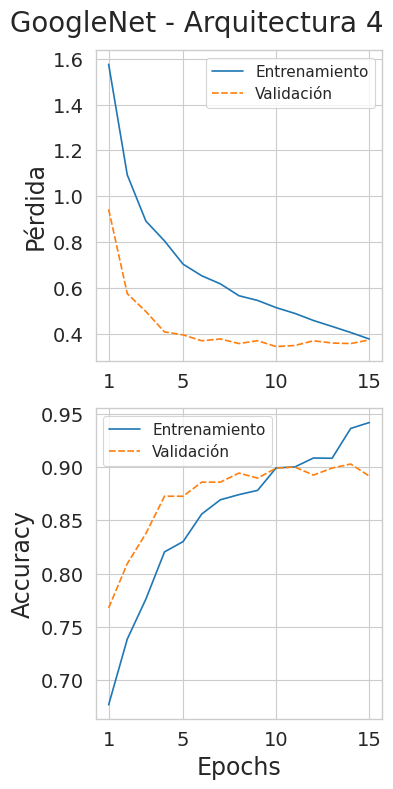

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="GoogleNet - Arquitectura 4")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


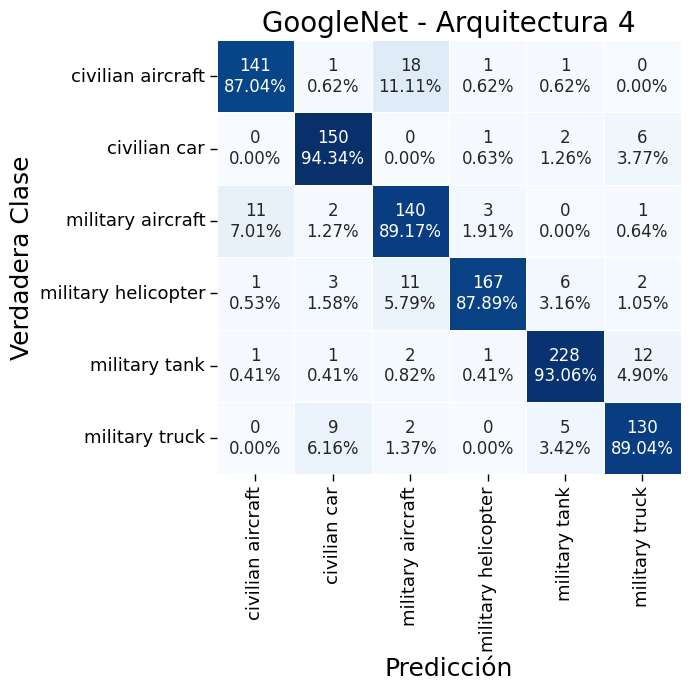

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/googlenet_4relu.pth", weights_only=False)
model_googlenet_best, _, _ = get_model_googlenet(6, arch=4)
model_googlenet_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_googlenet_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "GoogleNet - Arquitectura 4")

###  ResNet50

#### Modelo

Vamos a aplicar transfer-learning al modelo ResNet152 pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
summary(model_resnet50, input_size=(1,3, 224, 224))

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 194MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 1000]                 --
├─Conv2d: 1-1                            [1, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         128
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 256, 56, 56]          --
│    └─Bottleneck: 2-1                   [1, 256, 56, 56]          --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           4,096
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]           --
│ 

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos un poco:

In [ ]:
def get_model_resnet50(num_classes, arch=3):
    """
    Nos permite obtener un modelo ResNet50 con una determinada configuración
    listo para entrenar, su optimizador (Adam) y la funcion de pérdida de
    entropía cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.parameters():
        param.requires_grad = False

    # Seleccionamos la configuracion
    if arch == 3:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        model.fc = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )
    elif arch == 4:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(2, 2))
        model.fc = nn.Sequential(
            nn.Linear(8192, 2048),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )
    else:
        raise Exception("Invalid architecture")

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet50, loss_fn, optimizer = get_model_resnet50(6, arch=3)
summary(model_resnet50, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 256, 56, 56]          --
│    └─Bottleneck: 2-1                   [1, 256, 56, 56]          --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (4,096)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]    

Vemos que, de los 26,200,998 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 2,692,966. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet50, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 01:31:51


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch: 1 - Ended: 20/04/25 01:34:00 - Duration: 129.13s

Training Loss: 1.7290452078207215 - Validation Loss: 1.4574419400271248
Training Accuracy: 0.4171192443919717 - Validation Accuracy: 0.437204910292729

Epoch: 2 - Started: 20/04/25 01:34:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.17it/s]


Epoch: 2 - Ended: 20/04/25 01:36:08 - Duration: 128.52s

Training Loss: 1.3725208755749374 - Validation Loss: 0.8627970814704895
Training Accuracy: 0.6375442739079102 - Validation Accuracy: 0.7119924457034938

Epoch: 3 - Started: 20/04/25 01:36:08


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Epoch: 3 - Ended: 20/04/25 01:38:17 - Duration: 129.18s

Training Loss: 1.0742291612411612 - Validation Loss: 0.6365261551211862
Training Accuracy: 0.7046044864226683 - Validation Accuracy: 0.7941454202077431

Epoch: 4 - Started: 20/04/25 01:38:17


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 4 - Ended: 20/04/25 01:40:26 - Duration: 129.0s

Training Loss: 0.9447124609306677 - Validation Loss: 0.5419804576565238
Training Accuracy: 0.7347107438016529 - Validation Accuracy: 0.8319169027384324

Epoch: 5 - Started: 20/04/25 01:40:26


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.17it/s]


Epoch: 5 - Ended: 20/04/25 01:42:35 - Duration: 128.98s

Training Loss: 0.8863195607911295 - Validation Loss: 0.5267655630322063
Training Accuracy: 0.735655253837072 - Validation Accuracy: 0.8186968838526912

Epoch: 6 - Started: 20/04/25 01:42:35


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.17it/s]


Epoch: 6 - Ended: 20/04/25 01:44:45 - Duration: 129.29s

Training Loss: 0.8285813731933708 - Validation Loss: 0.4754181732149685
Training Accuracy: 0.7479338842975206 - Validation Accuracy: 0.8328611898016998

Epoch: 7 - Started: 20/04/25 01:44:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 7 - Ended: 20/04/25 01:46:53 - Duration: 128.73s

Training Loss: 0.7957035899162292 - Validation Loss: 0.45004477658692527
Training Accuracy: 0.7774498229043684 - Validation Accuracy: 0.8611898016997167

Epoch: 8 - Started: 20/04/25 01:46:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 8 - Ended: 20/04/25 01:49:02 - Duration: 128.99s

Training Loss: 0.7600445791856566 - Validation Loss: 0.43436838861773996
Training Accuracy: 0.7832349468713105 - Validation Accuracy: 0.8668555240793201

Epoch: 9 - Started: 20/04/25 01:49:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.17it/s]


Epoch: 9 - Ended: 20/04/25 01:51:12 - Duration: 129.15s

Training Loss: 0.7287643222666499 - Validation Loss: 0.427643564694068
Training Accuracy: 0.7832349468713105 - Validation Accuracy: 0.8536355051935789

Epoch: 10 - Started: 20/04/25 01:51:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Epoch: 10 - Ended: 20/04/25 01:53:20 - Duration: 128.9s

Training Loss: 0.7205004941171674 - Validation Loss: 0.40246523960548286
Training Accuracy: 0.7948051948051948 - Validation Accuracy: 0.8772426817752597

Epoch: 11 - Started: 20/04/25 01:53:20


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch: 11 - Ended: 20/04/25 01:55:30 - Duration: 129.59s

Training Loss: 0.7023601309577031 - Validation Loss: 0.38928260128287706
Training Accuracy: 0.8053128689492326 - Validation Accuracy: 0.8791312559017942

Epoch: 12 - Started: 20/04/25 01:55:30


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.16it/s]


Epoch: 12 - Ended: 20/04/25 01:57:39 - Duration: 129.12s

Training Loss: 0.6801461101467929 - Validation Loss: 0.3756205448332955
Training Accuracy: 0.8079102715466352 - Validation Accuracy: 0.890462700661001

Epoch: 13 - Started: 20/04/25 01:57:39


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.17it/s]


Epoch: 13 - Ended: 20/04/25 01:59:48 - Duration: 128.83s

Training Loss: 0.6607525606653584 - Validation Loss: 0.37039095996057286
Training Accuracy: 0.8177095631641086 - Validation Accuracy: 0.8885741265344664

Epoch: 14 - Started: 20/04/25 01:59:48


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 14 - Ended: 20/04/25 02:01:57 - Duration: 128.93s

Training Loss: 0.6426533451720849 - Validation Loss: 0.37067022897741375
Training Accuracy: 0.8195985832349468 - Validation Accuracy: 0.8810198300283286

Epoch: 15 - Started: 20/04/25 02:01:57


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.17it/s]

Epoch: 15 - Ended: 20/04/25 02:04:06 - Duration: 129.01s

Training Loss: 0.6378022507945104 - Validation Loss: 0.35988227957311797
Training Accuracy: 0.8240850059031877 - Validation Accuracy: 0.8895184135977338



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_resnet50.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/resnet50_3relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet50_3relu.pth", weights_only=False)

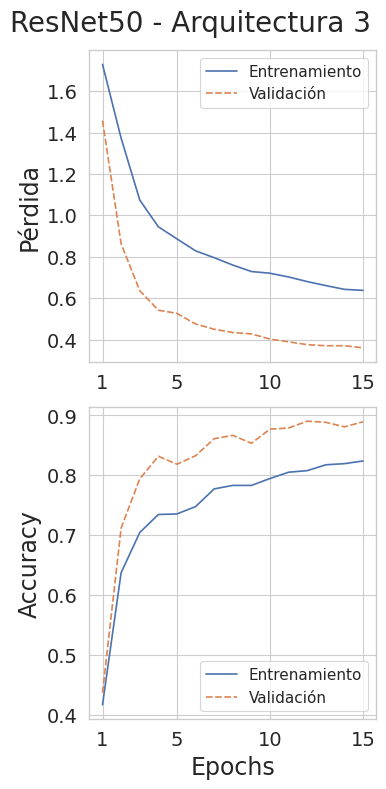

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet50 - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 204MB/s]


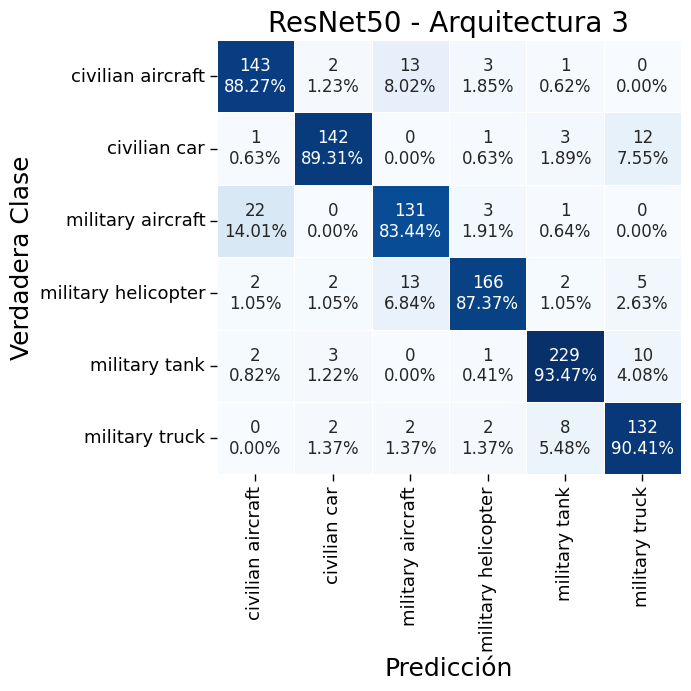

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet50_3relu.pth", weights_only=False)
model_resnet50_best, _, _ = get_model_resnet50(6, arch=3)
model_resnet50_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet50_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "ResNet50 - Arquitectura 3")

#### Arquitectura 4

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_resnet50, loss_fn, optimizer = get_model_resnet50(6, arch=4)
summary(model_resnet50, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 6]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 256, 56, 56]          --
│    └─Bottleneck: 2-1                   [1, 256, 56, 56]          --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (4,096)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]    

Vemos que, de los 41,406,374 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 17,898,342. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_resnet50, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 02:04:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Epoch: 1 - Ended: 20/04/25 02:06:16 - Duration: 128.92s

Training Loss: 1.5877533386002725 - Validation Loss: 0.9749515687718111
Training Accuracy: 0.6101534828807557 - Validation Accuracy: 0.6770538243626062

Epoch: 2 - Started: 20/04/25 02:06:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 2 - Ended: 20/04/25 02:08:25 - Duration: 128.71s

Training Loss: 1.093460771574903 - Validation Loss: 0.5646701420054716
Training Accuracy: 0.7193624557260921 - Validation Accuracy: 0.7695939565627951

Epoch: 3 - Started: 20/04/25 02:08:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Epoch: 3 - Ended: 20/04/25 02:10:34 - Duration: 129.18s

Training Loss: 0.8767197745949474 - Validation Loss: 0.4490921501727665
Training Accuracy: 0.7782762691853601 - Validation Accuracy: 0.8366383380547686

Epoch: 4 - Started: 20/04/25 02:10:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 4 - Ended: 20/04/25 02:12:44 - Duration: 129.65s

Training Loss: 0.7963891687677868 - Validation Loss: 0.3850676570745075
Training Accuracy: 0.8193624557260921 - Validation Accuracy: 0.8772426817752597

Epoch: 5 - Started: 20/04/25 02:12:44


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 5 - Ended: 20/04/25 02:14:53 - Duration: 129.0s

Training Loss: 0.7020463133925823 - Validation Loss: 0.36862528499434977
Training Accuracy: 0.8216056670602125 - Validation Accuracy: 0.8932955618508026

Epoch: 6 - Started: 20/04/25 02:14:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Epoch: 6 - Ended: 20/04/25 02:17:02 - Duration: 129.01s

Training Loss: 0.6640474262522228 - Validation Loss: 0.3557359300115529
Training Accuracy: 0.8322314049586776 - Validation Accuracy: 0.8951841359773371

Epoch: 7 - Started: 20/04/25 02:17:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


Epoch: 7 - Ended: 20/04/25 02:19:10 - Duration: 128.91s

Training Loss: 0.61470276784541 - Validation Loss: 0.3204409605001702
Training Accuracy: 0.8517119244391972 - Validation Accuracy: 0.898961284230406

Epoch: 8 - Started: 20/04/25 02:19:10


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.16it/s]


Epoch: 8 - Ended: 20/04/25 02:21:20 - Duration: 129.16s

Training Loss: 0.5906139020599536 - Validation Loss: 0.33600129581549587
Training Accuracy: 0.8582054309327036 - Validation Accuracy: 0.8942398489140698

Epoch: 9 - Started: 20/04/25 02:21:20


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Epoch: 9 - Ended: 20/04/25 02:23:29 - Duration: 129.52s

Training Loss: 0.5621032946145357 - Validation Loss: 0.30897094572291656
Training Accuracy: 0.8721369539551358 - Validation Accuracy: 0.9074598677998111

Epoch: 10 - Started: 20/04/25 02:23:29


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 10 - Ended: 20/04/25 02:25:38 - Duration: 129.14s

Training Loss: 0.5373588115421694 - Validation Loss: 0.3326074783416355
Training Accuracy: 0.8711924439197166 - Validation Accuracy: 0.898961284230406

Epoch: 11 - Started: 20/04/25 02:25:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.16it/s]


Epoch: 11 - Ended: 20/04/25 02:27:48 - Duration: 129.67s

Training Loss: 0.5271769779831615 - Validation Loss: 0.31051781762610464
Training Accuracy: 0.8757969303423849 - Validation Accuracy: 0.9008498583569405

Epoch: 12 - Started: 20/04/25 02:27:48


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.20it/s]


Epoch: 12 - Ended: 20/04/25 02:29:58 - Duration: 129.53s

Training Loss: 0.5182375863416872 - Validation Loss: 0.3272799858275582
Training Accuracy: 0.8889020070838253 - Validation Accuracy: 0.8980169971671388

Epoch: 13 - Started: 20/04/25 02:29:58


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 13 - Ended: 20/04/25 02:32:07 - Duration: 129.53s

Training Loss: 0.4711141653025328 - Validation Loss: 0.33885931552332993
Training Accuracy: 0.8819362455726092 - Validation Accuracy: 0.8970727101038716

Epoch: 14 - Started: 20/04/25 02:32:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.19it/s]


Epoch: 14 - Ended: 20/04/25 02:34:16 - Duration: 128.9s

Training Loss: 0.46374963157212556 - Validation Loss: 0.34554362494279356
Training Accuracy: 0.8990554899645808 - Validation Accuracy: 0.8999055712936733

Epoch: 15 - Started: 20/04/25 02:34:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]

Epoch: 15 - Ended: 20/04/25 02:36:26 - Duration: 129.58s

Training Loss: 0.4389938543091959 - Validation Loss: 0.34746552006725
Training Accuracy: 0.877331759149941 - Validation Accuracy: 0.8932955618508026



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_resnet50.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/resnet50_4relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet50_4relu.pth", weights_only=False)

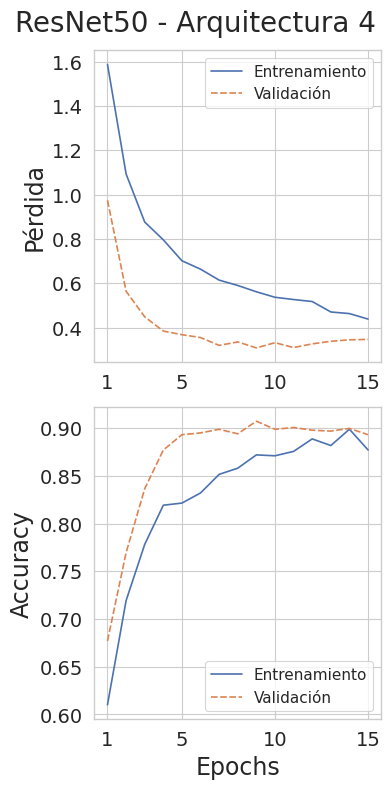

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ResNet50 - Arquitectura 4")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


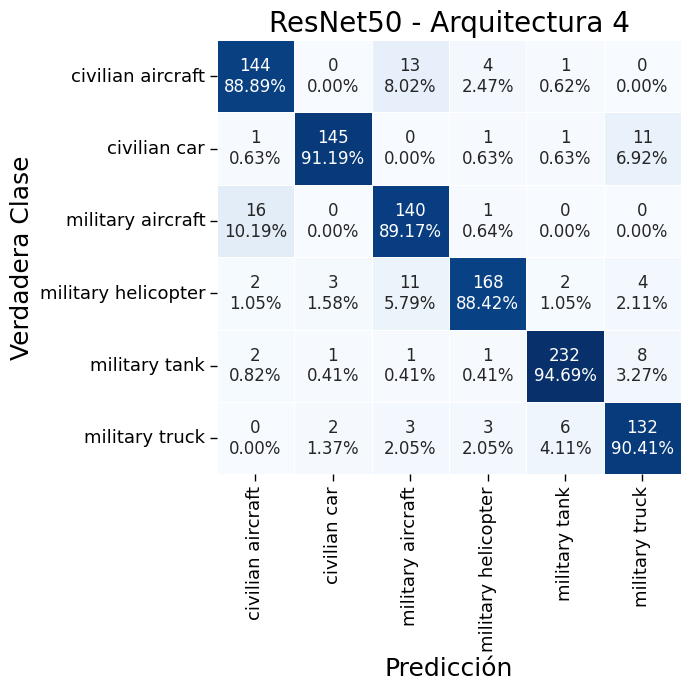

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/resnet50_4relu.pth", weights_only=False)
model_resnet50_best, _, _ = get_model_resnet50(6, arch=4)
model_resnet50_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_resnet50_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "ResNet50 - Arquitectura 4")

### DenseNet201

#### Modelo

Vamos a aplicar transfer-learning al modelo DenseNet201 pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_densenet201 = models.densenet201(weights=models.DenseNet201_Weights.DEFAULT)
summary(model_densenet201, input_size=(1, 3, 224, 224))

Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth
100%|██████████| 77.4M/77.4M [00:00<00:00, 182MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
DenseNet                                 [1, 1000]                 --
├─Sequential: 1-1                        [1, 1920, 7, 7]           --
│    └─Conv2d: 2-1                       [1, 64, 112, 112]         9,408
│    └─BatchNorm2d: 2-2                  [1, 64, 112, 112]         128
│    └─ReLU: 2-3                         [1, 64, 112, 112]         --
│    └─MaxPool2d: 2-4                    [1, 64, 56, 56]           --
│    └─_DenseBlock: 2-5                  [1, 256, 56, 56]          --
│    │    └─_DenseLayer: 3-1             [1, 32, 56, 56]           45,440
│    │    └─_DenseLayer: 3-2             [1, 32, 56, 56]           49,600
│    │    └─_DenseLayer: 3-3             [1, 32, 56, 56]           53,760
│    │    └─_DenseLayer: 3-4             [1, 32, 56, 56]           57,920
│    │    └─_DenseLayer: 3-5             [1, 32, 56, 56]           62,080
│    │    └─_DenseLayer: 3-6             [1, 32, 56, 56]     

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos un poco:

In [ ]:
def get_model_densenet201(num_classes):
    """
    Nos permite obtener un modelo DenseNet201 con una determinada configuración
    listo para entrenar, su optimizador (Adam) y la funcion de pérdida de
    entropía cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.densenet201(weights=models.DenseNet201_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.parameters():
        param.requires_grad = False

    # Solo podemos usar la tercera arquitectura
    model.classifier = nn.Sequential(
            nn.Linear(1920, 1024),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_densenet201, loss_fn, optimizer = get_model_densenet201(6)
summary(model_densenet201, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
DenseNet                                 [1, 6]                    --
├─Sequential: 1-1                        [1, 1920, 7, 7]           --
│    └─Conv2d: 2-1                       [1, 64, 112, 112]         (9,408)
│    └─BatchNorm2d: 2-2                  [1, 64, 112, 112]         (128)
│    └─ReLU: 2-3                         [1, 64, 112, 112]         --
│    └─MaxPool2d: 2-4                    [1, 64, 56, 56]           --
│    └─_DenseBlock: 2-5                  [1, 256, 56, 56]          --
│    │    └─_DenseLayer: 3-1             [1, 32, 56, 56]           (45,440)
│    │    └─_DenseLayer: 3-2             [1, 32, 56, 56]           (49,600)
│    │    └─_DenseLayer: 3-3             [1, 32, 56, 56]           (53,760)
│    │    └─_DenseLayer: 3-4             [1, 32, 56, 56]           (57,920)
│    │    └─_DenseLayer: 3-5             [1, 32, 56, 56]           (62,080)
│    │    └─_DenseLayer: 3-6             [1, 32

Vemos que, de los 20,654,822 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 2,561,894. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_densenet201, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 02:36:29


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.92it/s]


Epoch: 1 - Ended: 20/04/25 02:38:46 - Duration: 136.82s

Training Loss: 1.7424284504420722 - Validation Loss: 1.510378360748291
Training Accuracy: 0.4579693034238489 - Validation Accuracy: 0.4948064211520302

Epoch: 2 - Started: 20/04/25 02:38:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]


Epoch: 2 - Ended: 20/04/25 02:41:02 - Duration: 135.91s

Training Loss: 1.389348880568547 - Validation Loss: 0.8689441190046423
Training Accuracy: 0.649232585596222 - Validation Accuracy: 0.7025495750708215

Epoch: 3 - Started: 20/04/25 02:41:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.98it/s]


Epoch: 3 - Ended: 20/04/25 02:43:18 - Duration: 135.77s

Training Loss: 1.0559695594346346 - Validation Loss: 0.5774633218260372
Training Accuracy: 0.7600944510035419 - Validation Accuracy: 0.8234183191690274

Epoch: 4 - Started: 20/04/25 02:43:18


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 4 - Ended: 20/04/25 02:45:33 - Duration: 135.8s

Training Loss: 0.8906476622197166 - Validation Loss: 0.47884834864560294
Training Accuracy: 0.7900826446280992 - Validation Accuracy: 0.8677998111425873

Epoch: 5 - Started: 20/04/25 02:45:33


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 5 - Ended: 20/04/25 02:47:49 - Duration: 135.75s

Training Loss: 0.8071644243909352 - Validation Loss: 0.4492083928164314
Training Accuracy: 0.7900826446280992 - Validation Accuracy: 0.8536355051935789

Epoch: 6 - Started: 20/04/25 02:47:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.98it/s]


Epoch: 6 - Ended: 20/04/25 02:50:05 - Duration: 136.16s

Training Loss: 0.7542390939015061 - Validation Loss: 0.41028712514568777
Training Accuracy: 0.8093270365997639 - Validation Accuracy: 0.8715769593956563

Epoch: 7 - Started: 20/04/25 02:50:05


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]


Epoch: 7 - Ended: 20/04/25 02:52:22 - Duration: 136.31s

Training Loss: 0.6943248892897991 - Validation Loss: 0.3905562732149573
Training Accuracy: 0.8200708382526565 - Validation Accuracy: 0.8847969782813976

Epoch: 8 - Started: 20/04/25 02:52:22


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]


Epoch: 8 - Ended: 20/04/25 02:54:38 - Duration: 136.23s

Training Loss: 0.6869856839749351 - Validation Loss: 0.3782937403987436
Training Accuracy: 0.8257378984651712 - Validation Accuracy: 0.886685552407932

Epoch: 9 - Started: 20/04/25 02:54:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]


Epoch: 9 - Ended: 20/04/25 02:56:54 - Duration: 136.09s

Training Loss: 0.6529985061332361 - Validation Loss: 0.3616978035253637
Training Accuracy: 0.8355371900826446 - Validation Accuracy: 0.890462700661001

Epoch: 10 - Started: 20/04/25 02:56:54


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 10 - Ended: 20/04/25 02:59:10 - Duration: 136.27s

Training Loss: 0.6251851965242358 - Validation Loss: 0.3550482541322708
Training Accuracy: 0.8440377804014167 - Validation Accuracy: 0.8923512747875354

Epoch: 11 - Started: 20/04/25 02:59:10


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 11 - Ended: 20/04/25 03:01:26 - Duration: 136.05s

Training Loss: 0.5823141776803714 - Validation Loss: 0.33947548752321915
Training Accuracy: 0.8557260920897285 - Validation Accuracy: 0.8951841359773371

Epoch: 12 - Started: 20/04/25 03:01:26


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]


Epoch: 12 - Ended: 20/04/25 03:03:43 - Duration: 136.41s

Training Loss: 0.5706578719971785 - Validation Loss: 0.3376617536825292
Training Accuracy: 0.8628099173553719 - Validation Accuracy: 0.9017941454202077

Epoch: 13 - Started: 20/04/25 03:03:43


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]


Epoch: 13 - Ended: 20/04/25 03:05:59 - Duration: 136.4s

Training Loss: 0.5544500697904559 - Validation Loss: 0.3448228112914983
Training Accuracy: 0.8597402597402597 - Validation Accuracy: 0.9046270066100094

Epoch: 14 - Started: 20/04/25 03:05:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.98it/s]


Epoch: 14 - Ended: 20/04/25 03:08:15 - Duration: 135.79s

Training Loss: 0.5277711081860671 - Validation Loss: 0.3403896080220447
Training Accuracy: 0.8688311688311688 - Validation Accuracy: 0.9074598677998111

Epoch: 15 - Started: 20/04/25 03:08:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]

Epoch: 15 - Ended: 20/04/25 03:10:31 - Duration: 136.12s

Training Loss: 0.5076117284262358 - Validation Loss: 0.34621764631832347
Training Accuracy: 0.8750885478158206 - Validation Accuracy: 0.9055712936732767



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_densenet201.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/densenet201_3relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/densenet201_3relu.pth", weights_only=False)

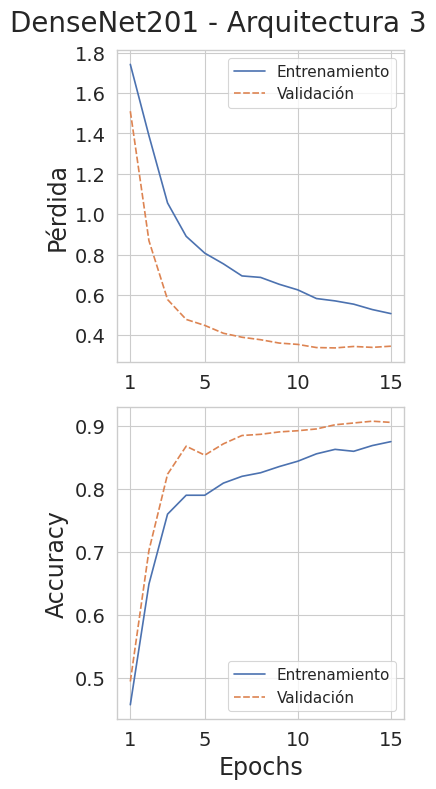

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="DenseNet201 - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth
100%|██████████| 77.4M/77.4M [00:00<00:00, 197MB/s]


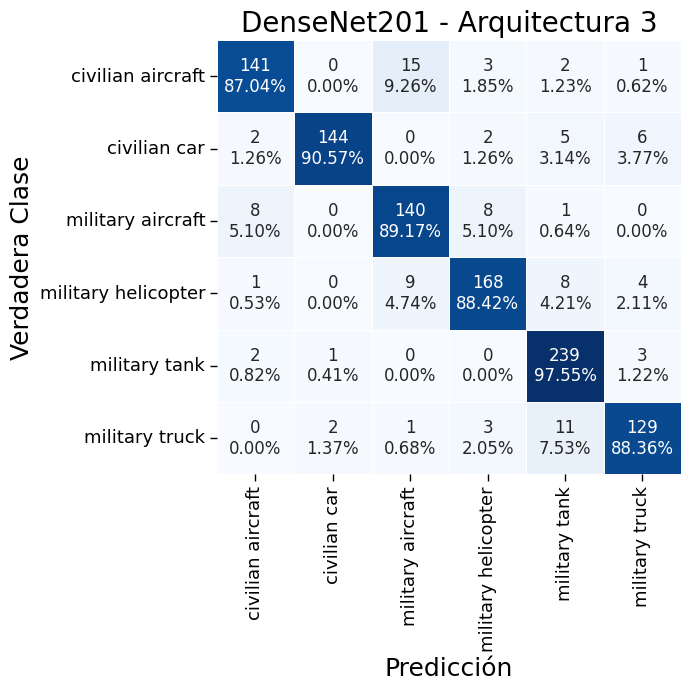

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/densenet201_3relu.pth", weights_only=False)
model_densenet201_best, _, _ = get_model_densenet201(6)
model_densenet201_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_densenet201_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "DenseNet201 - Arquitectura 3")

### ShuffleNetV2 2.0x



#### Modelo

Vamos a aplicar transfer-learning al modelo ShuffleNetV2 2.0x pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_shufflenetv2x2 = models.shufflenet_v2_x2_0(weights=models.ShuffleNet_V2_X2_0_Weights.DEFAULT)
summary(model_shufflenetv2x2, input_size=(1,3, 224, 224))

Downloading: "https://download.pytorch.org/models/shufflenetv2_x2_0-8be3c8ee.pth" to /root/.cache/torch/hub/checkpoints/shufflenetv2_x2_0-8be3c8ee.pth
100%|██████████| 28.4M/28.4M [00:00<00:00, 139MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
ShuffleNetV2                             [1, 1000]                 --
├─Sequential: 1-1                        [1, 24, 112, 112]         --
│    └─Conv2d: 2-1                       [1, 24, 112, 112]         648
│    └─BatchNorm2d: 2-2                  [1, 24, 112, 112]         48
│    └─ReLU: 2-3                         [1, 24, 112, 112]         --
├─MaxPool2d: 1-2                         [1, 24, 56, 56]           --
├─Sequential: 1-3                        [1, 244, 28, 28]          --
│    └─InvertedResidual: 2-4             [1, 244, 28, 28]          --
│    │    └─Sequential: 3-1              [1, 122, 28, 28]          3,436
│    │    └─Sequential: 3-2              [1, 122, 28, 28]          19,642
│    └─InvertedResidual: 2-5             [1, 244, 28, 28]          --
│    │    └─Sequential: 3-3              [1, 122, 28, 28]          31,598
│    └─InvertedResidual: 2-6             [1, 244, 28, 28]          --
│  

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos un poco:

In [ ]:
def get_model_shufflenetv2x2(num_classes):
    """
    Nos permite obtener un modelo ShuffleNetV2 x2.0 con una determinada
    configuración listo para entrenar, su optimizador (Adam) y la funcion de
    pérdida de entropía cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.shufflenet_v2_x2_0(weights=models.ShuffleNet_V2_X2_0_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.parameters():
        param.requires_grad = False

    # Solo podemos usar la tercera arquitectura
    model.fc = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_shufflenetv2x2, loss_fn, optimizer = get_model_shufflenetv2x2(6)
summary(model_shufflenetv2x2, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ShuffleNetV2                             [1, 6]                    --
├─Sequential: 1-1                        [1, 24, 112, 112]         --
│    └─Conv2d: 2-1                       [1, 24, 112, 112]         (648)
│    └─BatchNorm2d: 2-2                  [1, 24, 112, 112]         (48)
│    └─ReLU: 2-3                         [1, 24, 112, 112]         --
├─MaxPool2d: 1-2                         [1, 24, 56, 56]           --
├─Sequential: 1-3                        [1, 244, 28, 28]          --
│    └─InvertedResidual: 2-4             [1, 244, 28, 28]          --
│    │    └─Sequential: 3-1              [1, 122, 28, 28]          (3,436)
│    │    └─Sequential: 3-2              [1, 122, 28, 28]          (19,642)
│    └─InvertedResidual: 2-5             [1, 244, 28, 28]          --
│    │    └─Sequential: 3-3              [1, 122, 28, 28]          (31,598)
│    └─InvertedResidual: 2-6             [1, 244, 28, 28]      

Vemos que, de los 8,037,962 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 2,692,966. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_shufflenetv2x2, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 08:46:27


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 1 - Ended: 20/04/25 08:48:32 - Duration: 125.22s

Training Loss: 1.7324253356278831 - Validation Loss: 1.4511126770692713
Training Accuracy: 0.4770956316410862 - Validation Accuracy: 0.5080264400377715

Epoch: 2 - Started: 20/04/25 08:48:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.29it/s]


Epoch: 2 - Ended: 20/04/25 08:50:37 - Duration: 125.34s

Training Loss: 1.3236856718561543 - Validation Loss: 0.8512664717786452
Training Accuracy: 0.6863046044864227 - Validation Accuracy: 0.7582625118035883

Epoch: 3 - Started: 20/04/25 08:50:37


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 3 - Ended: 20/04/25 08:52:43 - Duration: 125.39s

Training Loss: 1.0132267288307646 - Validation Loss: 0.5907256287686965
Training Accuracy: 0.7788665879574971 - Validation Accuracy: 0.8441926345609065

Epoch: 4 - Started: 20/04/25 08:52:43


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 4 - Ended: 20/04/25 08:54:48 - Duration: 124.93s

Training Loss: 0.843079339212446 - Validation Loss: 0.4658941819387324
Training Accuracy: 0.8168831168831169 - Validation Accuracy: 0.874409820585458

Epoch: 5 - Started: 20/04/25 08:54:48


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]


Epoch: 5 - Ended: 20/04/25 08:56:53 - Duration: 125.1s

Training Loss: 0.7351503078617266 - Validation Loss: 0.39963982210439797
Training Accuracy: 0.8374262101534828 - Validation Accuracy: 0.8847969782813976

Epoch: 6 - Started: 20/04/25 08:56:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.25it/s]


Epoch: 6 - Ended: 20/04/25 08:58:58 - Duration: 125.31s

Training Loss: 0.6782817609274565 - Validation Loss: 0.3656076876556172
Training Accuracy: 0.855608028335301 - Validation Accuracy: 0.8885741265344664

Epoch: 7 - Started: 20/04/25 08:58:58


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 7 - Ended: 20/04/25 09:01:03 - Duration: 124.51s

Training Loss: 0.6171388328075409 - Validation Loss: 0.3432660120375016
Training Accuracy: 0.8626918536009445 - Validation Accuracy: 0.8961284230406044

Epoch: 8 - Started: 20/04/25 09:01:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 8 - Ended: 20/04/25 09:03:07 - Duration: 124.3s

Training Loss: 0.5814385503085692 - Validation Loss: 0.32983288256561055
Training Accuracy: 0.8731995277449823 - Validation Accuracy: 0.898961284230406

Epoch: 9 - Started: 20/04/25 09:03:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


Epoch: 9 - Ended: 20/04/25 09:05:11 - Duration: 124.29s

Training Loss: 0.5455630835312516 - Validation Loss: 0.3203083833350855
Training Accuracy: 0.8861865407319953 - Validation Accuracy: 0.8999055712936733

Epoch: 10 - Started: 20/04/25 09:05:11


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 10 - Ended: 20/04/25 09:07:16 - Duration: 124.49s

Training Loss: 0.5260765267841852 - Validation Loss: 0.3171059616348323
Training Accuracy: 0.89185360094451 - Validation Accuracy: 0.9017941454202077

Epoch: 11 - Started: 20/04/25 09:07:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


Epoch: 11 - Ended: 20/04/25 09:09:20 - Duration: 124.07s

Training Loss: 0.4799716134569538 - Validation Loss: 0.3224690622266601
Training Accuracy: 0.8938606847697756 - Validation Accuracy: 0.9084041548630784

Epoch: 12 - Started: 20/04/25 09:09:20


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


Epoch: 12 - Ended: 20/04/25 09:11:24 - Duration: 124.24s

Training Loss: 0.4685270261408678 - Validation Loss: 0.32352380016270804
Training Accuracy: 0.90814639905549 - Validation Accuracy: 0.9017941454202077

Epoch: 13 - Started: 20/04/25 09:11:24


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 13 - Ended: 20/04/25 09:13:28 - Duration: 124.36s

Training Loss: 0.43701467496245655 - Validation Loss: 0.31775569565155926
Training Accuracy: 0.9153482880755608 - Validation Accuracy: 0.8999055712936733

Epoch: 14 - Started: 20/04/25 09:13:28


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.35it/s]


Epoch: 14 - Ended: 20/04/25 09:15:33 - Duration: 124.57s

Training Loss: 0.4010365687644304 - Validation Loss: 0.3106326741330764
Training Accuracy: 0.9271546635182999 - Validation Accuracy: 0.9102927289896129

Epoch: 15 - Started: 20/04/25 09:15:33


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.31it/s]

Epoch: 15 - Ended: 20/04/25 09:17:37 - Duration: 124.13s

Training Loss: 0.3907217000847432 - Validation Loss: 0.33567814397461276
Training Accuracy: 0.9283353010625738 - Validation Accuracy: 0.9065155807365439



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_shufflenetv2x2.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/shufflenetv2x2_3relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/shufflenetv2x2_3relu.pth", weights_only=False)

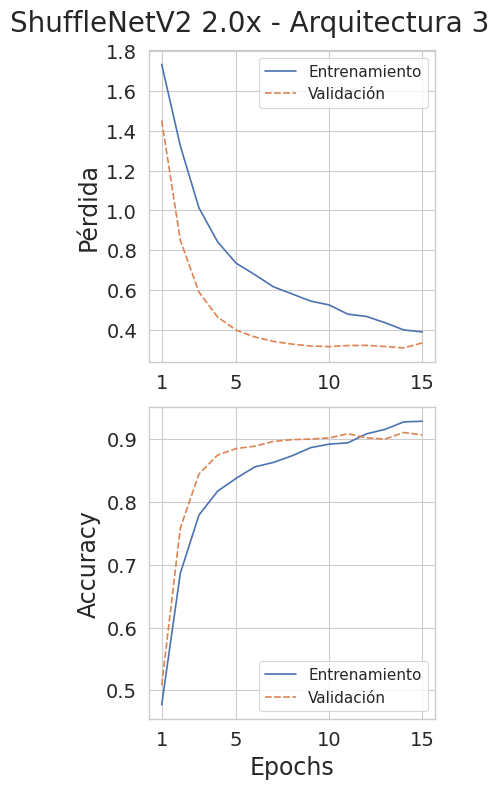

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="ShuffleNetV2 2.0x - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ShuffleNet_V2_X2_0_Weights.IMAGENET1K_V1`. You can also use `weights=ShuffleNet_V2_X2_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/shufflenetv2_x2_0-8be3c8ee.pth" to /root/.cache/torch/hub/checkpoints/shufflenetv2_x2_0-8be3c8ee.pth
100%|██████████| 28.4M/28.4M [00:00<00:00, 157MB/s] 


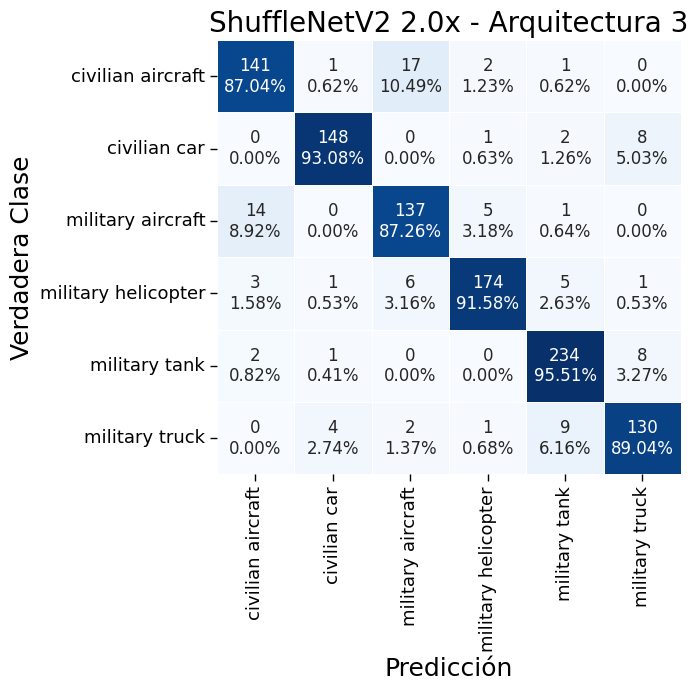

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/shufflenetv2x2_3relu.pth", weights_only=False)
model_shufflenetv2x2_best, _, _ = get_model_shufflenetv2x2(6)
model_shufflenetv2x2_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_shufflenetv2x2_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "ShuffleNetV2 2.0x - Arquitectura 3")

### MobileNetV3

#### Modelo

In [ ]:
model_mobilenetv3 = models.mobilenet_v3_large(weights=models.MobileNet_V3_Large_Weights.DEFAULT)
summary(model_mobilenetv3, input_size=(1,3, 224, 224))

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-5c1a4163.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-5c1a4163.pth
100%|██████████| 21.1M/21.1M [00:00<00:00, 142MB/s] 


Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV3                                        [1, 1000]                 --
├─Sequential: 1-1                                  [1, 960, 7, 7]            --
│    └─Conv2dNormActivation: 2-1                   [1, 16, 112, 112]         --
│    │    └─Conv2d: 3-1                            [1, 16, 112, 112]         432
│    │    └─BatchNorm2d: 3-2                       [1, 16, 112, 112]         32
│    │    └─Hardswish: 3-3                         [1, 16, 112, 112]         --
│    └─InvertedResidual: 2-2                       [1, 16, 112, 112]         --
│    │    └─Sequential: 3-4                        [1, 16, 112, 112]         464
│    └─InvertedResidual: 2-3                       [1, 24, 56, 56]           --
│    │    └─Sequential: 3-5                        [1, 24, 56, 56]           3,440
│    └─InvertedResidual: 2-4                       [1, 24, 56, 56]           --
│    │    └─Sequential: 3-6   

In [ ]:
def get_model_mobilenetv3(num_classes, arch=3):
    """
    Nos permite obtener un modelo MobileNetV3 Large con una determinada
    configuración listo para entrenar, su optimizador (Adam) y la funcion de
    pérdida de entropía cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.mobilenet_v3_large(weights=models.MobileNet_V3_Large_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.parameters():
        param.requires_grad = False

    # Seleccionamos la configuracion
    if arch == 3:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(2, 2))
        model.classifier = nn.Sequential(
                nn.Linear(3840, 1024),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(1024, 512),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(512, 128),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(128, 32),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(32, num_classes)
            )
    elif arch == 4:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(3, 3))
        model.classifier = nn.Sequential(
            nn.Linear(8640, 2048),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_mobilenetv3, loss_fn, optimizer = get_model_mobilenetv3(6, arch=3)
summary(model_mobilenetv3, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV3                                        [1, 6]                    --
├─Sequential: 1-1                                  [1, 960, 7, 7]            --
│    └─Conv2dNormActivation: 2-1                   [1, 16, 112, 112]         --
│    │    └─Conv2d: 3-1                            [1, 16, 112, 112]         (432)
│    │    └─BatchNorm2d: 3-2                       [1, 16, 112, 112]         (32)
│    │    └─Hardswish: 3-3                         [1, 16, 112, 112]         --
│    └─InvertedResidual: 2-2                       [1, 16, 112, 112]         --
│    │    └─Sequential: 3-4                        [1, 16, 112, 112]         (464)
│    └─InvertedResidual: 2-3                       [1, 24, 56, 56]           --
│    │    └─Sequential: 3-5                        [1, 24, 56, 56]           (3,440)
│    └─InvertedResidual: 2-4                       [1, 24, 56, 56]           --
│    │    └─Sequential

Vemos que, de los 7,499,926 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 4,527,974. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_mobilenetv3, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 06:37:56


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.38it/s]


Epoch: 1 - Ended: 20/04/25 06:39:57 - Duration: 121.17s

Training Loss: 1.6904729391211895 - Validation Loss: 1.2290348095052384
Training Accuracy: 0.5407319952774499 - Validation Accuracy: 0.5854579792256847

Epoch: 2 - Started: 20/04/25 06:39:57


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]


Epoch: 2 - Ended: 20/04/25 06:41:59 - Duration: 121.27s

Training Loss: 1.2358526293911152 - Validation Loss: 0.6114937996163088
Training Accuracy: 0.7491145218417946 - Validation Accuracy: 0.8319169027384324

Epoch: 3 - Started: 20/04/25 06:41:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 3 - Ended: 20/04/25 06:43:59 - Duration: 120.58s

Training Loss: 0.9424216720595289 - Validation Loss: 0.46256622146157655
Training Accuracy: 0.8003541912632822 - Validation Accuracy: 0.8640226628895185

Epoch: 4 - Started: 20/04/25 06:43:59


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 4 - Ended: 20/04/25 06:46:01 - Duration: 121.21s

Training Loss: 0.8043180748597899 - Validation Loss: 0.4096662673880072
Training Accuracy: 0.8341204250295159 - Validation Accuracy: 0.8810198300283286

Epoch: 5 - Started: 20/04/25 06:46:01


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 5 - Ended: 20/04/25 06:48:02 - Duration: 120.98s

Training Loss: 0.6976539065588766 - Validation Loss: 0.38276416063308716
Training Accuracy: 0.8527744982290437 - Validation Accuracy: 0.8696883852691218

Epoch: 6 - Started: 20/04/25 06:48:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 6 - Ended: 20/04/25 06:50:03 - Duration: 121.35s

Training Loss: 0.6229360076918531 - Validation Loss: 0.3902990774196737
Training Accuracy: 0.8576151121605667 - Validation Accuracy: 0.874409820585458

Epoch: 7 - Started: 20/04/25 06:50:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 7 - Ended: 20/04/25 06:52:04 - Duration: 120.99s

Training Loss: 0.5807792720065188 - Validation Loss: 0.3851987360154881
Training Accuracy: 0.8746162927981109 - Validation Accuracy: 0.8857412653446648

Epoch: 8 - Started: 20/04/25 06:52:04


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 8 - Ended: 20/04/25 06:54:05 - Duration: 121.1s

Training Loss: 0.5287836629952958 - Validation Loss: 0.3769628949025098
Training Accuracy: 0.8913813459268005 - Validation Accuracy: 0.8810198300283286

Epoch: 9 - Started: 20/04/25 06:54:05


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.43it/s]


Epoch: 9 - Ended: 20/04/25 06:56:06 - Duration: 120.73s

Training Loss: 0.49465365463228367 - Validation Loss: 0.3580722970997586
Training Accuracy: 0.9066115702479339 - Validation Accuracy: 0.890462700661001

Epoch: 10 - Started: 20/04/25 06:56:06


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 10 - Ended: 20/04/25 06:58:06 - Duration: 120.55s

Training Loss: 0.4613500135158425 - Validation Loss: 0.3651419106651755
Training Accuracy: 0.912396694214876 - Validation Accuracy: 0.8951841359773371

Epoch: 11 - Started: 20/04/25 06:58:06


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 11 - Ended: 20/04/25 07:00:07 - Duration: 120.84s

Training Loss: 0.41995893841359155 - Validation Loss: 0.3656029372530825
Training Accuracy: 0.9216056670602125 - Validation Accuracy: 0.8923512747875354

Epoch: 12 - Started: 20/04/25 07:00:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.43it/s]


Epoch: 12 - Ended: 20/04/25 07:02:08 - Duration: 120.75s

Training Loss: 0.40044554022710716 - Validation Loss: 0.3861984733273001
Training Accuracy: 0.9344746162927982 - Validation Accuracy: 0.8923512747875354

Epoch: 13 - Started: 20/04/25 07:02:08


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 13 - Ended: 20/04/25 07:04:09 - Duration: 121.15s

Training Loss: 0.3754169720767149 - Validation Loss: 0.36538483903688546
Training Accuracy: 0.9421487603305785 - Validation Accuracy: 0.898961284230406

Epoch: 14 - Started: 20/04/25 07:04:09


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.42it/s]


Epoch: 14 - Ended: 20/04/25 07:06:10 - Duration: 120.88s

Training Loss: 0.34674733387890144 - Validation Loss: 0.3691406705800225
Training Accuracy: 0.9514757969303423 - Validation Accuracy: 0.8942398489140698

Epoch: 15 - Started: 20/04/25 07:06:10


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]

Epoch: 15 - Ended: 20/04/25 07:08:11 - Duration: 121.22s

Training Loss: 0.30879047268362186 - Validation Loss: 0.3719129141639261
Training Accuracy: 0.956788665879575 - Validation Accuracy: 0.8932955618508026



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_mobilenetv3.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/mobilenetv3_3relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/mobilenetv3_3relu.pth", weights_only=False)

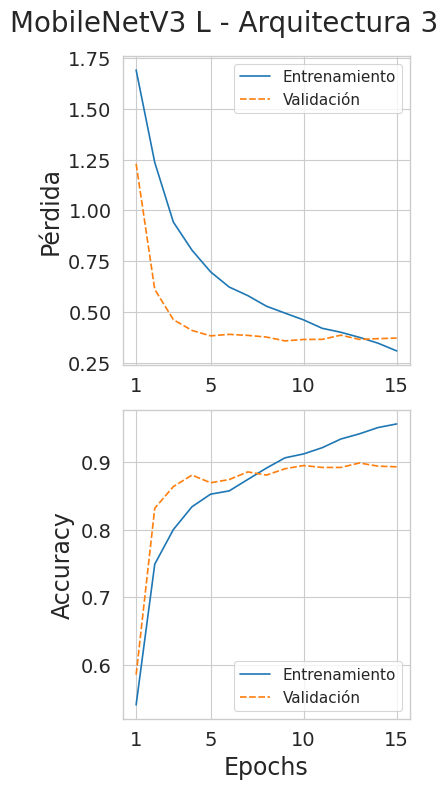

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="MobileNetV3 L - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth
100%|██████████| 21.1M/21.1M [00:00<00:00, 126MB/s] 


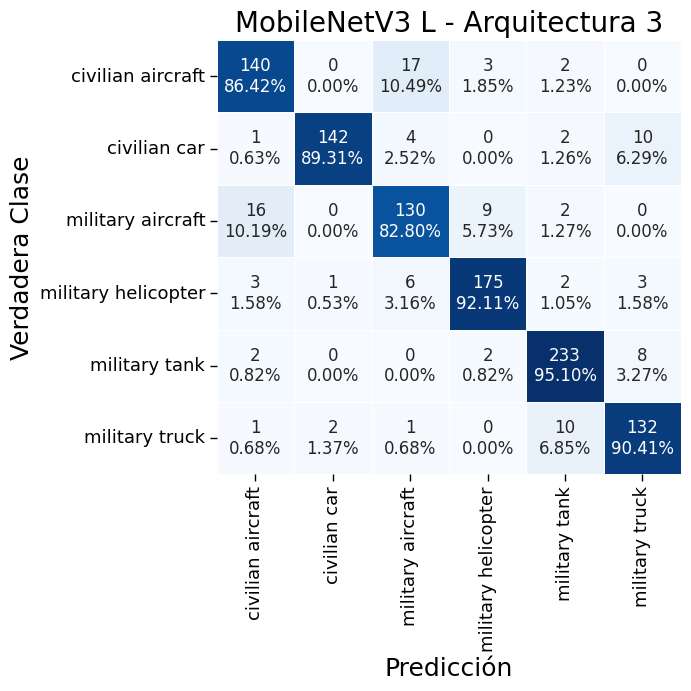

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/mobilenetv3_3relu.pth", weights_only=False)
model_mobilenetv3_best, _, _ = get_model_mobilenetv3(6, arch=3)
model_mobilenetv3_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_mobilenetv3_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "MobileNetV3 L - Arquitectura 3")

#### Arquitectura 4

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_mobilenetv3, loss_fn, optimizer = get_model_mobilenetv3(6, arch=4)
summary(model_mobilenetv3, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV3                                        [1, 6]                    --
├─Sequential: 1-1                                  [1, 960, 7, 7]            --
│    └─Conv2dNormActivation: 2-1                   [1, 16, 112, 112]         --
│    │    └─Conv2d: 3-1                            [1, 16, 112, 112]         (432)
│    │    └─BatchNorm2d: 3-2                       [1, 16, 112, 112]         (32)
│    │    └─Hardswish: 3-3                         [1, 16, 112, 112]         --
│    └─InvertedResidual: 2-2                       [1, 16, 112, 112]         --
│    │    └─Sequential: 3-4                        [1, 16, 112, 112]         (464)
│    └─InvertedResidual: 2-3                       [1, 24, 56, 56]           --
│    │    └─Sequential: 3-5                        [1, 24, 56, 56]           (3,440)
│    └─InvertedResidual: 2-4                       [1, 24, 56, 56]           --
│    │    └─Sequential

Vemos que, de los 21,787,798 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 18,815,846. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_mobilenetv3, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 07:08:12


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 1 - Ended: 20/04/25 07:10:13 - Duration: 121.52s

Training Loss: 1.5100998113404458 - Validation Loss: 0.7025124080040875
Training Accuracy: 0.7539551357733176 - Validation Accuracy: 0.8158640226628895

Epoch: 2 - Started: 20/04/25 07:10:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.38it/s]


Epoch: 2 - Ended: 20/04/25 07:12:15 - Duration: 121.7s

Training Loss: 0.972677775283358 - Validation Loss: 0.4347551429972929
Training Accuracy: 0.8258559622195986 - Validation Accuracy: 0.8762983947119924

Epoch: 3 - Started: 20/04/25 07:12:15


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 3 - Ended: 20/04/25 07:14:16 - Duration: 121.43s

Training Loss: 0.7492452032530486 - Validation Loss: 0.43849948925130505
Training Accuracy: 0.8298701298701299 - Validation Accuracy: 0.8545797922568461

Epoch: 4 - Started: 20/04/25 07:14:16


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.38it/s]


Epoch: 4 - Ended: 20/04/25 07:16:18 - Duration: 121.19s

Training Loss: 0.643326387921376 - Validation Loss: 0.3712753504514694
Training Accuracy: 0.8695395513577332 - Validation Accuracy: 0.886685552407932

Epoch: 5 - Started: 20/04/25 07:16:18


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 5 - Ended: 20/04/25 07:18:19 - Duration: 121.07s

Training Loss: 0.5619936314091754 - Validation Loss: 0.39997422081582684
Training Accuracy: 0.89728453364817 - Validation Accuracy: 0.8847969782813976

Epoch: 6 - Started: 20/04/25 07:18:19


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 6 - Ended: 20/04/25 07:20:20 - Duration: 121.1s

Training Loss: 0.4825578109541936 - Validation Loss: 0.3484511655919692
Training Accuracy: 0.9160566706021251 - Validation Accuracy: 0.902738432483475

Epoch: 7 - Started: 20/04/25 07:20:20


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.36it/s]


Epoch: 7 - Ended: 20/04/25 07:22:21 - Duration: 121.54s

Training Loss: 0.43825923306728476 - Validation Loss: 0.3691163190147456
Training Accuracy: 0.9360094451003542 - Validation Accuracy: 0.8942398489140698

Epoch: 8 - Started: 20/04/25 07:22:21


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


Epoch: 8 - Ended: 20/04/25 07:24:23 - Duration: 121.26s

Training Loss: 0.3661880655519998 - Validation Loss: 0.34601355103008885
Training Accuracy: 0.9455726092089728 - Validation Accuracy: 0.9008498583569405

Epoch: 9 - Started: 20/04/25 07:24:23


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 9 - Ended: 20/04/25 07:26:24 - Duration: 121.17s

Training Loss: 0.3202509802224031 - Validation Loss: 0.3543522094979006
Training Accuracy: 0.961629279811098 - Validation Accuracy: 0.9112370160528801

Epoch: 10 - Started: 20/04/25 07:26:24


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 10 - Ended: 20/04/25 07:28:25 - Duration: 121.48s

Training Loss: 0.28804136901649074 - Validation Loss: 0.4022531312178163
Training Accuracy: 0.9675324675324676 - Validation Accuracy: 0.8942398489140698

Epoch: 11 - Started: 20/04/25 07:28:25


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 11 - Ended: 20/04/25 07:30:26 - Duration: 121.03s

Training Loss: 0.25636802980704093 - Validation Loss: 0.42731793137157664
Training Accuracy: 0.9625737898465171 - Validation Accuracy: 0.8857412653446648

Epoch: 12 - Started: 20/04/25 07:30:26


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.39it/s]


Epoch: 12 - Ended: 20/04/25 07:32:28 - Duration: 121.45s

Training Loss: 0.2368379754584227 - Validation Loss: 0.4250384608612341
Training Accuracy: 0.9801652892561984 - Validation Accuracy: 0.902738432483475

Epoch: 13 - Started: 20/04/25 07:32:28


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


Epoch: 13 - Ended: 20/04/25 07:34:29 - Duration: 121.74s

Training Loss: 0.19024248977205646 - Validation Loss: 0.41756123457761374
Training Accuracy: 0.9850059031877214 - Validation Accuracy: 0.9036827195467422

Epoch: 14 - Started: 20/04/25 07:34:29


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.41it/s]


Epoch: 14 - Ended: 20/04/25 07:36:30 - Duration: 120.99s

Training Loss: 0.17095893310077154 - Validation Loss: 0.4484878373058403
Training Accuracy: 0.9835891381345927 - Validation Accuracy: 0.8961284230406044

Epoch: 15 - Started: 20/04/25 07:36:30


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:07<00:00,  2.40it/s]

Epoch: 15 - Ended: 20/04/25 07:38:32 - Duration: 121.41s

Training Loss: 0.1477526410190917 - Validation Loss: 0.46973569515873403
Training Accuracy: 0.9881936245572609 - Validation Accuracy: 0.898961284230406



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_mobilenetv3.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/mobilenetv3_4relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/mobilenetv3_4relu.pth", weights_only=False)

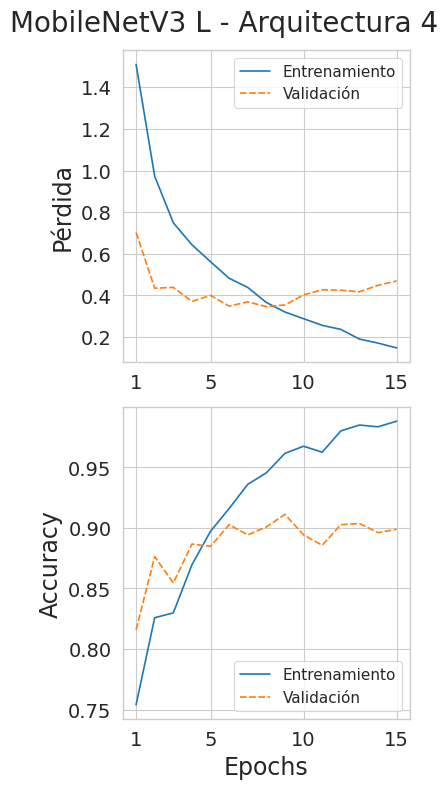

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="MobileNetV3 L - Arquitectura 4")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


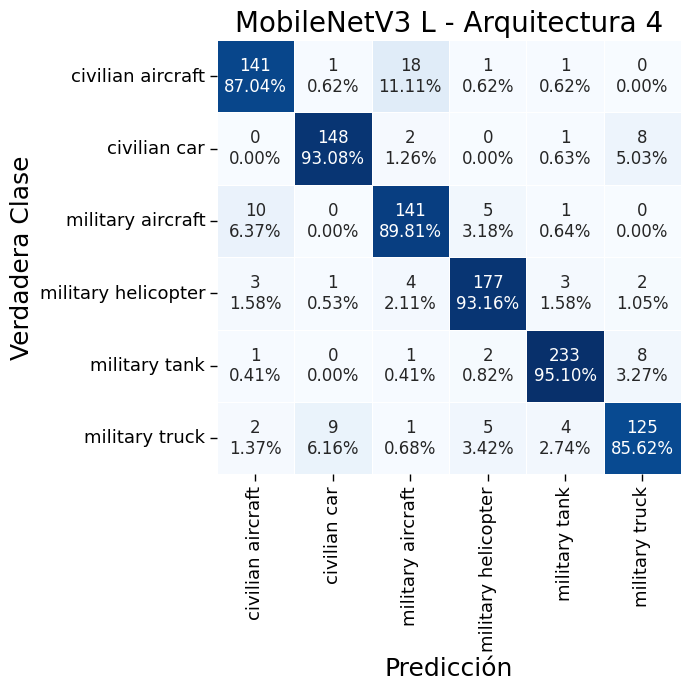

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/mobilenetv3_4relu.pth", weights_only=False)
model_mobilenetv3_best, _, _ = get_model_mobilenetv3(6, arch=4)
model_mobilenetv3_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_mobilenetv3_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "MobileNetV3 L - Arquitectura 4")

### EfficientNetV2

#### Modelo

Vamos a aplicar transfer-learning al modelo EfficientNetV2 pre-entrenado oficial de Pytorch. Comenzamos visualizando la estructura del modelo:

In [ ]:
model_efficientnetv2 = models.efficientnet_v2_m(weights=models.EfficientNet_V2_M_Weights.DEFAULT)
summary(model_efficientnetv2, input_size=(1,3, 224, 224))

Downloading: "https://download.pytorch.org/models/efficientnet_v2_m-dc08266a.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_m-dc08266a.pth
100%|██████████| 208M/208M [00:00<00:00, 222MB/s]


Layer (type:depth-idx)                                  Output Shape              Param #
EfficientNet                                            [1, 1000]                 --
├─Sequential: 1-1                                       [1, 1280, 7, 7]           --
│    └─Conv2dNormActivation: 2-1                        [1, 24, 112, 112]         --
│    │    └─Conv2d: 3-1                                 [1, 24, 112, 112]         648
│    │    └─BatchNorm2d: 3-2                            [1, 24, 112, 112]         48
│    │    └─SiLU: 3-3                                   [1, 24, 112, 112]         --
│    └─Sequential: 2-2                                  [1, 24, 112, 112]         --
│    │    └─FusedMBConv: 3-4                            [1, 24, 112, 112]         5,232
│    │    └─FusedMBConv: 3-5                            [1, 24, 112, 112]         5,232
│    │    └─FusedMBConv: 3-6                            [1, 24, 112, 112]         5,232
│    └─Sequential: 2-3                            

Definimos ahora la función que nos permite obtener el modelo, su función de pérdida y un optimizador (en este caso ADAM con un ratio de aprendizaje de 0.001). El modelo que obtenemos tiene todas las capas congeladas salvo las últimas, que cambiamos un poco:

In [ ]:
def get_model_efficientnetv2(num_classes, arch=3):
    """
    Nos permite obtener un modelo EfficientNetV2-m con una determinada
    configuración listo para entrenar, su optimizador (Adam) y la funcion de
    pérdida de entropía cruzada.
    """

    # Obtenemos el modelo pre-entrenado
    model = models.efficientnet_v2_m(weights=models.EfficientNet_V2_M_Weights.DEFAULT)

    # Congelamos todos los parametros de la parte convolucional
    for param in model.parameters():
        param.requires_grad = False

    # Seleccionamos la configuracion
    if arch == 3:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(2, 2))

        model.classifier = model.fc = nn.Sequential(
                nn.Linear(5120, 1024),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(1024, 512),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(512, 128),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(128, 32),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(32, num_classes)
            )
    elif arch == 4:
        model.avgpool = nn.AdaptiveAvgPool2d(output_size=(3, 3))

        model.classifier = nn.Sequential(
            nn.Linear(3 * 3 * 1280, 2048),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(32, num_classes)
        )
    else:
        raise Exception("Invalid architecture")

    # Perdida: entropia cruzada
    loss_fn = nn.CrossEntropyLoss()

    # Optimizador: Adam
    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    return model.to(DEVICE), loss_fn, optimizer

#### Arquitectura 3

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_efficientnetv2, loss_fn, optimizer = get_model_efficientnetv2(6, arch=3)
summary(model_efficientnetv2, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                                  Output Shape              Param #
EfficientNet                                            [1, 6]                    --
├─Sequential: 1-1                                       [1, 1280, 7, 7]           --
│    └─Conv2dNormActivation: 2-1                        [1, 24, 112, 112]         --
│    │    └─Conv2d: 3-1                                 [1, 24, 112, 112]         (648)
│    │    └─BatchNorm2d: 3-2                            [1, 24, 112, 112]         (48)
│    │    └─SiLU: 3-3                                   [1, 24, 112, 112]         --
│    └─Sequential: 2-2                                  [1, 24, 112, 112]         --
│    │    └─FusedMBConv: 3-4                            [1, 24, 112, 112]         (5,232)
│    │    └─FusedMBConv: 3-5                            [1, 24, 112, 112]         (5,232)
│    │    └─FusedMBConv: 3-6                            [1, 24, 112, 112]         (5,232)
│    └─Sequential: 2-3                  

Vemos que, de los 58,697,050 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 5,838,694. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_efficientnetv2, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 07:38:38


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 1 - Ended: 20/04/25 07:40:53 - Duration: 134.5s

Training Loss: 1.6132182131952315 - Validation Loss: 0.9048895730691797
Training Accuracy: 0.6571428571428571 - Validation Accuracy: 0.7063267233238905

Epoch: 2 - Started: 20/04/25 07:40:53


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.00it/s]


Epoch: 2 - Ended: 20/04/25 07:43:07 - Duration: 133.89s

Training Loss: 1.033287816972875 - Validation Loss: 0.5201147479169509
Training Accuracy: 0.7665879574970484 - Validation Accuracy: 0.8319169027384324

Epoch: 3 - Started: 20/04/25 07:43:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 3 - Ended: 20/04/25 07:45:21 - Duration: 133.89s

Training Loss: 0.836735780559369 - Validation Loss: 0.46014522892587323
Training Accuracy: 0.7958677685950413 - Validation Accuracy: 0.8517469310670444

Epoch: 4 - Started: 20/04/25 07:45:21


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.00it/s]


Epoch: 4 - Ended: 20/04/25 07:47:35 - Duration: 134.33s

Training Loss: 0.7784295998402496 - Validation Loss: 0.45387803105747
Training Accuracy: 0.81086186540732 - Validation Accuracy: 0.8555240793201133

Epoch: 5 - Started: 20/04/25 07:47:35


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 5 - Ended: 20/04/25 07:49:49 - Duration: 133.83s

Training Loss: 0.7173155154754867 - Validation Loss: 0.4276663494460723
Training Accuracy: 0.8309327036599764 - Validation Accuracy: 0.8611898016997167

Epoch: 6 - Started: 20/04/25 07:49:49


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.02it/s]


Epoch: 6 - Ended: 20/04/25 07:52:03 - Duration: 134.63s

Training Loss: 0.6567919347713242 - Validation Loss: 0.4141879572587855
Training Accuracy: 0.8423848878394333 - Validation Accuracy: 0.8668555240793201

Epoch: 7 - Started: 20/04/25 07:52:03


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.02it/s]


Epoch: 7 - Ended: 20/04/25 07:54:17 - Duration: 133.94s

Training Loss: 0.6355912391819171 - Validation Loss: 0.40208080235649557
Training Accuracy: 0.8528925619834711 - Validation Accuracy: 0.8706326723323891

Epoch: 8 - Started: 20/04/25 07:54:17


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.00it/s]


Epoch: 8 - Ended: 20/04/25 07:56:32 - Duration: 134.08s

Training Loss: 0.6195788650370356 - Validation Loss: 0.4105060652774923
Training Accuracy: 0.8617473435655254 - Validation Accuracy: 0.8659112370160529

Epoch: 9 - Started: 20/04/25 07:56:32


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 9 - Ended: 20/04/25 07:58:46 - Duration: 134.67s

Training Loss: 0.5827005443288319 - Validation Loss: 0.40814809062901664
Training Accuracy: 0.8714285714285714 - Validation Accuracy: 0.874409820585458

Epoch: 10 - Started: 20/04/25 07:58:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 10 - Ended: 20/04/25 08:01:00 - Duration: 134.16s

Training Loss: 0.5789730931395916 - Validation Loss: 0.40199418015339794
Training Accuracy: 0.8813459268004723 - Validation Accuracy: 0.8753541076487252

Epoch: 11 - Started: 20/04/25 08:01:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 11 - Ended: 20/04/25 08:03:14 - Duration: 134.02s

Training Loss: 0.5404075086116791 - Validation Loss: 0.3980426928576301
Training Accuracy: 0.8909090909090909 - Validation Accuracy: 0.8687440982058546

Epoch: 12 - Started: 20/04/25 08:03:14


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 12 - Ended: 20/04/25 08:05:29 - Duration: 135.02s

Training Loss: 0.53384838308861 - Validation Loss: 0.39513419568538666
Training Accuracy: 0.899409681227863 - Validation Accuracy: 0.8734655335221907

Epoch: 13 - Started: 20/04/25 08:05:29


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 13 - Ended: 20/04/25 08:07:45 - Duration: 135.36s

Training Loss: 0.5096226770486405 - Validation Loss: 0.3871292655958849
Training Accuracy: 0.907556080283353 - Validation Accuracy: 0.8781869688385269

Epoch: 14 - Started: 20/04/25 08:07:45


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 14 - Ended: 20/04/25 08:10:00 - Duration: 135.08s

Training Loss: 0.4978359341621399 - Validation Loss: 0.390776366871946
Training Accuracy: 0.9103896103896104 - Validation Accuracy: 0.8791312559017942

Epoch: 15 - Started: 20/04/25 08:10:00


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.00it/s]


Epoch: 15 - Ended: 20/04/25 08:12:15 - Duration: 135.38s

Training Loss: 0.4816149619977866 - Validation Loss: 0.38065631687641144
Training Accuracy: 0.9210153482880755 - Validation Accuracy: 0.8800755429650614



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_efficientnetv2.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/efficientnetv2_3relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/efficientnetv2_3relu.pth", weights_only=False)

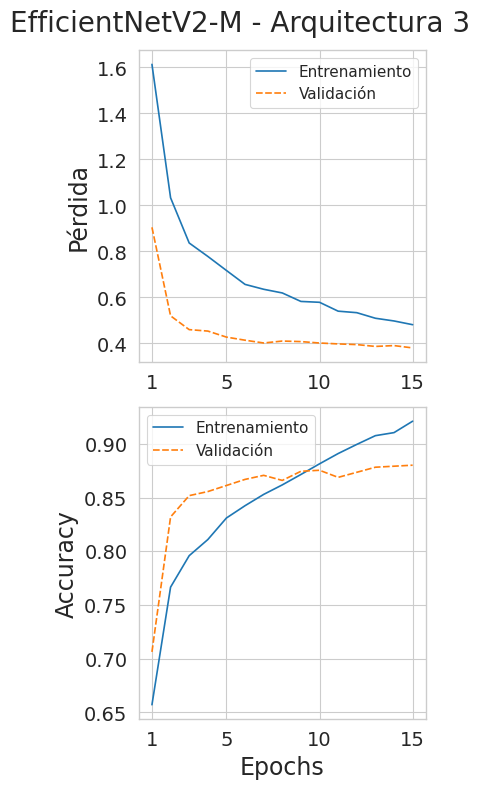

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="EfficientNetV2-M - Arquitectura 3")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_V2_M_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_V2_M_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_v2_m-dc08266a.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_m-dc08266a.pth
100%|██████████| 208M/208M [00:01<00:00, 202MB/s]


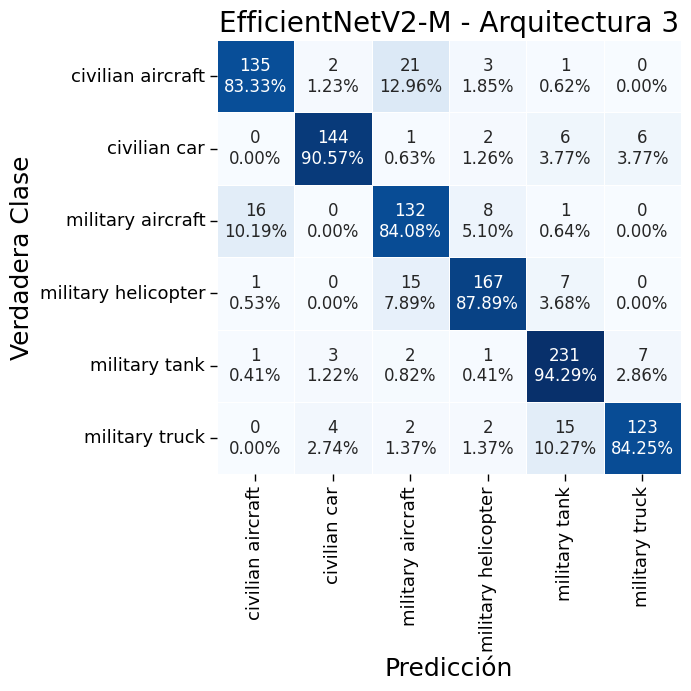

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/efficientnetv2_3relu.pth", weights_only=False)
model_efficientnetv2_best, _, _ = get_model_efficientnetv2(6, arch=3)
model_efficientnetv2_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_efficientnetv2_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "EfficientNetV2-M - Arquitectura 3")

#### Arquitectura 4

Obtenemos el modelo y un resumen de sus capas y parámetros:

In [ ]:
model_efficientnetv2, loss_fn, optimizer = get_model_efficientnetv2(6, arch=4)
summary(model_efficientnetv2, input_size=(1,3, 224, 224))

Layer (type:depth-idx)                                  Output Shape              Param #
EfficientNet                                            [1, 6]                    --
├─Sequential: 1-1                                       [1, 1280, 7, 7]           --
│    └─Conv2dNormActivation: 2-1                        [1, 24, 112, 112]         --
│    │    └─Conv2d: 3-1                                 [1, 24, 112, 112]         (648)
│    │    └─BatchNorm2d: 3-2                            [1, 24, 112, 112]         (48)
│    │    └─SiLU: 3-3                                   [1, 24, 112, 112]         --
│    └─Sequential: 2-2                                  [1, 24, 112, 112]         --
│    │    └─FusedMBConv: 3-4                            [1, 24, 112, 112]         (5,232)
│    │    └─FusedMBConv: 3-5                            [1, 24, 112, 112]         (5,232)
│    │    └─FusedMBConv: 3-6                            [1, 24, 112, 112]         (5,232)
│    └─Sequential: 2-3                  

Vemos que, de los 77,572,442 parámetros entrenables que teníamos originalmente, ahora nos hemos quedado solo con 24,714,086. Entrenamos el modelo:

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, best_model =  train_model(
    model_efficientnetv2, loss_fn, optimizer, train_dataloader_aug, val_dataloader,
    epochs=15)

Epoch: 1 - Started: 20/04/25 08:12:18


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 1 - Ended: 20/04/25 08:14:35 - Duration: 136.69s

Training Loss: 1.459111366698991 - Validation Loss: 0.6679730169913348
Training Accuracy: 0.7422668240850059 - Validation Accuracy: 0.8205854579792257

Epoch: 2 - Started: 20/04/25 08:14:35


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 2 - Ended: 20/04/25 08:16:51 - Duration: 136.16s

Training Loss: 0.9551761381661714 - Validation Loss: 0.4629863097387202
Training Accuracy: 0.8037780401416765 - Validation Accuracy: 0.8630783758262511

Epoch: 3 - Started: 20/04/25 08:16:51


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 3 - Ended: 20/04/25 08:19:08 - Duration: 136.64s

Training Loss: 0.8006230548246583 - Validation Loss: 0.4250747114419937
Training Accuracy: 0.8310507674144038 - Validation Accuracy: 0.8725212464589235

Epoch: 4 - Started: 20/04/25 08:19:08


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.00it/s]


Epoch: 4 - Ended: 20/04/25 08:21:24 - Duration: 136.15s

Training Loss: 0.711540754161664 - Validation Loss: 0.4268036072745043
Training Accuracy: 0.8505312868949233 - Validation Accuracy: 0.8677998111425873

Epoch: 5 - Started: 20/04/25 08:21:24


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.95it/s]


Epoch: 5 - Ended: 20/04/25 08:23:40 - Duration: 136.46s

Training Loss: 0.6573909730163973 - Validation Loss: 0.4003608410849291
Training Accuracy: 0.8711924439197166 - Validation Accuracy: 0.874409820585458

Epoch: 6 - Started: 20/04/25 08:23:40


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]


Epoch: 6 - Ended: 20/04/25 08:25:57 - Duration: 136.93s

Training Loss: 0.6095077377646717 - Validation Loss: 0.4015127157463747
Training Accuracy: 0.8871310507674144 - Validation Accuracy: 0.8772426817752597

Epoch: 7 - Started: 20/04/25 08:25:57


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.97it/s]


Epoch: 7 - Ended: 20/04/25 08:28:13 - Duration: 136.39s

Training Loss: 0.5807359209701196 - Validation Loss: 0.3952028979273403
Training Accuracy: 0.8956316410861865 - Validation Accuracy: 0.8781869688385269

Epoch: 8 - Started: 20/04/25 08:28:13


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.99it/s]


Epoch: 8 - Ended: 20/04/25 08:30:30 - Duration: 136.92s

Training Loss: 0.5456183606119298 - Validation Loss: 0.37722752287107353
Training Accuracy: 0.91086186540732 - Validation Accuracy: 0.8847969782813976

Epoch: 9 - Started: 20/04/25 08:30:30


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.00it/s]


Epoch: 9 - Ended: 20/04/25 08:32:46 - Duration: 135.98s

Training Loss: 0.5054720168683067 - Validation Loss: 0.38106392148663015
Training Accuracy: 0.9194805194805195 - Validation Accuracy: 0.8800755429650614

Epoch: 10 - Started: 20/04/25 08:32:46


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 10 - Ended: 20/04/25 08:35:02 - Duration: 135.76s

Training Loss: 0.4734498409192954 - Validation Loss: 0.3822015892056858
Training Accuracy: 0.9283353010625738 - Validation Accuracy: 0.882908404154863

Epoch: 11 - Started: 20/04/25 08:35:02


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  2.01it/s]


Epoch: 11 - Ended: 20/04/25 08:37:18 - Duration: 135.81s

Training Loss: 0.44470467451793044 - Validation Loss: 0.39153296982540803
Training Accuracy: 0.9361275088547816 - Validation Accuracy: 0.8753541076487252

Epoch: 12 - Started: 20/04/25 08:37:18


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.98it/s]


Epoch: 12 - Ended: 20/04/25 08:39:34 - Duration: 136.16s

Training Loss: 0.4274827884649163 - Validation Loss: 0.3914337070549236
Training Accuracy: 0.9412042502951594 - Validation Accuracy: 0.882908404154863

Epoch: 13 - Started: 20/04/25 08:39:34


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.98it/s]


Epoch: 13 - Ended: 20/04/25 08:41:50 - Duration: 136.23s

Training Loss: 0.40253276655923076 - Validation Loss: 0.36809631524717107
Training Accuracy: 0.9521841794569067 - Validation Accuracy: 0.8885741265344664

Epoch: 14 - Started: 20/04/25 08:41:50


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.98it/s]


Epoch: 14 - Ended: 20/04/25 08:44:07 - Duration: 136.33s

Training Loss: 0.3778080135139067 - Validation Loss: 0.36032837234875736
Training Accuracy: 0.9558441558441558 - Validation Accuracy: 0.8876298394711992

Epoch: 15 - Started: 20/04/25 08:44:07


- Validation Loss and Accuracy: 100%|██████████| 17/17 [00:08<00:00,  1.98it/s]


Epoch: 15 - Ended: 20/04/25 08:46:23 - Duration: 136.51s

Training Loss: 0.36322844117435055 - Validation Loss: 0.35926103460438114
Training Accuracy: 0.9630460448642267 - Validation Accuracy: 0.8923512747875354



Salvamos los resultados en un checkpoint, de forma que podamos seguir entrenando más tarde el modelo si fuera necesario:

In [ ]:
torch.save({
            "epoch": 15,
            "model_state_dict": model_efficientnetv2.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": train_losses[-1],
            "train_losses": train_losses,
            "train_accuracies": train_accuracies,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "best_model": best_model
            }, "/content/drive/MyDrive/tfg/models/efficientnetv2_4relu.pth")

Representamos la evolución de la *accuracy* y la pérdida:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/efficientnetv2_4relu.pth", weights_only=False)

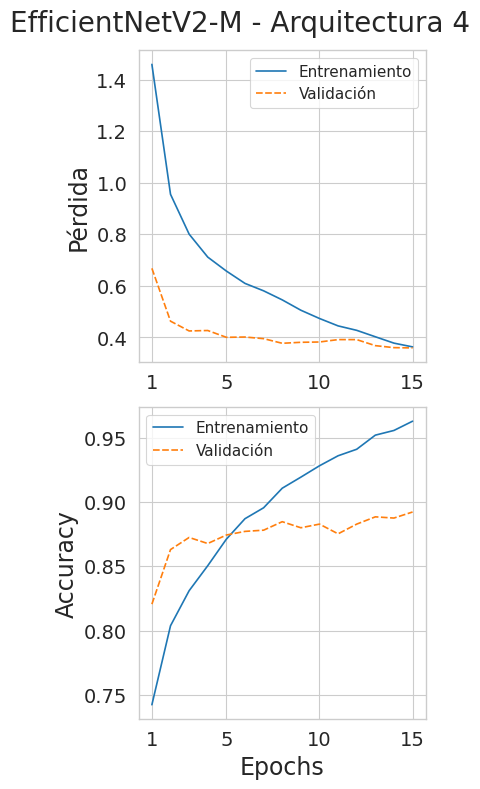

In [ ]:
plot_training_results_classification(
    checkpoint["train_accuracies"],
    checkpoint["val_accuracies"],
    checkpoint["train_losses"],
    checkpoint["val_losses"],
    title="EfficientNetV2-M - Arquitectura 4")

Visualizamos la matriz de confusión del modelo sobre los datos de validación:

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_V2_M_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_V2_M_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


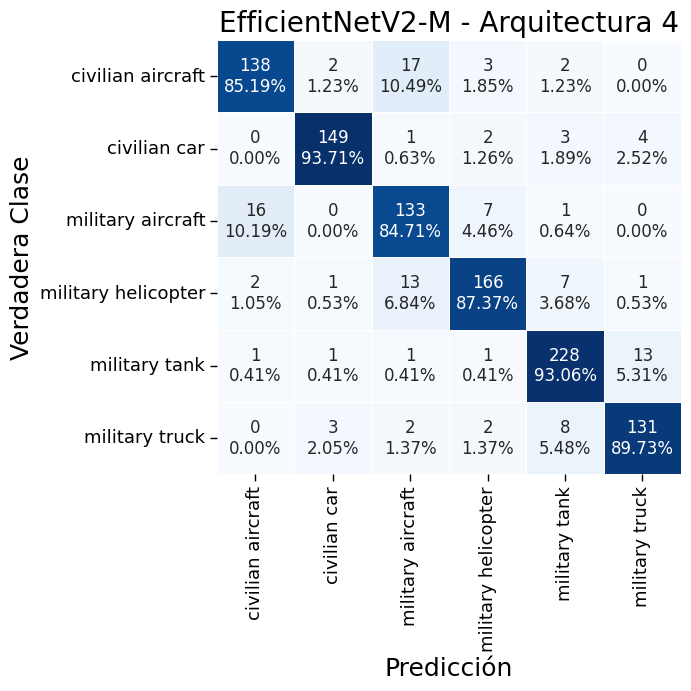

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/efficientnetv2_4relu.pth", weights_only=False)
model_efficientnetv2_best, _, _ = get_model_efficientnetv2(6, arch=4)
model_efficientnetv2_best.load_state_dict(checkpoint["best_model"]["model_state_dict"])
predictions = predict(model_efficientnetv2_best, val_dataloader)
_ = make_cf_matrix(predictions, val_dataset.y.to_numpy(),
                   label_encoder, "EfficientNetV2-M - Arquitectura 4")

## Comparación de Modelos

Cargamos todo los modelos en memoria:

In [ ]:
# ResNet18
checkpoint_resnet18_3relu = torch.load("/content/drive/MyDrive/tfg/models/resnet18_3relu_aug_aux.pth", weights_only=False)
model_resnet18_3relu, _, _ = get_model_resnet18(6, arch=3, activation=nn.ReLU())
model_resnet18_3relu.load_state_dict(checkpoint_resnet18_3relu["best_model"]["model_state_dict"])

checkpoint_resnet18_4relu = torch.load("/content/drive/MyDrive/tfg/models/resnet18_4relu_aug_aux.pth", weights_only=False)
model_resnet18_4relu, _, _ = get_model_resnet18(6, arch=4, activation=nn.ReLU())
model_resnet18_4relu.load_state_dict(checkpoint_resnet18_4relu["best_model"]["model_state_dict"])


# VGG16
checkpoint_vgg16_3relu = torch.load("/content/drive/MyDrive/tfg/models/vgg16_3relu.pth", weights_only=False)
model_vgg16_3relu, _, _ = get_model_vgg16(6, arch=3)
model_vgg16_3relu.load_state_dict(checkpoint_vgg16_3relu["best_model"]["model_state_dict"])

checkpoint_vgg16_4relu = torch.load("/content/drive/MyDrive/tfg/models/vgg16_4relu.pth", weights_only=False)
model_vgg16_4relu, _, _ = get_model_vgg16(6, arch=4)
model_vgg16_4relu.load_state_dict(checkpoint_vgg16_4relu["best_model"]["model_state_dict"])

checkpoint_vgg16_finetuned = torch.load("/content/drive/MyDrive/tfg/models/vgg16_finetuned.pth", weights_only=False)
model_vgg16_finetuned, _, _ = get_model_vgg16(6, arch=5)
model_vgg16_finetuned.load_state_dict(checkpoint_vgg16_finetuned["best_model"]["model_state_dict"])


# VGG19
checkpoint_vgg19_3relu = torch.load("/content/drive/MyDrive/tfg/models/vgg19_3relu.pth", weights_only=False)
model_vgg19_3relu, _, _ = get_model_vgg19(6, arch=3)
model_vgg19_3relu.load_state_dict(checkpoint_vgg19_3relu["best_model"]["model_state_dict"])

checkpoint_vgg19_4relu = torch.load("/content/drive/MyDrive/tfg/models/vgg19_4relu.pth", weights_only=False)
model_vgg19_4relu, _, _ = get_model_vgg19(6, arch=4)
model_vgg19_4relu.load_state_dict(checkpoint_vgg19_4relu["best_model"]["model_state_dict"])

checkpoint_vgg19_finetuned = torch.load("/content/drive/MyDrive/tfg/models/vgg19_finetuned.pth", weights_only=False)
model_vgg19_finetuned, _, _ = get_model_vgg19(6, arch=5)
model_vgg19_finetuned.load_state_dict(checkpoint_vgg19_finetuned["best_model"]["model_state_dict"])


# AlexNet
checkpoint_alexnet_3relu = torch.load("/content/drive/MyDrive/tfg/models/alexnet_3relu.pth", weights_only=False)
model_alexnet_3relu, _, _ = get_model_alexnet(6, arch=3)
model_alexnet_3relu.load_state_dict(checkpoint_alexnet_3relu["best_model"]["model_state_dict"])

checkpoint_alexnet_4relu = torch.load("/content/drive/MyDrive/tfg/models/alexnet_4relu.pth", weights_only=False)
model_alexnet_4relu, _, _ = get_model_alexnet(6, arch=4)
model_alexnet_4relu.load_state_dict(checkpoint_alexnet_4relu["best_model"]["model_state_dict"])

checkpoint_alexnet_finetuned = torch.load("/content/drive/MyDrive/tfg/models/alexnet_finetuned.pth", weights_only=False)
model_alexnet_finetuned, _, _ = get_model_alexnet(6, arch=5)
model_alexnet_finetuned.load_state_dict(checkpoint_alexnet_finetuned["best_model"]["model_state_dict"])


# ResNet50
checkpoint_resnet50_3relu = torch.load("/content/drive/MyDrive/tfg/models/resnet50_3relu.pth", weights_only=False)
model_resnet50_3relu, _, _ = get_model_resnet50(6, arch=3)
model_resnet50_3relu.load_state_dict(checkpoint_resnet50_3relu["best_model"]["model_state_dict"])

checkpoint_resnet50_4relu = torch.load("/content/drive/MyDrive/tfg/models/resnet50_4relu.pth", weights_only=False)
model_resnet50_4relu, _, _ = get_model_resnet50(6, arch=4)
model_resnet50_4relu.load_state_dict(checkpoint_resnet50_4relu["best_model"]["model_state_dict"])


# DenseNet201
checkpoint_densenet201_3relu = torch.load("/content/drive/MyDrive/tfg/models/densenet201_3relu.pth", weights_only=False)
model_densenet201_3relu, _, _ = get_model_densenet201(6)
model_densenet201_3relu.load_state_dict(checkpoint_densenet201_3relu["best_model"]["model_state_dict"])


# GoogleNet
checkpoint_googlenet_3relu = torch.load("/content/drive/MyDrive/tfg/models/googlenet_3relu.pth", weights_only=False)
model_googlenet_3relu, _, _ = get_model_googlenet(6, arch=3)
model_googlenet_3relu.load_state_dict(checkpoint_googlenet_3relu["best_model"]["model_state_dict"])

checkpoint_googlenet_4relu = torch.load("/content/drive/MyDrive/tfg/models/googlenet_4relu.pth", weights_only=False)
model_googlenet_4relu, _, _ = get_model_googlenet(6, arch=4)
model_googlenet_4relu.load_state_dict(checkpoint_googlenet_4relu["best_model"]["model_state_dict"])


# EfficientNetV2
checkpoint_efficientnetv2_3relu = torch.load("/content/drive/MyDrive/tfg/models/efficientnetv2_3relu.pth", weights_only=False)
model_efficientnetv2_3relu, _, _ = get_model_efficientnetv2(6, arch=3)
model_efficientnetv2_3relu.load_state_dict(checkpoint_efficientnetv2_3relu["best_model"]["model_state_dict"])

checkpoint_efficientnetv2_4relu = torch.load("/content/drive/MyDrive/tfg/models/efficientnetv2_4relu.pth", weights_only=False)
model_efficientnetv2_4relu, _, _ = get_model_efficientnetv2(6, arch=4)
model_efficientnetv2_4relu.load_state_dict(checkpoint_efficientnetv2_4relu["best_model"]["model_state_dict"])


# ShuffleNetV2
checkpoint_shufflenetv2x2_3relu = torch.load("/content/drive/MyDrive/tfg/models/shufflenetv2x2_3relu.pth", weights_only=False)
model_shufflenetv2x2_3relu, _, _ = get_model_shufflenetv2x2(6)
model_shufflenetv2x2_3relu.load_state_dict(checkpoint_shufflenetv2x2_3relu["best_model"]["model_state_dict"])


# MobileNetV2
checkpoint_mobilenetv3_3relu = torch.load("/content/drive/MyDrive/tfg/models/mobilenetv3_3relu.pth", weights_only=False)
model_mobilenetv3_3relu, _, _ = get_model_mobilenetv3(6, arch=3)
model_mobilenetv3_3relu.load_state_dict(checkpoint_mobilenetv3_3relu["best_model"]["model_state_dict"])

checkpoint_mobilenetv3_4relu = torch.load("/content/drive/MyDrive/tfg/models/mobilenetv3_4relu.pth", weights_only=False)
model_mobilenetv3_4relu, _, _ = get_model_mobilenetv3(6, arch=4)
model_mobilenetv3_4relu.load_state_dict(checkpoint_mobilenetv3_4relu["best_model"]["model_state_dict"])

<All keys matched successfully>

Hacemos la matriz de confusión conjunta de los 4 mejores modelos en validación:

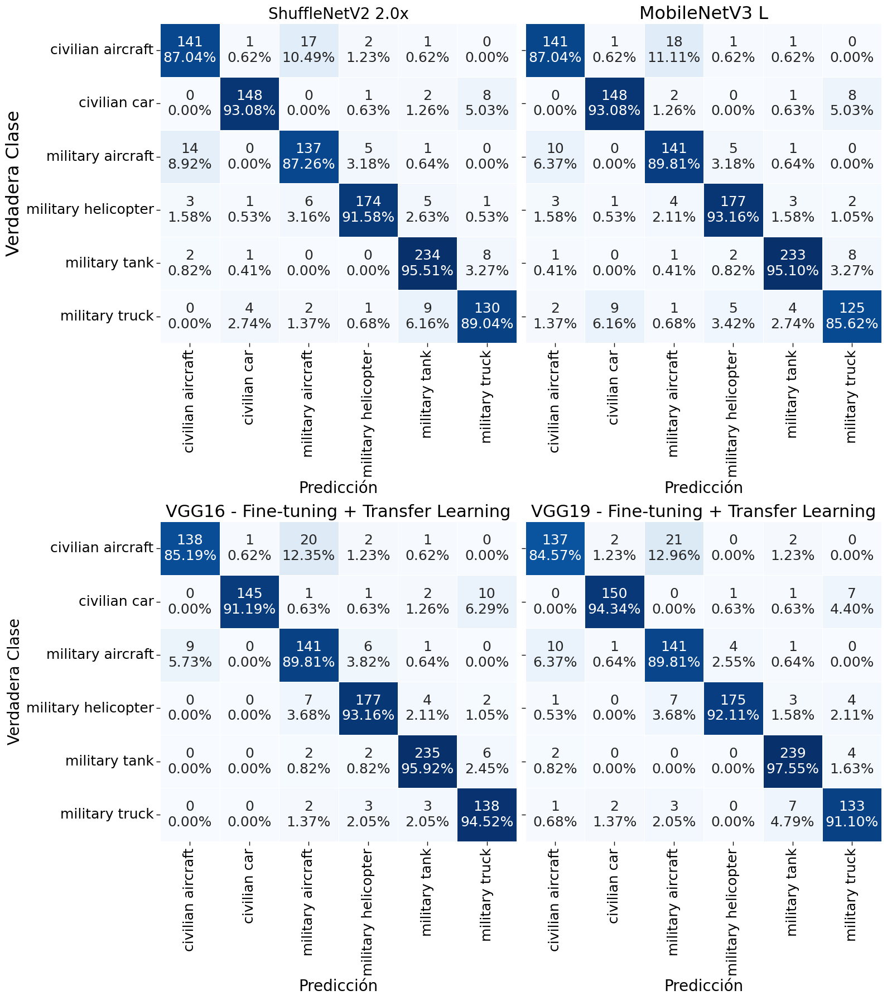

In [ ]:
# Extraemos los verdaderos valores
true_values = val_dataset.y.to_numpy()

# Contamos el numero de etiquetas

# Representamos las matrices de confusion de forma similar a como se hizo en
# la funcion especifica para ello, pero en una rejilla 3x3.
sns.set_context("paper")
fig, axs = plt.subplots(2, 2, figsize=(16, 18))



# DenseNet201
predictions = predict(model_shufflenetv2x2_3relu, val_dataloader)
cf_matrix = confusion_matrix(true_values, predictions)
cf_matrix_percentage = cf_matrix / cf_matrix.sum(axis=1).reshape(-1, 1)
cf_matrix_percentage = cf_matrix_percentage
df_cf_matrix = pd.DataFrame(cf_matrix)
df_cf_matrix.index = label_encoder.classes_
df_cf_matrix.columns = label_encoder.classes_
df_cf_matrix_percentage = pd.DataFrame(cf_matrix_percentage)
df_cf_matrix_percentage.index = label_encoder.classes_
df_cf_matrix_percentage.columns = label_encoder.classes_
group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in (
        cf_matrix_percentage).flatten()]
cf_labels = np.asarray([
        f"{v1}\n{v2}" for v1, v2 in
        zip(group_counts, group_percentages)
    ]).reshape(len(label_encoder.classes_), len(label_encoder.classes_))
cf_plot_densenet = sns.heatmap(df_cf_matrix_percentage,
            annot=cf_labels,
            cmap="Blues", fmt="", linewidth=0.5, linecolor = "white",
            annot_kws={"size": 18}, ax = axs[0, 0], cbar=False)
axs[0, 0].set_xticklabels(axs[0, 0].get_xticklabels(), rotation=90, fontsize=18)
axs[0, 0].set_yticklabels(axs[0, 0].get_yticklabels(), rotation=0, fontsize=18)
axs[0, 0].set_title("ShuffleNetV2 2.0x", fontsize=20)
axs[0, 0].set_xlabel("Predicción", fontsize=20)
axs[0, 0].set_ylabel("Verdadera Clase", fontsize=23)

# MobileNetV3
predictions = predict(model_mobilenetv3_4relu, val_dataloader)
cf_matrix = confusion_matrix(true_values, predictions)
cf_matrix_percentage = cf_matrix / cf_matrix.sum(axis=1).reshape(-1, 1)
cf_matrix_percentage = cf_matrix_percentage
df_cf_matrix = pd.DataFrame(cf_matrix)
df_cf_matrix.index = label_encoder.classes_
df_cf_matrix.columns = label_encoder.classes_
df_cf_matrix_percentage = pd.DataFrame(cf_matrix_percentage)
df_cf_matrix_percentage.index = label_encoder.classes_
df_cf_matrix_percentage.columns = label_encoder.classes_
group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in (
        cf_matrix_percentage).flatten()]
cf_labels = np.asarray([
        f"{v1}\n{v2}" for v1, v2 in
        zip(group_counts, group_percentages)
    ]).reshape(len(label_encoder.classes_), len(label_encoder.classes_))
cf_plot_densenet = sns.heatmap(df_cf_matrix_percentage,
            annot=cf_labels,
            cmap="Blues", fmt="", linewidth=0.5, linecolor = "white",
            annot_kws={"size": 18}, ax = axs[0, 1], cbar=False)
axs[0, 1].set_xticklabels(axs[0, 1].get_xticklabels(), rotation=90, fontsize=18)
axs[0, 1].set_yticklabels("", rotation=0, fontsize=18)
axs[0, 1].set_title("MobileNetV3 L", fontsize=23)
axs[0, 1].set_xlabel("Predicción", fontsize=20)
axs[0, 1].set_ylabel("", fontsize=20)

# VGG-16
predictions = predict(model_vgg16_finetuned, val_dataloader)
num_labels = len(label_encoder.classes_)
cf_matrix = confusion_matrix(true_values, predictions)
cf_matrix_percentage = cf_matrix / cf_matrix.sum(axis=1).reshape(-1, 1)
df_cf_matrix = pd.DataFrame(cf_matrix)
df_cf_matrix.index = label_encoder.classes_
df_cf_matrix.columns = label_encoder.classes_
df_cf_matrix_percentage = pd.DataFrame(cf_matrix_percentage)
df_cf_matrix_percentage.index = label_encoder.classes_
df_cf_matrix_percentage.columns = label_encoder.classes_
group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in (
        cf_matrix_percentage).flatten()]
cf_labels = np.asarray([
        f"{v1}\n{v2}" for v1, v2 in
        zip(group_counts, group_percentages)
    ]).reshape(len(label_encoder.classes_), len(label_encoder.classes_))
cf_plot_densenet = sns.heatmap(df_cf_matrix_percentage,
            annot=cf_labels,
            cmap="Blues", fmt="", linewidth=0.5, linecolor = "white",
            annot_kws={"size": 18}, ax = axs[1, 0], cbar=False)
axs[1, 0].set_xticklabels(axs[1, 0].get_xticklabels(), rotation=90, fontsize=18)
axs[1, 0].set_yticklabels(axs[1, 0].get_yticklabels(), rotation=0, fontsize=18)
axs[1, 0].set_title("VGG16 - Fine-tuning + Transfer Learning", fontsize=22)
axs[1, 0].set_xlabel("Predicción", fontsize=20)
axs[1, 0].set_ylabel("Verdadera Clase", fontsize=20)

# VGG-19
predictions = predict(model_vgg19_finetuned, val_dataloader)
cf_matrix = confusion_matrix(true_values, predictions)
cf_matrix_percentage = cf_matrix / cf_matrix.sum(axis=1).reshape(-1, 1)
df_cf_matrix = pd.DataFrame(cf_matrix)
df_cf_matrix.index = label_encoder.classes_
df_cf_matrix.columns = label_encoder.classes_
df_cf_matrix_percentage = pd.DataFrame(cf_matrix_percentage)
df_cf_matrix_percentage.index = label_encoder.classes_
df_cf_matrix_percentage.columns = label_encoder.classes_
group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in (
        cf_matrix_percentage).flatten()]
cf_labels = np.asarray([
        f"{v1}\n{v2}" for v1, v2 in
        zip(group_counts, group_percentages)
    ]).reshape(len(label_encoder.classes_), len(label_encoder.classes_))
cf_plot_densenet = sns.heatmap(df_cf_matrix_percentage,
            annot=cf_labels,
            cmap="Blues", fmt="", linewidth=0.5, linecolor = "white",
            annot_kws={"size": 18}, ax = axs[1, 1], cbar=False)
axs[1, 1].set_xticklabels(axs[1, 1].get_xticklabels(), rotation=90, fontsize=18)
axs[1, 1].set_yticklabels("", rotation=0, fontsize=15)
axs[1, 1].set_title("VGG19 - Fine-tuning + Transfer Learning", fontsize=22)
axs[1, 1].set_xlabel("Predicción", fontsize=20)
axs[1, 1].set_ylabel("")

plt.tight_layout()

plt.show()

Calculamos la *accuracy*, métrica F1 y métrica F2 en validación de todos los modelos. Calculamos también otras métricas, como el tiempo medio de inferencia o el número de parámetros, aunque no las vamos a usar:

In [ ]:
# Diccionario de los modelos a comparar con sus versiones
models_to_compare = {
    "AlexNet": [model_alexnet_3relu, model_alexnet_4relu, model_alexnet_finetuned],
    "VGG16": [model_vgg16_3relu, model_vgg16_4relu, model_vgg16_finetuned],
    "VGG19": [model_vgg19_3relu, model_vgg19_4relu, model_vgg19_finetuned],
    "ResNet18": [model_resnet18_3relu, model_resnet18_4relu],
    "ResNet50": [model_resnet50_3relu, model_resnet50_4relu],
    "GoogleNet": [model_googlenet_3relu, model_googlenet_4relu],
    "MobileNetV3 L": [model_mobilenetv3_3relu, model_mobilenetv3_4relu],
    "EfficientNetV2-M": [model_efficientnetv2_3relu, model_efficientnetv2_4relu],
    "DenseNet201": [model_densenet201_3relu],
    "ShuffleNetV2 2.0x": [model_shufflenetv2x2_3relu],
}

In [ ]:
# Configuraciones probadas para cada modelo
arquitectura_3 = [True, True, True, True, True, True, True, True, True, True]
arquitectura_4 = [True, True, True, True, True, True, True, True, False, False]
finetuned = [True, True, True, False, False, False, False, False, False, False]

In [ ]:
# Inicializacion
xlabs = models_to_compare.keys()
groups = ["Arquitectura 2", "Arquitectura 3", "Finetuning + Transfer Learning"]
model_archs = []
params_list = []
accuracy_list = []
f1_list = []
f2_list = []
time_list = []
accuracy_matrix = np.zeros((len(xlabs), len(groups)))
f1_matrix = np.zeros((len(xlabs), len(groups)))
f2_matrix = np.zeros((len(xlabs), len(groups)))
y_true_val = val_dataset.y.to_numpy()
n_val = len(y_true_val)

for i, model_name in tqdm(enumerate(xlabs), total=len(xlabs)):
    if arquitectura_3[i]: # Si es de la arquitectura 3, va a su columna

        # Obtenemos el modelo
        model_to_compare = models_to_compare[model_name][0]

        # Comenzamos a cronometrar el tiempo de inferencia
        start = time.time()

        # Predecimos
        y_pred_val = predict(model_to_compare, val_dataloader)

        # Paramos de cronometrar el tiempo de inferencia
        end = time.time()

        # Calculamos la accuracy, la metrica F1 y la metrica F2
        model_accuracy = np.sum(y_true_val == y_pred_val) / n_val
        model_f1 = fbeta_score(y_true_val, y_pred_val, beta=1, average="weighted")
        model_f2 = fbeta_score(y_true_val, y_pred_val, beta=2, average="weighted")

        # Guardamos las metricas calculadas, incluidas tiempo de inferencia y
        # parametros
        accuracy_matrix[i, 0] = model_accuracy
        f1_matrix[i, 0] = model_f1
        f2_matrix[i, 0] = model_f2
        f1_list.append(model_f1)
        f2_list.append(model_f2)
        accuracy_list.append(model_accuracy)
        time_list.append((end - start) / n_val)
        params_list.append(sum(p.numel() for p in model_to_compare.parameters()))

        # Guardamos el nombre de la configuracion
        model_archs.append(model_name + " - " + groups[0])

    else: # Si no es de esta arquitectura, no guardamos nada
        accuracy_matrix[i, 0] = None
        f1_matrix[i, 0] = None
        f2_matrix[i, 0] = None

    if arquitectura_4[i]: # Si es de la arquitectura 4, va a su columna

        # Obtenemos el modelo
        model_to_compare = models_to_compare[model_name][1]

        # Comenzamos a cronometrar el tiempo de inferencia
        start = time.time()

        # Predecimos
        y_pred_val = predict(model_to_compare, val_dataloader)

        # Paramos de cronometrar el tiempo de inferencia
        end = time.time()

        # Calculamos la accuracy, la metrica F1 y la metrica F2
        model_accuracy = np.sum(y_true_val == y_pred_val) / n_val
        model_f1 = fbeta_score(y_true_val, y_pred_val, beta=1, average="weighted")
        model_f2 = fbeta_score(y_true_val, y_pred_val, beta=2, average="weighted")

        # Guardamos las metricas calculadas, incluidas tiempo de inferencia y
        # parametros
        accuracy_matrix[i, 1] = model_accuracy
        f1_matrix[i, 1] = model_f1
        f2_matrix[i, 1] = model_f2
        f1_list.append(model_f1)
        f2_list.append(model_f2)
        accuracy_list.append(model_accuracy)
        time_list.append((end - start) / n_val)
        params_list.append(sum(p.numel() for p in model_to_compare.parameters()))

        # Guardamos el nombre de la configuracion
        model_archs.append(model_name + " - " + groups[1])

    else: # Si no es de esta arquitectura, no guardamos nada
        accuracy_matrix[i, 1] = None
        f1_matrix[i, 1] = None
        f2_matrix[i, 1] = None

    if finetuned[i]: # Si es con fine-tuning, va a su columna

        # Obtenemos el modelo
        model_to_compare = models_to_compare[model_name][2]

        # Comenzamos a cronometrar el tiempo de inferencia
        start = time.time()

        # Predecimos
        y_pred_val = predict(model_to_compare, val_dataloader)

        # Paramos de cronometrar el tiempo de inferencia
        end = time.time()

        # Calculamos la accuracy, la metrica F1 y la metrica F2
        model_accuracy = np.sum(y_true_val == y_pred_val) / n_val
        model_f1 = fbeta_score(y_true_val, y_pred_val, beta=1, average="weighted")
        model_f2 = fbeta_score(y_true_val, y_pred_val, beta=2, average="weighted")
        accuracy_matrix[i, 2] = model_accuracy

        # Guardamos las metricas calculadas, incluidas tiempo de inferencia y
        # parametros
        f1_matrix[i, 2] = model_f1
        f2_matrix[i, 2] = model_f2
        f1_list.append(model_f1)
        f2_list.append(model_f2)
        accuracy_list.append(model_accuracy)
        time_list.append((end - start) / n_val)
        params_list.append(sum(p.numel() for p in model_to_compare.parameters()))

        # Guardamos el nombre de la configuracion
        model_archs.append(model_name + " - " + groups[2])

    else: # Si no es de esta arquitectura, no guardamos nada
        accuracy_matrix[i, 2] = None
        f1_matrix[i, 2] = None
        f2_matrix[i, 2] = None

# Convertimos la matriz de accuracy en dataframe y nombramos filas y columnas
accuracy_df = pd.DataFrame(accuracy_matrix)
accuracy_df.columns = groups
accuracy_df.index = xlabs

# Convertimos la matriz de F1 en dataframe y nombramos filas y columnas
f1_df = pd.DataFrame(f1_matrix)
f1_df.columns = groups
f1_df.index = xlabs

# Convertimos la matriz de F2 en dataframe y nombramos filas y columnas
f2_df = pd.DataFrame(f2_matrix)
f2_df.columns = groups
f2_df.index = xlabs

# Hacemos un dataframe con toda la infromacion obtenida
params_time_df = pd.DataFrame({
    "Tiempo Medio de Inferencia (s)": time_list,
    "Número de Parámetros": params_list,
    "Precisión": accuracy_list,
    "Puntuación F1": f1_list,
    "Puntuación F2": f2_list,})
params_time_df.index = model_archs


100%|██████████| 10/10 [02:40<00:00, 16.10s/it]


Representamos la *accuracy*, la métrica F1 y la métrica F2:

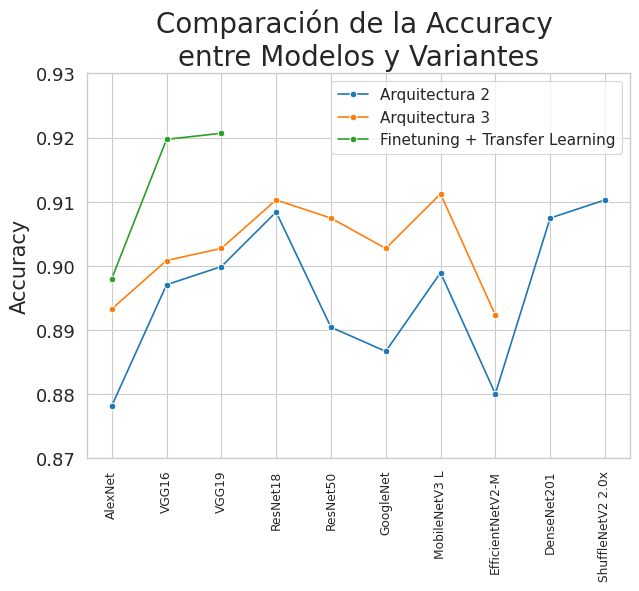

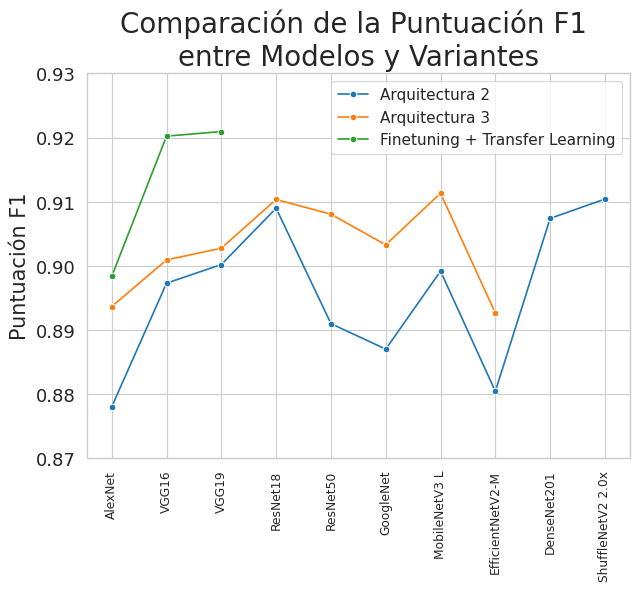

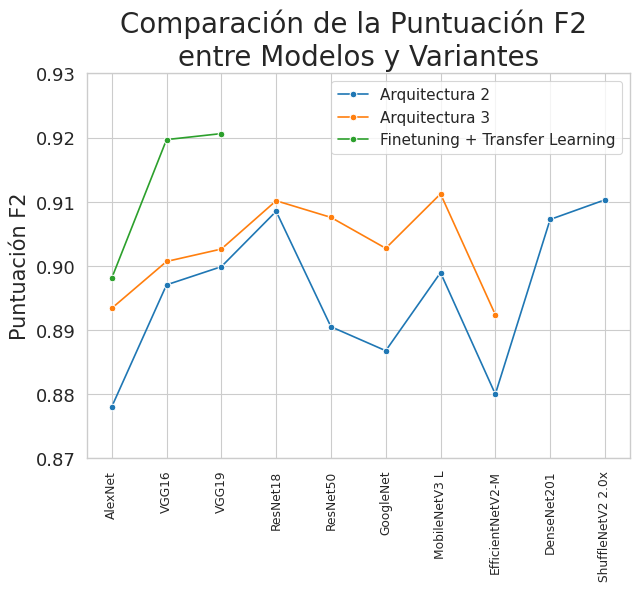

In [ ]:
# Colores de cada configuracion
colors = ["blue", "red", "green"]

# Tipo de metrica
metrics = ["Accuracy", "Puntuación F1", "Puntuación F2"]

# Rango para cada metrica
yticks_labs = np.array([
    np.linspace(0.87, 0.93, 7),
    np.linspace(0.87, 0.93, 7),
    np.linspace(0.87, 0.93, 7)
])

# Dibujamos el mismo tipo de grafica de lineas pero para cada metrica
j = 0
for metric, df in zip(metrics, [accuracy_df, f1_df, f2_df]):
    with sns.axes_style("whitegrid"):
        fig, ax = plt.subplots(figsize=(7, 5))
        for i, var in enumerate(df.columns):
            sns.lineplot(
                ax=ax,
                data=df.reset_index(),
                x="index",
                y=var,
                marker="o",

                label=var
            )

        ax.set_xlabel("")
        ax.set_ylabel(metric, fontsize=15)
        ax.set_yticks(yticks_labs[j])
        ax.set_yticklabels(ax.get_yticklabels(), fontsize=13)
        ax.set_title(f"Comparación de la {metric} \nentre Modelos y Variantes", fontsize=20)
        ax.legend(fontsize=11)
    j += 1

    plt.xticks(ticks=range(len(xlabs)), labels=xlabs, rotation=90)

## Análisis de Errores: Grad-CAM

Vamos a usar Grad-CAM para hacer análisis de errores de nuestro mejor modelo, VGG19 entrenado con *transfer learning* y *fine-tuning*. Estudiamos el caso de confusión de clases que consideramos más importante: aquel en que se confunden *civilian aircraft* y *military aircraft*.

### Modelo

Cargamos el modelo en memoria:

In [ ]:
checkpoint = torch.load("/content/drive/MyDrive/tfg/models/vgg19_finetuned.pth", weights_only=False)
model_vgg19, _, _ = get_model_vgg19(6, arch=5)
model_vgg19.load_state_dict(checkpoint["best_model"]["model_state_dict"])

<All keys matched successfully>

Analizamos su estructura:

In [ ]:
summary(model_vgg19, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 6]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         (1,792)
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         (36,928)
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        (73,856)
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        (147,584)
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]    

### Dataset

Definimos una clase para el dataset que utilizaremos para las CAM. Esta clase está preparada para que , cuando se entreguen las imágenes al modelo, también se entregue la imagen original:

In [ ]:
class ClassificationDatasetCAM(Dataset):
    def __init__(self, img_labels, folder, transform, w=224, h=224):
      self.y = img_labels["object_class"]
      self.files = img_labels["filename"]
      self.folder = folder
      self.w = w
      self.h = h
      self.transform = transform
      self.resize = transforms.Compose([
          transforms.ToPILImage(),
          transforms.Resize((self.w, self.h)),
          transforms.ToTensor()
      ])


    def __len__(self):
      return len(self.y)

    def __getitem__(self, ix):
      # Seleccionamos la imagen y la leermos
      nombre = self.files.iloc[ix]
      path = f"{self.folder}{nombre}"
      image = cv2.imread(path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      # Seleccionamos la clase
      target = self.y.iloc[ix]
      return image, target

    def collate_fn(self, batch):
        _images, targets = tuple(zip(*batch))

        # Redimensionamos las imagenes originales para que casen con las
        # transformadas
        _images = [self.resize(_image)[None] for _image in _images]

        # Transformamos las imagenes si procede
        if self.transform is not None:
            images = [self.transform(image[0])[None] for image in _images]
        else:
            images = _images

        _images = torch.cat(_images, dim=0)
        images = torch.cat(images, dim=0)
        targets = torch.tensor(targets).long()
        return images.to(DEVICE), targets.to(DEVICE), _images.to(DEVICE)

In [ ]:
# Nuestra transformacion
NORMALIZE_PYTORCH = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                         std=[0.229, 0.224, 0.225])

# Conjunto de entrenamiento
train_dataset_cam = ClassificationDatasetCAM(
    train_labels,
    "/content/classification_dataset/images/",
    NORMALIZE_PYTORCH
)
train_dataloader_cam = DataLoader(
    train_dataset_cam,
    batch_size=32,
    collate_fn=train_dataset_cam.collate_fn
)

# Conjunto de validacion
val_dataset_cam = ClassificationDatasetCAM(
    val_labels,
    "/content/classification_dataset/images/",
    STANDARD_TRANSFORM
)
val_dataloader_cam = DataLoader(
    val_dataset_cam,
    batch_size=32,
    collate_fn=val_dataset_cam.collate_fn
)

### VGGCAM

Creamos la clase de la CAM para la VGG:

In [ ]:
class VGGCAM(nn.Module):
    def __init__(self, model):
        super(VGGCAM, self).__init__()

        for param in model.parameters():
            param.requires_grad = True

        # Obtenemos el modelo pre - entrenado
        self.vgg = model

        # Accedemos al la ultima capa convolucional
        self.features_conv = self.vgg.features[:-1]

        # Creamos al maxpooling de la ultima capa convolucional
        self.max_pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

        # Creamos al maxpooling adaptativo final
        self.adaptative_avg_pool = nn.AdaptiveAvgPool2d(output_size=(7,7))

        # Accedemos al clasificador del lmodelo
        self.classifier = self.vgg.classifier

        # Inicializamos los gradientes
        self.gradients = None

    def activations_hook(self, grad):
        """
        Guarda los gradientes de las activaciones una vez la llame el hook
        """
        self.gradients = grad

    def forward(self, x):
        """
        Hace propagacion hacia delante del modelo y registra el hook.
        """
        # Hacemos la propagacion hacia delante hasta la capa convolucional final
        x = self.features_conv(x)

        # Registramos el hook
        h = x.register_hook(self.activations_hook)

        # Hacemos el resto de la propagacion hacia delante
        x = self.max_pool(x)
        x = self.adaptative_avg_pool(x)
        x = x.view((1, -1)) # Se podria haber usado una capa de flatten
        x = self.classifier(x)
        return x

    def get_activations_gradient(self):
        """
        Extrae los gradientes de las activaciones.
        """

        return self.gradients

    def get_activations(self, x):
        """
        Extrae las activaciones de la ultima capa convolucional.
        """
        return self.features_conv(x)

Instanciamos nuestro modelo con Grad-CAM:

In [ ]:
vgg = VGGCAM(model_vgg19)

### Aplicación

Predecimos en todo el *dataset* de validación:

In [ ]:
predictions = predict(model_vgg19, val_dataloader_cam)

In [ ]:
def predict_classification(image, dataloader, model):
    model.eval()
    data = dataloader.collate_fn([(image, 0)])[0]
    outputs = model(data)
    _, preds = torch.max(outputs.data , 1)
    return preds

In [ ]:
predict_classification(val_dataset_cam[2][0], val_dataloader_cam, model_vgg19)

tensor([2], device='cuda:0')

Extraemos las etiquetas verdaderas de validación:

In [ ]:
val_labels_cam = val_dataset_cam.y.to_numpy()

Un recordatorio de las clases:

In [ ]:
label_encoder.classes_

array(['civilian aircraft', 'civilian car', 'military aircraft',
       'military helicopter', 'military tank', 'military truck'],
      dtype='<U19')

Extraemos los índices de las imagenes en las que se haya confundido *civilian aircraft* con *military aircraft*.

In [ ]:
selected_indexes = get_indexes("civilian aircraft", "military aircraft",
            label_encoder, val_labels_cam, predictions)
selected_indexes

array([  60,  127,  181,  239,  254,  257,  351,  422,  494,  546,  561,
        603,  635,  850,  853,  855,  880,  968,  978,  988, 1041])

array([  60,  127,  181,  239,  254,  257,  351,  422,  494,  546,  561,
        603,  635,  850,  853,  855,  880,  968,  978,  988, 1041])

Seleccionamos algunas de esas imágenes:

In [ ]:
imgs = [val_dataset_cam[selected_indexes[i]][0] for i in [3, 13, 20]] # 2, 3, 7, 6, 13, 15
imgs_class = label_encoder.transform(["civilian aircraft"])[0]

Obtenemos Grad-CAM:

<ipython-input-5-e42c39d29f6e>:349: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  heatmap = np.maximum(heatmap, 0)
<ipython-input-5-e42c39d29f6e>:350: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  counterfactual_heatmap = np.maximum(counterfactual_heatmap, 0)
<ipython-input-5-e42c39d29f6e>:370: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  superimposed_img =  original_img.permute(1, 2, 0).to("cpu") + heatmap_res * 0.2
<ipython-input-5-e42c39d29f6e>:371: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  superimposed_img_counterfactual =  original_img.permute(1, 2, 0).to("cpu") + counterfactual_heatmap_res * 0.2


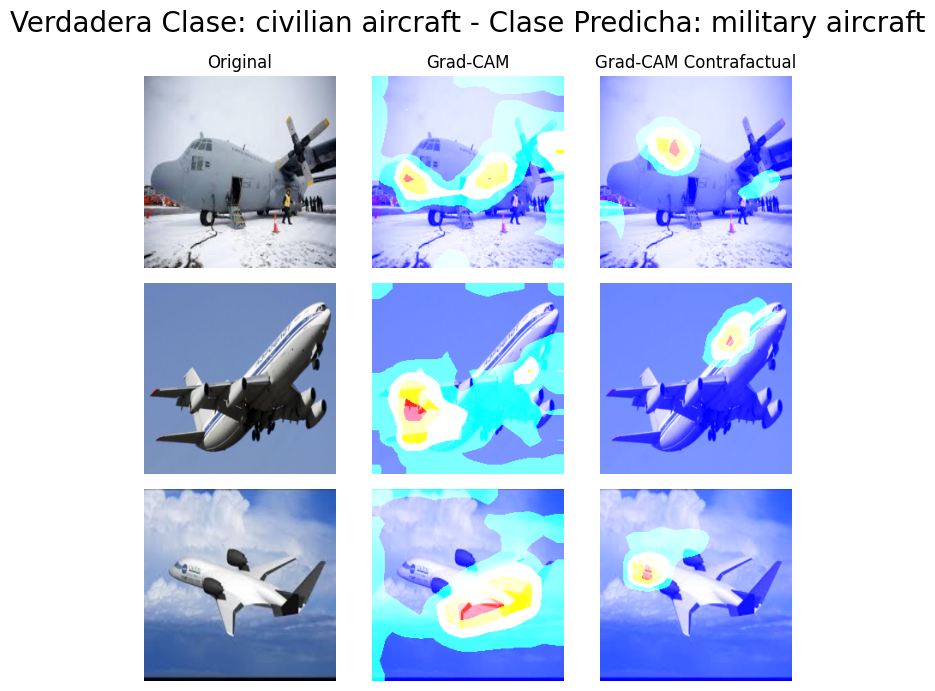

In [ ]:
get_gradcam(vgg, imgs, imgs_class, val_dataloader_cam.collate_fn, label_encoder)